### Code for saving various csv files (science and various types of background)
Contains options for applying event 2 filtering (or not) and also has some ML options like SVM and bagging PU classifier and a bunch of utilities.

This definitely needs to be cleaned up to just save csv files and load them up elsewhere.

In [ ]:
# Does the proper things to the bg files in order to compare them to a set of 
# science files

In [1]:
# this whole cell is from hypercore.py, Grant's code
"""
hyperscreen is an improved background rejection algorithm
for tap by tap making a hyperbola shape.
It is more selective than Murray 2000's algorithm.
"""

from __future__ import division
from __future__ import print_function

import colorama
from tqdm import tqdm as progressbar
import sys
import os

import warnings

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

from astropy.io import fits
from astropy.table import Table


import skimage.data as data
import skimage.segmentation as seg
import skimage.filters as filters
import skimage.draw as draw
import skimage.color as color

import pandas as pd
import numpy as np

import matplotlib
import random
import shutil

import seaborn as sns
print(sns.__version__)

import numpy.ma as ma

np.seterr(divide='ignore')

colorama.init()



class HRCevt1:
    """This is a conceptual class representation of a Chandra High Resolution Camera (HRC) Level 1 Event File
    :return: HRCevt1 object
    :rtype: pandas.DataFrame or astropy.table.table.Table
    """

    def __init__(self, evt1file, verbose=False, as_astropy_table=False):
        """The constructor method for the HRCevt1 class
        :param evt1file: A .fits (or fits.gz) file containing the level 1 event list. If downloaded from the Chandra database, this file always has a *evt1.fits extension. This event list includes all events telemetered.
        :type evt1file: .fits or .fits.gz
        :param verbose: Set verbose=True to make the constructor chatty on the command line, defaults to False
        :type verbose: bool, optional
        :param as_astropy_table: Set as_astropy_table to True in order to have the HRCevt1 constructor method return an Astropy Table object, rather than a Pandas DataFrame. Defaults to False.
        :type as_astropy_table: bool, optional
        """

        # Define how chatty to be
        self.verbose = verbose

        if self.verbose is True:
            print(colorama.Fore.BLUE + '\nParsing HRC EVT1 file...', end=" ")
        # Do a standard read in of the EVT1 fits table
        self.filename = evt1file
        self.hdulist = fits.open(evt1file)
        self.data = Table(self.hdulist[1].data)
        self.header = self.hdulist[1].header
        self.gti = self.hdulist[2].data
        self.hdulist.close()  # Don't forget to close your fits file!

        # Make sure the user isn't running this on an ACIS observation!
        if self.header["DETNAM"][:4] == 'ACIS':
            raise Exception(
                "ERROR: HRCevt1 objects can only be initialized for Chandra/HRC observations. This is a Chandra/ACIS observation.")

        # Populate the fp, fb values for ever event
        if self.verbose is True:
            print(colorama.Fore.BLUE + 'Calculating fp, fb values...', end=" ")
        fp_u, fb_u, fp_v, fb_v = self.calculate_fp_fb()

        # Populate the fp, fb values for ever event
        if self.verbose is True:
            print(colorama.Fore.BLUE + 'Applying GTI mask... ', end=" ")
        self.gti.starts = self.gti['START']
        self.gti.stops = self.gti['STOP']

        self.gtimask = (self.data["time"] > self.gti.starts[0]) & (
            self.data["time"] < self.gti.stops[-1])

        # Populate the fp, fb values for every event
        if self.verbose is True:
            print(colorama.Fore.BLUE + 'Populating metadata columns...', end=" ")
        self.data["fp_u"] = fp_u
        self.data["fb_u"] = fb_u
        self.data["fp_v"] = fp_v
        self.data["fb_v"] = fb_v

        # Make individual status bit columns with legible names
        self.data["AV3 corrected for ringing"] = self.data["status"][:, 0]
        self.data["AU3 corrected for ringing"] = self.data["status"][:, 1]
        self.data["Event impacted by prior event (piled up)"] = self.data["status"][:, 2]
        # Bit 4 (Python 3) is spare
        self.data["Shifted event time"] = self.data["status"][:, 4]
        self.data["Event telemetered in NIL mode"] = self.data["status"][:, 5]
        self.data["V axis not triggered"] = self.data["status"][:, 6]
        self.data["U axis not triggered"] = self.data["status"][:, 7]
        self.data["V axis center blank event"] = self.data["status"][:, 8]
        self.data["U axis center blank event"] = self.data["status"][:, 9]
        self.data["V axis width exceeded"] = self.data["status"][:, 10]
        self.data["U axis width exceeded"] = self.data["status"][:, 11]
        self.data["Shield PMT active"] = self.data["status"][:, 12]
        # Bit 14 (Python 13) is hardware spare
        self.data["Upper level discriminator not exceeded"] = self.data["status"][:, 14]
        self.data["Lower level discriminator not exceeded"] = self.data["status"][:, 15]
        self.data["Event in bad region"] = self.data["status"][:, 16]
        self.data["Amp total on V or U = 0"] = self.data["status"][:, 17]
        self.data["Incorrect V center"] = self.data["status"][:, 18]
        self.data["Incorrect U center"] = self.data["status"][:, 19]
        self.data["PHA ratio test failed"] = self.data["status"][:, 20]
        self.data["Sum of 6 taps = 0"] = self.data["status"][:, 21]
        self.data["Grid ratio test failed"] = self.data["status"][:, 22]
        self.data["ADC sum on V or U = 0"] = self.data["status"][:, 23]
        self.data["PI exceeding 255"] = self.data["status"][:, 24]
        self.data["Event time tag is out of sequence"] = self.data["status"][:, 25]
        self.data["V amp flatness test failed"] = self.data["status"][:, 26]
        self.data["U amp flatness test failed"] = self.data["status"][:, 27]
        self.data["V amp saturation test failed"] = self.data["status"][:, 28]
        self.data["U amp saturation test failed"] = self.data["status"][:, 29]
        self.data["V hyperbolic test failed"] = self.data["status"][:, 30]
        self.data["U hyperbolic test failed"] = self.data["status"][:, 31]
        self.data["Hyperbola test passed"] = np.logical_not(np.logical_or(
            self.data['U hyperbolic test failed'], self.data['V hyperbolic test failed']))
        self.data["Hyperbola test failed"] = np.logical_or(
            self.data['U hyperbolic test failed'], self.data['V hyperbolic test failed'])

        self.obsid = self.header["OBS_ID"]
        self.obs_date = self.header["DATE"]
        self.target = self.header["OBJECT"]
        self.detector = self.header["DETNAM"]
        self.grating = self.header["GRATING"]
        self.exptime = self.header["EXPOSURE"]

        self.numevents = len(self.data["time"])
        self.goodtimeevents = len(self.data["time"][self.gtimask])
        self.badtimeevents = self.numevents - self.goodtimeevents

        self.hyperbola_passes = np.sum(np.logical_or(
            self.data['U hyperbolic test failed'], self.data['V hyperbolic test failed']))
        self.hyperbola_failures = np.sum(np.logical_not(np.logical_or(
            self.data['U hyperbolic test failed'], self.data['V hyperbolic test failed'])))

        if self.hyperbola_passes + self.hyperbola_failures != self.numevents:
            warnings.warn("Number of Hyperbola Test Failures and Passes ({}) does not equal total number of events ({}).".format(
                self.hyperbola_passes + self.hyperbola_failures, self.numevents))

        if self.verbose is True:
            print(colorama.Fore.GREEN + 'Done')

        
        if as_astropy_table is False:
            # Multidimensional columns don't grok with Pandas
            self.data.remove_column('status')
            self.data = self.data.to_pandas()

        if self.verbose is True:
            print(colorama.Fore.GREEN + 'Done')

    def __str__(self):
        """This method returns the string representation of the HRCevt1 object. It is called when the print() or str() function is invoked on an HRCevt1 object.
        :return: A string describing the HRCevt1 object
        :rtype: str
        """
        return "HRC EVT1 object with {} events. Data is packaged as a Pandas Dataframe (or an Astropy Table if as_astropy_table=True on initialization.)".format(self.numevents)

    def calculate_fp_fb(self):
        """Method to calculate the Fine Position (f_p) and normalized central tap amplitude (fb) for the HRC U- and V- axes.
        :return: fp_u, fb_u, fp_v, fb_v; the calculated fine positions and normalized central tap amplitudes, respectively, for the HRC U- and V- axes of the I or S detector
        :rtype: float
        """

        a_u = self.data["au1"]  # otherwise known as "a1"
        b_u = self.data["au2"]  # "a2"
        c_u = self.data["au3"]  # "a3"

        a_v = self.data["av1"]
        b_v = self.data["av2"]
        c_v = self.data["av3"]

        with np.errstate(invalid='ignore'):
            # Do the U axis
            fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
            fb_u = b_u / (a_u + b_u + c_u)

            # Do the V axis
            fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
            fb_v = b_v / (a_v + b_v + c_v)

        return fp_u, fb_u, fp_v, fb_v

    def threshold(self, img, bins, softening=None):
        """HyperScreen (a) separates events by both axis and tap, (b) creates an
        image (a 2D histogram, with bin sizes dependent on the total number of counts
        in the observation), then (c) performs efficient image segmentation on that image
        by applying Otsu's Method (https://en.wikipedia.org/wiki/Otsu%27s_method) to
        create a bespoke threshold for each tap image. This efficiently separates the 'boomerang'
        locus for 'real' events with the 'everything else' region for background events. This function
        performs operation (c).
        Arguments:
            img {[type]} -- [description]
            bins {[type]} -- [description]
        """

        # You don't want to be verbose in this function; it's called many times

        thresh_img = img.copy()
        thresh_img[img == 0] = np.nan

        if softening is None:
            thresh = filters.threshold_otsu(img)
        elif isinstance(softening, float):
            otsu_thresh = filters.threshold_otsu(img)
            thresh = otsu_thresh - (otsu_thresh * softening)

        # "If you don't ignore the warning, you'll get a warning" ~~ G. Tremblay
        with np.errstate(invalid='ignore'):
            thresh_img[thresh_img < thresh] = np.nan
        thresh_img[:int(bins[1] / 2), :] = np.nan
    #     thresh_img[:,int(bins[1]-5):] = np.nan

        return thresh_img

    def hyperscreen(self, softening=1.0):
        """[summary]
        Returns:
            [type] -- [description]
        """

        data = self.data[self.data['Hyperbola test passed']]

        # taprange = range(data['crsu'].min(), data['crsu'].max() + 1)
        taprange_u = range(data['crsu'].min() - 1, data['crsu'].max() + 1)
        taprange_v = range(data['crsv'].min() - 1, data['crsv'].max() + 1)

        if self.numevents < 100000:
            bins = [50, 50]  # number of bins
        else:
            bins = [200, 200]

        # Instantiate these empty dictionaries to hold our results
        u_axis_survivals = {}
        v_axis_survivals = {}

        if self.verbose is False:
            progressbar_disable = True
        elif self.verbose is True:
            progressbar_disable = False

        if self.verbose is True:
            print(colorama.Fore.YELLOW + "\nApplying Otsu's Method to every Tap-specific boomerang across U-axis taps {} through {}".format(taprange_u[0] + 1, taprange_u[-1] + 1))

        skiptaps_u = []
        skiptaps_v = []

        for tap in progressbar(taprange_u, disable=progressbar_disable, ascii=False):
            # Do the U axis
            tapmask_u = data[data['crsu'] == tap].index.values
            if len(tapmask_u) < 20:
                skiptaps_u.append((tap + 1, len(tapmask_u)))
                continue
            keep_u = np.isfinite(data['fb_u'][tapmask_u])

            hist_u, xbounds_u, ybounds_u = np.histogram2d(
                data['fb_u'][tapmask_u][keep_u], data['fp_u'][tapmask_u][keep_u], bins=bins)
            thresh_hist_u = self.threshold(
                hist_u, bins=bins, softening=softening)

            posx_u = np.digitize(data['fb_u'][tapmask_u], xbounds_u)
            posy_u = np.digitize(data['fp_u'][tapmask_u], ybounds_u)
            hist_mask_u = (posx_u > 0) & (posx_u <= bins[0]) & (
                posy_u > -1) & (posy_u <= bins[1])

            # Values of the histogram where the points are
            hhsub_u = thresh_hist_u[posx_u[hist_mask_u] -
                                    1, posy_u[hist_mask_u] - 1]
            pass_fb_u = data['fb_u'][tapmask_u][hist_mask_u][np.isfinite(
                hhsub_u)]

            u_axis_survivals["U Axis Tap {:02d}".format(
                tap)] = pass_fb_u.index.values

        if self.verbose is True:
            print("\nThe following {} U-axis taps were skipped due to a (very) low number of counts: ".format(len(skiptaps_u)))
            for skipped_tap in skiptaps_u:
                tapnum, counts = skipped_tap
                print("Skipped U-axis Tap {}, which had {} count(s)".format(tapnum, counts))
            print(colorama.Fore.MAGENTA + "\n... doing the same for the V axis taps {} through {}".format(taprange_v[0] + 1, taprange_v[-1] + 1))

        for tap in progressbar(taprange_v, disable=progressbar_disable, ascii=False):
            # Now do the V axis:
            tapmask_v = data[data['crsv'] == tap].index.values
            if len(tapmask_v) < 20:
                skiptaps_v.append((tap + 1, len(tapmask_v)))
                continue
            keep_v = np.isfinite(data['fb_v'][tapmask_v])

            hist_v, xbounds_v, ybounds_v = np.histogram2d(
                data['fb_v'][tapmask_v][keep_v], data['fp_v'][tapmask_v][keep_v], bins=bins)
            thresh_hist_v = self.threshold(
                hist_v, bins=bins, softening=softening)

            posx_v = np.digitize(data['fb_v'][tapmask_v], xbounds_v)
            posy_v = np.digitize(data['fp_v'][tapmask_v], ybounds_v)
            hist_mask_v = (posx_v > 0) & (posx_v <= bins[0]) & (
                posy_v > -1) & (posy_v <= bins[1])

            # Values of the histogram where the points are
            hhsub_v = thresh_hist_v[posx_v[hist_mask_v] -
                                    1, posy_v[hist_mask_v] - 1]
            pass_fb_v = data['fb_v'][tapmask_v][hist_mask_v][np.isfinite(
                hhsub_v)]

            v_axis_survivals["V Axis Tap {:02d}".format(
                tap)] = pass_fb_v.index.values

        if self.verbose is True:
            print("\nThe following {} V-axis taps were skipped due to a (very) low number of counts: ".format(len(skiptaps_v)))
            for skipped_tap in skiptaps_v:
                tapnum, counts = skipped_tap
                print("Skipped V-axis Tap {}, which had {} count(s)".format(tapnum, counts))

        # Done looping over taps

        if self.verbose is True:
            print(colorama.Fore.BLUE + "\nCollecting events that pass both U- and V-axis HyperScreen tests...", end=" ")

        u_all_survivals = np.concatenate(
            [x for x in u_axis_survivals.values()])
        v_all_survivals = np.concatenate(
            [x for x in v_axis_survivals.values()])

        # If the event passes both U- and V-axis tests, it survives
        all_survivals = np.intersect1d(u_all_survivals, v_all_survivals)
        survival_mask = np.isin(self.data.index.values, all_survivals)
        failure_mask = np.logical_not(survival_mask)

        num_survivals = sum(survival_mask)
        num_failures = sum(failure_mask)

        percent_hyperscreen_rejected = round(
            ((num_failures / self.numevents) * 100), 2)

        # Do a sanity check to look for lost events. Shouldn't be any.
        if num_survivals + num_failures != self.numevents:
            print("WARNING: Total Number of survivals and failures does \
            not equal total events in the EVT1 file. Something is wrong!")

        legacy_hyperbola_test_failures = sum(
            self.data['Hyperbola test failed'])
        percent_legacy_hyperbola_test_rejected = round(
            ((legacy_hyperbola_test_failures / self.numevents) * 100), 2)

        percent_improvement_over_legacy_test = round(
            (percent_hyperscreen_rejected - percent_legacy_hyperbola_test_rejected), 2)

        if self.verbose is True:
            print("Done")
            print(colorama.Fore.GREEN + "HyperScreen rejected" + colorama.Fore.YELLOW + " {}% of all events ({:,} bad events / {:,} total events)".format(percent_hyperscreen_rejected, sum(failure_mask), self.numevents) + colorama.Fore.GREEN +
                  "\nThe Murray+ algorithm rejects" + colorama.Fore.MAGENTA + " {}% of all events ({:,} bad events / {:,} total events)".format(percent_legacy_hyperbola_test_rejected, legacy_hyperbola_test_failures, self.numevents))

            print(colorama.Fore.GREEN + "As long as the results pass sanity checks, this is a POTENTIAL improvement of \n" +
                  colorama.Fore.BLUE + "~~~~~~~~~~~~~~~~~~~~~~~~~~~~~ POTENTIAL Improvement ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n" +
                  colorama.Fore.WHITE + "                                      {}%\n".format(percent_improvement_over_legacy_test) +
                  colorama.Fore.BLUE + "~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~\n")

        hyperscreen_results_dict = {"ObsID": self.obsid,
                                    "Target": self.target,
                                    "Exposure Time": self.exptime,
                                    "Detector": self.detector,
                                    "Number of Events": self.numevents,
                                    "Number of Good Time Events": self.goodtimeevents,
                                    "U Axis Survivals by Tap": u_axis_survivals,
                                    "V Axis Survivals by Tap": v_axis_survivals,
                                    "U Axis All Survivals": u_all_survivals,
                                    "V Axis All Survivals": v_all_survivals,
                                    "All Survivals (event indices)": all_survivals,
                                    "All Survivals (boolean mask)": survival_mask,
                                    "All Failures (boolean mask)": failure_mask,
                                    "Percent rejected by Tapscreen": percent_hyperscreen_rejected,
                                    "Percent rejected by Hyperbola": percent_legacy_hyperbola_test_rejected,
                                    "Percent improvement": percent_improvement_over_legacy_test
                                    }

        return hyperscreen_results_dict

    def hyperbola(self, fb, a, b, h):
        """Given the normalized central tap amplitude, a, b, and h,
        return an array of length len(fb) that gives a hyperbola.
        Arguments:
            fb {[type]} -- [description]
            a {[type]} -- [description]
            b {[type]} -- [description]
            h {[type]} -- [description]
        Returns:
            [type] -- [description]
        """

        hyperbola = b * np.sqrt(((fb - h)**2 / a**2) - 1)

        return hyperbola

    def legacy_hyperbola_test(self, tolerance=0.035):
        """[summary]
        Keyword Arguments:
            tolerance {float} -- [description] (default: {0.035})
        Returns:
            [type] -- [description]
        """

        # Remind the user what tolerance they're using
        # print("{0: <25}| Using tolerance = {1}".format(" ", tolerance))

        # Set hyperbolic coefficients, depending on whether this is HRC-I or -S
        if self.detector == "HRC-I":
            a_u = 0.3110
            b_u = 0.3030
            h_u = 1.0580

            a_v = 0.3050
            b_v = 0.2730
            h_v = 1.1
            # print("{0: <25}| Using HRC-I hyperbolic coefficients: ".format(" "))
            # print("{0: <25}|    Au={1}, Bu={2}, Hu={3}".format(" ", a_u, b_u, h_u))
            # print("{0: <25}|    Av={1}, Bv={2}, Hv={3}".format(" ", a_v, b_v, h_v))

        if self.detector == "HRC-S":
            a_u = 0.2706
            b_u = 0.2620
            h_u = 1.0180

            a_v = 0.2706
            b_v = 0.2480
            h_v = 1.0710
            # print("{0: <25}| Using HRC-S hyperbolic coefficients: ".format(" "))
            # print("{0: <25}|    Au={1}, Bu={2}, Hu={3}".format(" ", a_u, b_u, h_u))
            # print("{0: <25}|    Av={1}, Bv={2}, Hv={3}".format(" ", a_v, b_v, h_v))

        # Set the tolerance boundary ("width" of the hyperbolic region)

        h_u_lowerbound = h_u * (1 + tolerance)
        h_u_upperbound = h_u * (1 - tolerance)

        h_v_lowerbound = h_v * (1 + tolerance)
        h_v_upperbound = h_v * (1 - tolerance)

        # Compute the Hyperbolae
        with np.errstate(invalid='ignore'):
            zone_u_fit = self.hyperbola(self.data["fb_u"], a_u, b_u, h_u)
            zone_u_lowerbound = self.hyperbola(
                self.data["fb_u"], a_u, b_u, h_u_lowerbound)
            zone_u_upperbound = self.hyperbola(
                self.data["fb_u"], a_u, b_u, h_u_upperbound)

            zone_v_fit = self.hyperbola(self.data["fb_v"], a_v, b_v, h_v)
            zone_v_lowerbound = self.hyperbola(
                self.data["fb_v"], a_v, b_v, h_v_lowerbound)
            zone_v_upperbound = self.hyperbola(
                self.data["fb_v"], a_v, b_v, h_v_upperbound)

        zone_u = [zone_u_lowerbound, zone_u_upperbound]
        zone_v = [zone_v_lowerbound, zone_v_upperbound]

        # Apply the masks
        # print("{0: <25}| Hyperbolic masks for U and V axes computed".format(""))

        with np.errstate(invalid='ignore'):
            # print("{0: <25}| Creating U-axis mask".format(""), end=" |")
            between_u = np.logical_not(np.logical_and(
                self.data["fp_u"] < zone_u[1], self.data["fp_u"] > -1 * zone_u[1]))
            not_beyond_u = np.logical_and(
                self.data["fp_u"] < zone_u[0], self.data["fp_u"] > -1 * zone_u[0])
            condition_u_final = np.logical_and(between_u, not_beyond_u)

            # print(" Creating V-axis mask")
            between_v = np.logical_not(np.logical_and(
                self.data["fp_v"] < zone_v[1], self.data["fp_v"] > -1 * zone_v[1]))
            not_beyond_v = np.logical_and(
                self.data["fp_v"] < zone_v[0], self.data["fp_v"] > -1 * zone_v[0])
            condition_v_final = np.logical_and(between_v, not_beyond_v)

        mask_u = condition_u_final
        mask_v = condition_v_final

        hyperzones = {"zone_u_fit": zone_u_fit,
                      "zone_u_lowerbound": zone_u_lowerbound,
                      "zone_u_upperbound": zone_u_upperbound,
                      "zone_v_fit": zone_v_fit,
                      "zone_v_lowerbound": zone_v_lowerbound,
                      "zone_v_upperbound": zone_v_upperbound}

        hypermasks = {"mask_u": mask_u, "mask_v": mask_v}

        # print("{0: <25}| Hyperbolic masks created".format(""))
        # print("{0: <25}| ".format(""))
        return hyperzones, hypermasks
    def image(self, masked_x=None, masked_y=None, xlim=None, ylim=None, detcoords=False, title=None, cmap=None, show=True, rasterized=True, savepath=None, create_subplot=False, ax=None, nbins=(400, 400)):
        """Create a quicklook image, in detector or sky coordinates, of the
        observation. The image will be binned to 400x400 by default.
        Keyword Arguments:
            masked_x {[type]} -- [description] (default: {None})
            masked_y {[type]} -- [description] (default: {None})
            xlim {[type]} -- [description] (default: {None})
            ylim {[type]} -- [description] (default: {None})
            detcoords {bool} -- [description] (default: {False})
            title {[type]} -- [description] (default: {None})
            cmap {[type]} -- [description] (default: {None})
            show {bool} -- [description] (default: {True})
            rasterized {bool} -- [description] (default: {True})
            savepath {[type]} -- [description] (default: {None})
            create_subplot {bool} -- [description] (default: {False})
            ax {[type]} -- [description] (default: {None})
        """

        if masked_x is not None and masked_y is not None:
            x = masked_x
            y = masked_y
            img_data, yedges, xedges = np.histogram2d(y, x, nbins)
        else:
            if detcoords is False:
                x = self.data['x'][self.gtimask]
                y = self.data['y'][self.gtimask]
            elif detcoords is True:
                x = self.data['detx'][self.gtimask]
                y = self.data['dety'][self.gtimask]
            img_data, yedges, xedges = np.histogram2d(y, x, nbins)

        extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

        # Create the Figure
        styleplots()

        # You can plot the image on axes of a subplot by passing
        # that axis to this function. Here are some switches to enable that.
        if create_subplot is False:
            self.fig, self.ax = plt.subplots()
        elif create_subplot is True:
            if ax is None:
                self.ax = plt.gca()
            else:
                self.ax = ax

        self.ax.grid(False)

        if cmap is None:
            cmap = 'viridis'

        im = self.ax.imshow(img_data, extent=extent, norm=LogNorm(),
                       interpolation=None, rasterized=rasterized, cmap=cmap, origin='lower')
        plt.colorbar(im)
        if title is None:
            self.ax.set_title("ObsID {} | {} | {} | {:,} events".format(
                self.obsid, self.target, self.detector, self.goodtimeevents))
        else:
            self.ax.set_title("{}".format(title))
        if detcoords is False:
            self.ax.set_xlabel("Sky X")
            self.ax.set_ylabel("Sky Y")
        elif detcoords is True:
            self.ax.set_xlabel("Detector X")
            self.ax.set_ylabel("Detector Y")

        if xlim is not None:
            self.ax.set_xlim(xlim)
        if ylim is not None:
            self.ax.set_ylim(ylim)

        if show is True:
            plt.show(block=True)

        if savepath is not None:
            plt.savefig('{}'.format(savepath))
            print("Saved image to {}".format(savepath))

        plt.close()

def styleplots():  # pragma: no cover
    """Make the plots pretty.
    """

    mpl.rcParams['agg.path.chunksize'] = 10000

    # Make things pretty
    plt.style.use('ggplot')

    labelsizes = 10

    plt.rcParams['font.size'] = labelsizes
    plt.rcParams['axes.titlesize'] = 12
    plt.rcParams['axes.labelsize'] = labelsizes
    plt.rcParams['xtick.labelsize'] = labelsizes
    plt.rcParams['ytick.labelsize'] = labelsizes   



0.11.1


In [ ]:
# Some of my own plotting utilities
def plot_background(input_data, n_points, name):
    
    #bkg_filt[1].data['x']
    x = input_data[1].data['x']#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
    y = input_data[1].data['y']#[0:n_points]#[np.array(binary_preds)==1]

    nbins=100
    
    img_data, yedges, xedges = np.histogram2d(y, x, nbins)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

    #print('# Real events: ', len(input_data.loc[good_hyperbola]), '# All events: ',len(input_data))
    #print('# bg events: ', len(input_data)-len(input_data.loc[good_hyperbola]))
    plt.clf()
    im = plt.imshow(img_data,  rasterized=True, cmap='viridis', origin='data', extent=extent)
    plt.xlabel('x')
    plt.ylabel('y')
    plt.colorbar(im)
    plt.title(name+' Background')
    plt.show()
    
def plot_science(input_data, name):
    
    #bkg_filt[1].data['x']
    x = input_data[1].data['x']#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
    y = input_data[1].data['y']#[0:n_points]#[np.array(binary_preds)==1]

    nbins=100
    
    img_data, yedges, xedges = np.histogram2d(y, x, nbins)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

    #print('# Real events: ', len(input_data.loc[good_hyperbola]), '# All events: ',len(input_data))
    #print('# bg events: ', len(input_data)-len(input_data.loc[good_hyperbola]))
    plt.clf()
    im = plt.imshow(ma.masked_where(img_data==0, img_data),  
                    rasterized=True, cmap='viridis', origin='data', extent=extent, 
                   norm=matplotlib.colors.LogNorm())
    plt.xlabel('x')
    plt.ylabel('y')
    plt.colorbar(im)
    plt.title(name+' Science')
    plt.show()
    
def plot_from_df(df, name, var1, var2):
    df = df.dropna()
    x = df[var1]#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
    y = df[var2]#[0:n_points]#[np.array(binary_preds)==1]

    
    
    nbins=100#int(len(x)/10)
    
    img_data, yedges, xedges = np.histogram2d(y, x, nbins)
    extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

    #print('# Real events: ', len(input_data.loc[good_hyperbola]), '# All events: ',len(input_data))
    #print('# bg events: ', len(input_data)-len(input_data.loc[good_hyperbola]))
    try:
        plt.clf()
        plt.imshow(ma.masked_where(img_data==0, img_data),  
                        rasterized=True, cmap='viridis', origin='data', extent=extent, 
                       norm=matplotlib.colors.LogNorm())
        plt.xlabel(var1)
        plt.ylabel(var2)
    
        plt.colorbar()
        plt.title(name)
        plt.show()
    except:
        plt.clf()
        plt.imshow(ma.masked_where(img_data==0, img_data),  
                        rasterized=True, cmap='viridis', origin='data', extent=extent)
        plt.xlabel(var1)
        plt.ylabel(var2)
        plt.colorbar()
        plt.title(name)
        plt.show()
    
    
    '''plt.clf()
    plt.scatter(x, y, c = df['pha'], cmap='viridis')
    plt.colorbar()
    plt.title(name)
    plt.show()'''
    
    
def kde_plots(input_data, xaxis, yaxis):
    feature_list = [xaxis, yaxis]
    X = pd.DataFrame(input_data[feature_list].values, columns=feature_list)
    
    
    plt.clf()
    sns.kdeplot(data = X, 
            x=xaxis, y=yaxis, fill=True)
    plt.show()
    
def scatter_plots(input_data, xaxis, yaxis, label):
    feature_list = [xaxis, yaxis]
    X = pd.DataFrame(input_data[feature_list].values, columns=feature_list)
    
    
    plt.clf()
    sns.scatterplot(data = X, 
            x=xaxis, y=yaxis, s=1)
    plt.title(label)
    plt.show()


obsid 1287


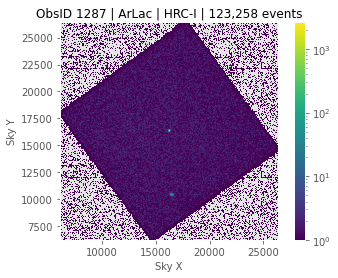

In [6]:
# This cell goes through and makes background reprojected and refiltered files to match
# each event 2 file without applying status bit corrections
# You don't need to run this cell if you already have the .csv files saved

obsid_list = [1287]#1505,144,9219,591]
# why doesn't 1505 have a matching bg exposure?? :()

# Option to do the event 2 filtering
filterit = False

for j in range(len(obsid_list)):
    
    print('obsid', obsid_list[j])
    csv_files = os.listdir("/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files")
    
    
    
    
    # Plot what the science image looks like:
    # In this case, grab the evt1 files :)
    n_points=1e3
    
    file_path_1 = "/Users/beckynevin/CfA_Code/HRC/"+str(obsid_list[j])+"/secondary/"
    list_files_1 = os.listdir(file_path_1)
    
    
    # Now grab the one that contains evt2
    name1 = 0
    for i in range(len(list_files_1)):
        
        if list_files_1[i][-12:] =='evt1.fits.gz':
            name1 = list_files_1[i]
        if list_files_1[i][-9:] =='evt1.fits':
            name1 = list_files_1[i]
    
    evt1 = HRCevt1(str(file_path_1)+str(name1))
    science = evt1.data[evt1.gtimask]
    
    evt1.image()
    
    if filterit ==True:
        # See if there are already saved .csv files:
        if 'bg_dataframe_filtered_'+str(obsid_list[j])+'.csv' in csv_files:
            continue
    else:
        if 'bg_dataframe_'+str(obsid_list[j])+'.csv' in csv_files:
            continue
    
    science.to_csv('csv_files/science_dataframe_'+str(obsid_list[j])+'.csv')
    
    continue
    
    
    # Now you'll actually be using the evt2 files to reproject the background
    # (because they have time information)
    # but you won't be using their status bits because you'll want to retain all info
    
    # First print everything that is in a directory, use the path to evt2 files (b/c you need the
    # aspect solution to reproject the background events)
    file_path = "/Users/beckynevin/CfA_Code/HRC/"+str(obsid_list[j])+"/primary/"
    list_files = os.listdir(file_path)
    # Now grab the one that contains evt2
    name = 0
    for i in range(len(list_files)):
        if list_files[i][-13:] =='asol1.fits.gz':
            asol = list_files[i]
        if list_files[i][-10:] =='asol1.fits':
            asol = list_files[i]
        if list_files[i][-12:] =='evt2.fits.gz':
            name = list_files[i]
        if list_files[i][-9:] =='evt2.fits':
            name = list_files[i]
    if name==0:
        STOPEROOSKI
    
        
    
    
    
    
    evt2 = fits.open(str(file_path)+str(name))
    
    # Now start copying the bkg file into event1 folder
    #os.system("hrc_bkgrnd_lookup "+str(file_path)+str(name)+" event")
    bkg_file = os.popen("hrc_bkgrnd_lookup "+str(file_path)+str(name)+" event").read()[:-1]
    
    
    # Save it in the event1 folder :)
    new_bg = os.path.join(file_path_1+str(obsid_list[j])+"_bg.fits")
    
    try:
        shutil.copy2(bkg_file,new_bg)
    except FileNotFoundError:# means there's no match
        continue
    
    
    
    #Redoing the header of the new background file using the event 2 file:
    os.system("dmmakepar "+str(file_path)+str(name)+" data_and_params/event_header.par clobber+")
    os.system("grep _pnt data_and_params/event_header.par > data_and_params/event_pnt.par")
    cat_out = os.popen("cat data_and_params/event_pnt.par").read()
    
    
    os.system("chmod +w "+new_bg)
    os.system('dmreadpar data_and_params/event_pnt.par "'+new_bg+'[events]" clobber+')
    dmlist_out = os.popen("dmlist "+new_bg+" header |grep PNT").read()
    
    
    bkg_all = fits.open(new_bg)
    
    
    
    plot_background(bkg_all, n_points, 'All')
    
    bkg_all.close()
    
    
    
    if filterit == True:
        # Next, figure out if a status bit filter was used on the event 2 file:
        dmhistory_out = os.popen("dmhistory "+file_path+name+" dmcopy").read()

        status = dmhistory_out[dmhistory_out.find('['):dmhistory_out.find(']')+1]

        statlist = list(status)
        statlist[36] = 'x'
        statlist[37] = 'x'
        statlist[38] = 'x'
        statlist[39] = 'x'

        status = ''.join(statlist)
        print('status applied', status)
        filt_bg = os.path.join(file_path+str(obsid_list[j])+"_filt_bg.fits")
        os.system('dmcopy "'+new_bg+status+'" '+filt_bg)

        # Check what we're looking at rn
    
    
    
        # Now it's time to reproject the background file
        os.system("punlearn reproject_events")
        os.system("pset reproject_events infile="+filt_bg)
        repro_bg = os.path.join(file_path_1+str(obsid_list[j])+"_repro_bg.fits")
        os.system("pset reproject_events outfile="+repro_bg)
        # Gotta find the asol file, which is the aspect solution

        os.system("pset reproject_events aspect="+str(file_path)+str(asol))
        os.system("pset reproject_events match="+str(file_path)+str(name))
        os.system("pset reproject_events random=0")

        os.popen("reproject_events verbose=0 clobber=yes")

        bkg_repro = fits.open(repro_bg)
        plot_background(bkg_repro, n_points, 'Reprojected in time')

        #turn both the bg into a dataframe
        print(type(bkg_repro[1].data), np.shape(bkg_repro[1].data))
        df_bg = pd.DataFrame(bkg_repro[1].data, columns = science.columns)

        df_bg.to_csv('csv_files/bg_dataframe_filtered_'+str(obsid_list[j])+'.csv')
    else:
        # Now it's time to reproject the background file
        os.system("punlearn reproject_events")
        os.system("pset reproject_events infile="+new_bg)
        repro_bg = os.path.join(file_path_1+str(obsid_list[j])+"_repro_bg.fits")
        os.system("pset reproject_events outfile="+repro_bg)
        # Gotta find the asol file, which is the aspect solution

        os.system("pset reproject_events aspect="+str(file_path)+str(asol))
        os.system("pset reproject_events match="+str(file_path)+str(name))
        os.system("pset reproject_events random=0")

        os.popen("reproject_events verbose=0 clobber=yes")

        bkg_repro = fits.open(repro_bg)
        plot_background(bkg_repro, n_points, 'Reprojected in time')

        #turn both the bg into a dataframe
        print(type(bkg_repro[1].data), np.shape(bkg_repro[1].data))
        df_bg = pd.DataFrame(bkg_repro[1].data, columns = science.columns)

        df_bg.to_csv('csv_files/bg_dataframe_'+str(obsid_list[j])+'.csv')
    
    bkg_repro.close()
    
    # Also remove it so you can tell if you need to rerun
    os.system('rm '+repro_bg)
    
    



In [ ]:
# Now load up the CSV files :) 
# and do a one class SVM with them and see what happens :)

obsid_list = [749]
#Status used to filter for event2 files:
#(0s mean you DO filter on this bit, last 2 are hyperbola)
#status=xxxxxx00xxxx0xxx00000000x0000000

for j in range(1):#len(obsid_list)):
    
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    if filterit == True:
        bg = pd.read_csv(file_dir+'bg_dataframe_filtered_'+str(obsid_list[j])+'.csv', index_col=0)
    else:
        bg = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    # First, get rid of the columns that have only NaNs:
    
   
    keep = bg.columns[~bg.isna().any()].tolist()
    bg = bg[keep]
    sci = sci[keep]
    
    plot_from_df(bg, 'BG')
    plot_from_df(sci, 'SCI')
    
    #print(sci.columns)
    
    if filterit == True:
        
        # Now, apply the various status bit filters to the event1 file 
        # (they have already been applied to the bkg file)
        # print('status bits',status)

        mask_bits = [6,7,12,16,17,18,19,20,21,22,23,25,26,27]

        # Okay determine the column where the first status bit is
        first_bit = float(np.where(sci.columns =='AV3 corrected for ringing')[0])

        # Now find the indices of all of the mask bits by adding the first index of a mask bit
        mask_is = [int(x + first_bit) for x in mask_bits]

        print(mask_is)
        mask_cols = sci.columns[mask_is]
        print('mask these cols', mask_cols)
    
    # now drop nans after first dropping the columns
    '''print('bg', bg)
    bg = bg.drop(mask_cols, axis=1)
    
    
    bg = bg.dropna()
    print('bg after drop', bg)
    STOP'''

    
    
    
    
    if filterit == True:
        # Go through each column you need to mask and mask science to be any row that is true in this
        # mask status
        for i in range(len(mask_cols)):
            starting_len = len(sci)
            sci = sci[sci[mask_cols[i]]==False]
            print('col', mask_cols[i], 'deleting this many rows', len(sci)-starting_len)
    
    
        print('~~~~~~~~~~~~~~masked ~~~~~~~~~~~~~~~~~~')
        print(len(sci))
        print(sci)

        x = sci['fp_u']#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
        y = sci['fb_u']#[0:n_points]#[np.array(binary_preds)==1]


        plt.clf()
        plt.scatter(x, y, s=0.1)
        plt.xlabel('fp_u')
        plt.ylabel('fb_u')
        plt.title('Science after status filtered')
        plt.show()
    
    
    a_u = bg["au1"]  # otherwise known as "a1"
    b_u = bg["au2"]  # "a2"
    c_u = bg["au3"]  # "a3"

    a_v = bg["av1"]
    b_v = bg["av2"]
    c_v = bg["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    bg['fp_u'] = fp_u
    bg['fb_u'] = fb_u
    bg['fp_v'] = fp_v
    bg['fb_v'] = fb_v
    
    a_u = sci["au1"]  # otherwise known as "a1"
    b_u = sci["au2"]  # "a2"
    c_u = sci["au3"]  # "a3"

    a_v = sci["av1"]
    b_v = sci["av2"]
    c_v = sci["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    sci['fp_u'] = fp_u
    sci['fb_u'] = fb_u
    sci['fp_v'] = fp_v
    sci['fb_v'] = fb_v
    
    
    
     
    
    # Now create class labels, label all of the sci events as 'unlabelled' or '1'
    # and all of the background events as 'positive' or '0'
    bg['class'] = 1
    sci['class'] = -1
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    n_points = int(1e3)
    
    frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]

    result = pd.concat(frames)
    #drop nans:
    result = result.dropna()
    
    
    
    # Now all the data is joined together!
    x = result['pha']#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
    y = result['sumamps']#[0:n_points]#[np.array(binary_preds)==1]

    
    plt.clf()
    plt.scatter(x, y, c=result['class'], s=0.5, cmap='viridis')
    plt.colorbar()
    plt.xlabel('pha')
    plt.ylabel('sumamps')
    
    plt.show()
    
    x = result['fp_u']#[0:n_points]#[np.array(binary_preds)==1]#model_lda.predict(xs)
    y = result['fb_u']#[0:n_points]#[np.array(binary_preds)==1]

    
    plt.clf()
    plt.scatter(x, y, c=result['class'], s=0.5, cmap='viridis')
    plt.colorbar()
    plt.xlabel('fp_u')
    plt.ylabel('fb_u')
    plt.show()
    
    
    from sklearn.svm import OneClassSVM
    from sklearn.model_selection import train_test_split
    
    train, test = train_test_split(result, test_size=.2) 
    train_normal = train[train['class']==1]
    train_outliers = train[train['class']==-1] 
    outlier_prop = len(train_outliers) / len(train_normal) 
    
    print('relative fraction of outliers', outlier_prop)
    
    svm = OneClassSVM(kernel='rbf',nu=outlier_prop)#, gamma=0.001) 
    
    feature_list = ['crsv', 'crsu', 'fp_u', 'fb_u', 'fp_v', 'fb_v',
       'x',
       'y', 'pha', 'sumamps']
    feature_list = ['fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
    #keep
    #['fp_u','fb_u','x','y','pha','sumamps']
    
    #print('train_normal aka background', train_normal[feature_list])
    #print('train_outliers aka x-rays', train_outliers[feature_list])
    classifier = svm.fit(train_normal[feature_list])
    
    # Now visualize what is happening:
    plt.clf()
    x = test['pha']
    y = test['sumamps']
    plt.scatter(x, y, alpha=0.7, c=test['class'], s=1, cmap='viridis')
    plt.xlabel('pha')
    plt.ylabel('sumamps')
    plt.title('Actual')
    plt.colorbar()
    plt.show()
    
    plt.clf()
    y_pred = svm.predict(test[feature_list])
    colors = np.array(['#441151', '#FF958C']) 
    plt.scatter(x, y, alpha=0.7, c=y_pred, s=1, cmap='viridis') 
    plt.colorbar()
    plt.xlabel('pha')
    plt.ylabel('sumamps')
    plt.title('Predicted')

    plt.show()
    
    # A different slice of it
    x = test['fp_u']
    y = test['fb_u']
    
    plt.clf()
    
    plt.scatter(x, y, alpha=0.7, c=test['class'], s=3, cmap='viridis')
    plt.xlabel('fp_u')
    plt.ylabel('fb_u')
    plt.title('Actual')
    plt.colorbar()
    plt.show()
    
    plt.clf()
    plt.scatter(x, y, alpha=0.7, c=y_pred, s=3, cmap='viridis') 
    plt.colorbar()
    plt.xlabel('fp_u')
    plt.ylabel('fb_u')
    plt.title('Predicted')

    plt.show()
    
    
    

19 176 218 1732


<Figure size 432x288 with 0 Axes>

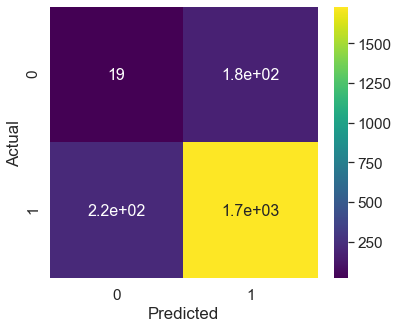

['crsv', 'crsu', 'fp_u', 'fb_u', 'fp_v', 'fb_v', 'x', 'y', 'pha', 'sumamps']
[   11    14    15 ... 98167 98187 98213]


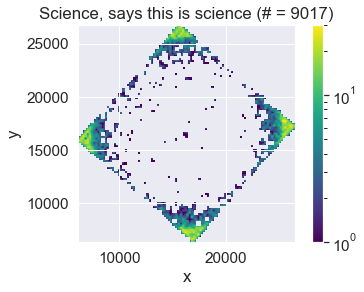

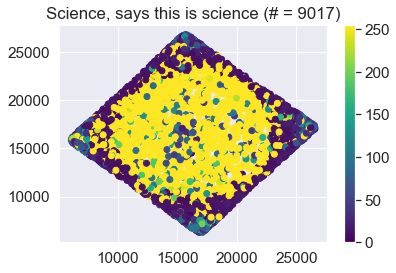

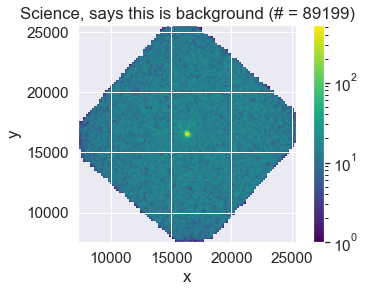

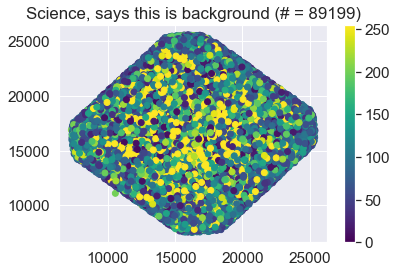

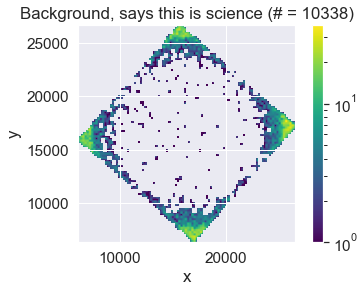

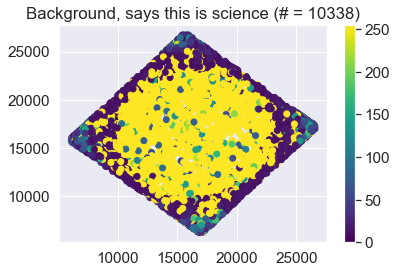

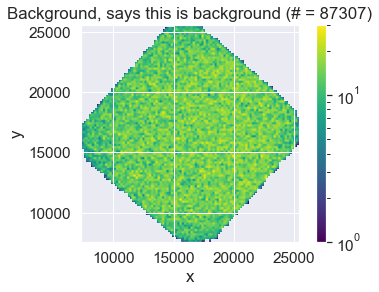

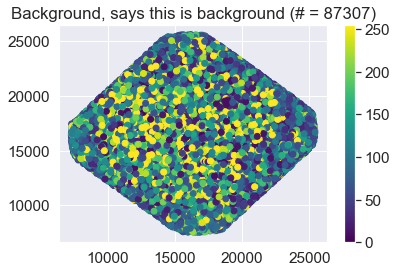

In [5]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


tn, fp, fn, tp = confusion_matrix(test['class'].values,y_pred).ravel()

print(tn, fp, fn, tp)

cm = confusion_matrix(test['class'].values,y_pred)#, labels=svm.classes_)


plt.clf()
fig = plt.figure(figsize=(6,5))
sns.set(font_scale=1.4) # for label size
sns.heatmap([[tn, fp],[fn, tp]], annot=True, annot_kws={"size": 16}, cmap='viridis') # font size
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()




# Now, figure out how to plot images of only the X-rays that are selected as real from the science data
# and everything else :)
n_points = int(1e5)

print(feature_list)


subsample_sci = sci.sample(n=n_points, random_state=1)
subsample_sci = subsample_sci.dropna()
pred_sci = svm.predict(subsample_sci[feature_list])

print(np.where(pred_sci==-1)[0])
plot_from_df(subsample_sci.iloc[np.where(pred_sci==-1)[0]], 'Science, says this is science (# = '+str(len(np.where(pred_sci==-1)[0]))+')')
plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')')

subsample_bg = bg.sample(n=n_points, random_state=1)
subsample_bg = subsample_bg.dropna()
pred_bg = svm.predict(subsample_bg[feature_list])

plot_from_df(subsample_bg.iloc[np.where(pred_bg==-1)[0]], 'Background, says this is science (# = '+str(len(np.where(pred_bg==-1)[0]))+')')
plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')')




###### 

In [37]:
## What about running the PU classifier:

obsid_list = [144,9219,591]

for j in range(len(obsid_list)):
    j = j+1
   
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    if filterit == True:
        bg = pd.read_csv(file_dir+'bg_dataframe_filtered_'+str(obsid_list[j])+'.csv', index_col=0)
    else:
        bg = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    # First, get rid of the columns that have only NaNs:
    
   
    keep = bg.columns[~bg.isna().any()].tolist()
    bg = bg[keep]
    sci = sci[keep]
    
    #plot_from_df(bg, 'BG')
    #plot_from_df(sci, 'SCI')
    
    a_u = bg["au1"]  # otherwise known as "a1"
    b_u = bg["au2"]  # "a2"
    c_u = bg["au3"]  # "a3"

    a_v = bg["av1"]
    b_v = bg["av2"]
    c_v = bg["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    bg['fp_u'] = fp_u
    bg['fb_u'] = fb_u
    bg['fp_v'] = fp_v
    bg['fb_v'] = fb_v
    
    a_u = sci["au1"]  # otherwise known as "a1"
    b_u = sci["au2"]  # "a2"
    c_u = sci["au3"]  # "a3"

    a_v = sci["av1"]
    b_v = sci["av2"]
    c_v = sci["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    sci['fp_u'] = fp_u
    sci['fb_u'] = fb_u
    sci['fp_v'] = fp_v
    sci['fb_v'] = fb_v
    
    
    
     
    
    # Now create class labels, label all of the sci events as 'unlabelled' or '0'
    # and all of the background events as 'positive' or '1'
    bg['class'] = 1
    sci['class'] = 0
    
    
    
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    n_points = int(1e5)
    try:
        frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
    except ValueError:
        # This means n_points is bigger than the dataframe
        n_points = int(1e4)
        try:
            frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
        except:
            n_points = int(1e3)
            try:
                frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
            except:
                continue
    result = pd.concat(frames)
    #drop nans:
    result = result.dropna()
    
    feature_list = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
    
    
    X = result[feature_list]
    y = result['class'].values
    
    from pulearn import BaggingPuClassifier
    from sklearn.tree import DecisionTreeClassifier
    print('sum of y', sum(y < 1))
    print('len science', len(science))
    print('len bg', len(bg))
    bc = BaggingPuClassifier(
        DecisionTreeClassifier(), 
        n_estimators = 10,  # 1000 trees as usual
        max_samples = int(sum(y < 1)),#sum(y), # Balance the positives and unlabeled in each bag
        n_jobs = -1           # Use all cores
    )
    bc.fit(X, y)
    
    # Store the scores assigned by this approach
    results_bag = pd.DataFrame({
        'label'      : y},        # The labels to be shown to models in experiment
        columns = ['label'])
    results_bag['output_bag'] = bc.oob_decision_function_[:,1]
    print(results_bag['output_bag'])
    
    
    # plot the results
    plt.scatter(
        X[y==0].fp_u, X[y==0].fb_u, 
        c = results_bag[y==0].output_bag, linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma'
    )
    plt.colorbar(label='Scores given to unlabeled points')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()

    result_science = results_bag[y==0].output_bag

    th = 0.5

    print(len(result_science[result_science > th]))
    print(len(result_science))
    indices_bg = np.where(result_science > th)
    indices_zero = np.where(result_science < th) # more similar to science

    xs = X[y==0].fp_u.values
    ys = X[y==0].fb_u.values
    cs = results_bag[y==0].output_bag.values

    print(xs)
    # Now reorganize the plot
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # now look at sumamps-pha plane
    xs = X[y==0].pha.values
    ys = X[y==0].sumamps.values
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # Now, figure out how to plot images of only the X-rays that are selected as real from the science data
    # and everything else :)
    n_points = int(1e5)

    print(feature_list)


    subsample_sci = sci.sample(n=n_points, random_state=1)
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])

    print(pred_sci)


    print(np.where(pred_sci==-1)[0])
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')')
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')')

    subsample_bg = bg.sample(n=n_points, random_state=1)
    subsample_bg = subsample_bg.dropna()
    pred_bg = bc.predict(subsample_bg[feature_list])

    plot_from_df(subsample_bg.iloc[np.where(pred_bg==0)[0]], 'Background, says this is science (# = '+str(len(np.where(pred_bg==0)[0]))+')')
    plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')')
    
    
    STOP



KeyboardInterrupt: 

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


X          crsu  crsv          x          y      fp_u      fb_u      fp_v  \
1115271    52     2  16905.055  25496.234 -0.293294  0.633450 -0.259909   
2316312    52    52   8216.248  16209.293  0.158835  0.714097 -0.345238   
1525438    46    27  13792.781  19843.668 -0.434131  0.516894 -0.303562   
343743     50    29  12311.870  20349.984  0.361454  0.583676 -0.253585   
2791262    56     8  14828.530  25004.889 -0.232456  0.638889 -0.233743   
...       ...   ...        ...        ...       ...       ...       ...   
50980      33    16  13435.458  14337.036  0.343223  0.586969  0.008857   
67140      49     3  11161.025   9387.035 -0.229779  0.669618 -0.124317   
59726      33    49  21458.470  16737.344  0.147478  0.693492 -0.021525   
2554       14    57  22087.768  22189.422  0.133420  0.414767  0.438541   
54795      25    20  13849.563  16496.865  0.384870  0.552980 -0.026757   

             fb_v  pha  sumamps  
1115271  0.681767   94     7245  
2316312  0.607143   19     28

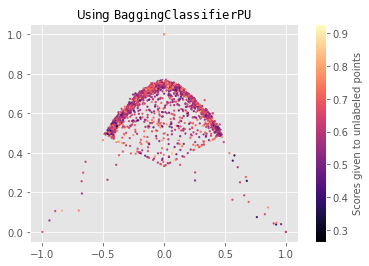

2509
2949
[0.11910286 0.03364943 0.12198872 ... 0.14747786 0.13341969 0.3848701 ]


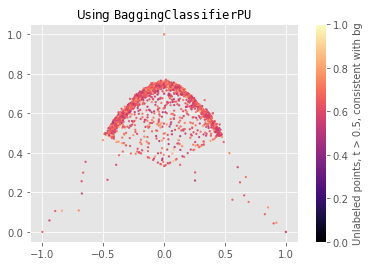

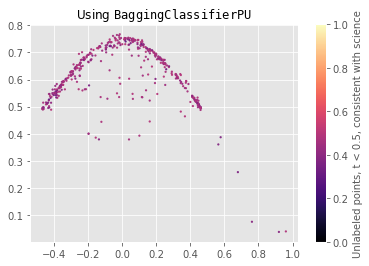

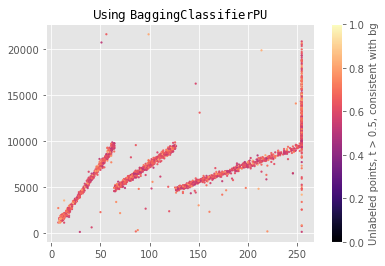

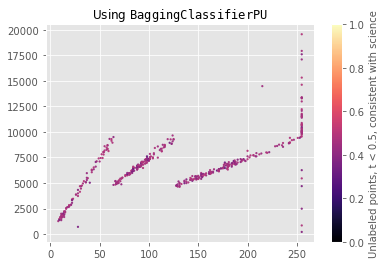

['crsu', 'crsv', 'x', 'y', 'fp_u', 'fb_u', 'fp_v', 'fb_v', 'pha', 'sumamps']


ValueError: Cannot take a larger sample than population when 'replace=False'

In [76]:
## What about comboing all of the observations together

obsid_list = [144,9219,591]
X_list = []
y_list = []

for j in range(len(obsid_list)):
    
   
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    if filterit == True:
        bg = pd.read_csv(file_dir+'bg_dataframe_filtered_'+str(obsid_list[j])+'.csv', index_col=0)
    else:
        bg = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    # First, get rid of the columns that have only NaNs:
    
   
    keep = bg.columns[~bg.isna().any()].tolist()
    bg = bg[keep]
    sci = sci[keep]
    
    #plot_from_df(bg, 'BG')
    #plot_from_df(sci, 'SCI')
    
    a_u = bg["au1"]  # otherwise known as "a1"
    b_u = bg["au2"]  # "a2"
    c_u = bg["au3"]  # "a3"

    a_v = bg["av1"]
    b_v = bg["av2"]
    c_v = bg["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    bg['fp_u'] = fp_u
    bg['fb_u'] = fb_u
    bg['fp_v'] = fp_v
    bg['fb_v'] = fb_v
    
    a_u = sci["au1"]  # otherwise known as "a1"
    b_u = sci["au2"]  # "a2"
    c_u = sci["au3"]  # "a3"

    a_v = sci["av1"]
    b_v = sci["av2"]
    c_v = sci["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    sci['fp_u'] = fp_u
    sci['fb_u'] = fb_u
    sci['fp_v'] = fp_v
    sci['fb_v'] = fb_v
    
    
    
     
    
    # Now create class labels, label all of the sci events as 'unlabelled' or '0'
    # and all of the background events as 'positive' or '1'
    bg['class'] = 1
    sci['class'] = 0
    
    
    
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    
    # what if I randomly try to unbalance
    n_points = int(1e3)
    n_points_sci = int(1e3)
    try:
        frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points_sci, random_state=1)]
    except ValueError:
        STOP
        # This means n_points is bigger than the dataframe
        n_points = int(1e4)
        try:
            frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
        except:
            n_points = int(1e3)
            try:
                frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
            except:
                continue
    result_here = pd.concat(frames)
    #drop nans:
    result_here = result_here.dropna()
    
    
    if j ==0:
        #then this is the first time through the loop:
        
        result = result_here
        
    else:
        result = result.append(result_here)
        
        
# Took these out: 'crsu','crsv','x','y','
feature_list = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
X = result[feature_list]
y = result['class'].values

  
    
print('X', X)
print('y', y)
from pulearn import BaggingPuClassifier
from sklearn.tree import DecisionTreeClassifier
print('sum of y', sum(y < 1))
print('length unlabelled', len(X[y==0]))
print('length labelled, background', len(X[y==1]))


bc = BaggingPuClassifier(
    DecisionTreeClassifier(), 
    n_estimators = 1000,  # 1000 trees as usual
    max_samples = int(sum(y < 1)),#sum(y), # Balance the positives and unlabeled in each bag
    n_jobs = -1           # Use all cores
)
bc.fit(X, y)

# Store the scores assigned by this approach
results_bag = pd.DataFrame({
    'label'      : y},        # The labels to be shown to models in experiment
    columns = ['label'])
results_bag['output_bag'] = bc.oob_decision_function_[:,1]
print(results_bag['output_bag'])


# plot the results
plt.scatter(
    X[y==0].fp_u, X[y==0].fb_u, 
    c = results_bag[y==0].output_bag, linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma'
)
plt.colorbar(label='Scores given to unlabeled points')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

result_science = results_bag[y==0].output_bag

th = 0.5

print(len(result_science[result_science > th]))
print(len(result_science))
indices_bg = np.where(result_science > th)
indices_zero = np.where(result_science < th) # more similar to science

xs = X[y==0].fp_u.values
ys = X[y==0].fb_u.values
cs = results_bag[y==0].output_bag.values

print(xs)
# Now reorganize the plot
plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_bg], ys[indices_bg], 
    c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()


# now look at sumamps-pha plane
xs = X[y==0].pha.values
ys = X[y==0].sumamps.values
plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_bg], ys[indices_bg], 
    c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()


# Now, figure out how to plot images of only the X-rays that are selected as real from the science data
# and everything else :)
n_points = int(1e5)

print(feature_list)


subsample_sci = sci.sample(n=n_points, random_state=1)
subsample_sci = subsample_sci.dropna()
pred_sci = bc.predict(subsample_sci[feature_list])

print(pred_sci)


print(np.where(pred_sci==-1)[0])
plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')')
plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')')

subsample_bg = bg.sample(n=n_points, random_state=1)
subsample_bg = subsample_bg.dropna()
pred_bg = bc.predict(subsample_bg[feature_list])

plot_from_df(subsample_bg.iloc[np.where(pred_bg==0)[0]], 'Background, says this is science (# = '+str(len(np.where(pred_bg==0)[0]))+')')
plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')')

  



In [100]:
def plot_bagging_results(X, y, results_bag, xaxis, yaxis, idx_zero, idx_one, thresh):
    # plot the results
    plt.clf()
    fig = plt.figure(figsize=(12,5))
    ax0 = fig.add_subplot(121)
    
    xmin = np.min([np.min(X[xaxis].values[idx_zero]),np.min(X[xaxis].values[idx_one])])
    xmax = np.max([np.max(X[xaxis].values[idx_zero]),np.max(X[xaxis].values[idx_one])])
    
    ymin = np.min([np.min(X[yaxis].values[idx_zero]),np.min(X[yaxis].values[idx_one])])
    ymax = np.max([np.max(X[yaxis].values[idx_zero]),np.max(X[yaxis].values[idx_one])])
    
    im0 = ax0.scatter(
        X[xaxis].values[idx_zero], X[yaxis].values[idx_zero], 
        c = results_bag[idx_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmin=0, vmax=1
    )
    plt.colorbar(im0)
    ax0.set_title('Labelled as Science (# = '+str(len(idx_zero))+')')
    ax0.set_xlim([xmin, xmax])
    ax0.set_ylim([ymin, ymax])
    ax0.set_xlabel(xaxis)
    ax0.set_ylabel(yaxis)
    
    ax1 = fig.add_subplot(122)
    im1 = ax1.scatter(X[xaxis].values[idx_one], X[yaxis].values[idx_one], 
        c = results_bag[idx_one], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmin=0, vmax=1)
    plt.colorbar(im1)
    ax1.set_title('Labelled as Background (# = '+str(len(idx_one))+')')
    ax1.set_xlim([xmin, xmax])
    ax1.set_ylim([ymin, ymax])
    ax1.set_xlabel(xaxis)
    ax1.set_ylabel(yaxis)
    
    plt.tight_layout()
    plt.show()
    
def scipy_plot(X, y, results_bag, xaxis, yaxis, idx_zero, idx_one, thresh):
    # Makes density of the probabilities as a function of various spaces
    
    xmin = np.min([np.min(X[xaxis].values[idx_zero]),np.min(X[xaxis].values[idx_one])])
    xmax = np.max([np.max(X[xaxis].values[idx_zero]),np.max(X[xaxis].values[idx_one])])
    
    ymin = np.min([np.min(X[yaxis].values[idx_zero]),np.min(X[yaxis].values[idx_one])])
    ymax = np.max([np.max(X[yaxis].values[idx_zero]),np.max(X[yaxis].values[idx_one])])
    
    xs_sci = X[xaxis].values[idx_zero]
    ys_sci = X[yaxis].values[idx_zero]
    
    xs_bg = X[xaxis].values[idx_one]
    ys_bg = X[yaxis].values[idx_one]
    
    
    plt.clf()
    sns.set_style('dark')
    fig=plt.figure(figsize=(12,5))
    #plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.5, wspace=0.1)


    ax1=fig.add_subplot(121)
    ax1.set_title('Labelled as science (# = '+str(len(idx_zero))+')', loc='right')
    
     
    heatmap, xedges, yedges, binnumber = scipy.stats.binned_statistic_2d(ys_sci, 
                                                                         xs_sci, results_bag[idx_zero],
                                                                         statistic='mean', bins=50)
      
    heatmapnon, xedgesnon, yedgesnon, binnumber = scipy.stats.binned_statistic_2d(ys_bg, 
                                                                                  xs_bg, 
                                                                                  results_bag[idx_one],
                                                                                  statistic='mean', bins=50)
     
    
    if thresh == 0:
        im1 = ax1.imshow(np.flipud(heatmap), cmap='magma', vmin=0, vmax=1,
                     extent=[ ymin, ymax,xmin, xmax], interpolation='None')
    else:
        im1 = ax1.imshow(np.flipud(heatmap), cmap='magma', vmin=0, vmax=thresh,
                     extent=[ ymin, ymax,xmin, xmax], interpolation='None')
      
    ax1.set_ylim(xmin, xmax)
    ax1.set_xlim(ymin, ymax)
    ax1.set_aspect((ymax-ymin)/(xmax-xmin))

   
     
    plt.colorbar(im1, fraction=0.046, label=r'$p$')
    ax1.set_xlabel(xaxis)
    ax1.set_ylabel(yaxis)
    #ax1.set_aspect((ymax-ymin)/(xmax-xmin))

    ax2=fig.add_subplot(122)
    ax2.set_title('Labelled as background (# = '+str(len(idx_one))+')', loc='right')
    if thresh==0:
        im2 = ax2.imshow(np.flipud(heatmapnon), cmap='magma', vmin=0, vmax=1,extent=[ymin, ymax, xmin, xmax])
    else:
        im2 = ax2.imshow(np.flipud(heatmapnon), cmap='viridis', vmin=thresh, vmax=1,extent=[ymin, ymax, xmin, xmax])
    ax2.set_ylim(xmin, xmax)
    ax2.set_xlim(ymin, ymax)
    plt.colorbar(im2, fraction=0.046, label=r'$p$')
    ax2.set_xlabel(xaxis)
    ax2.set_ylabel(yaxis)
    ax2.set_aspect((ymax-ymin)/(xmax-xmin))

    plt.tight_layout()
    plt.show()
    #plt.savefig('../LDA_figures/gini_m20_separate_'+str(run)+'.pdf',  bbox_inches = 'tight')

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


99248 99248
[0.67  0.532 0.597 ... 0.613 0.573 0.391]
[    5     8    10 ... 99232 99236 99247]
[    0     1     2 ... 99244 99245 99246]


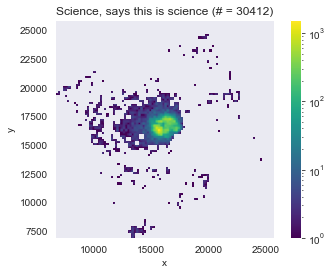

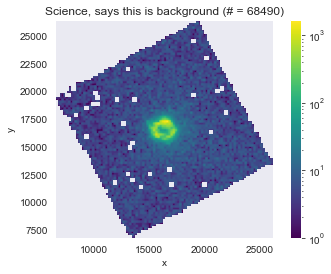

<Figure size 432x288 with 0 Axes>

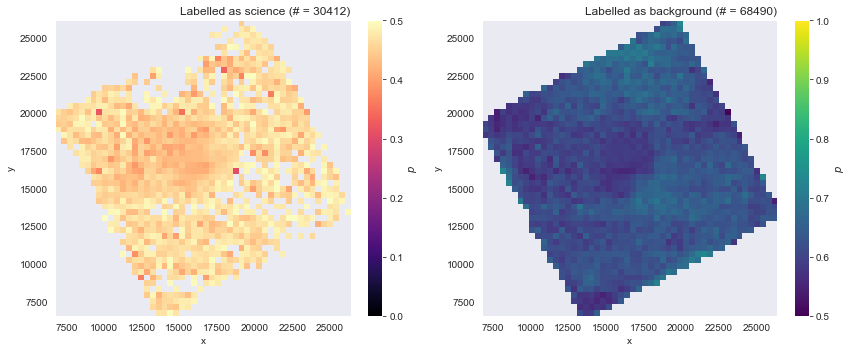

<Figure size 432x288 with 0 Axes>

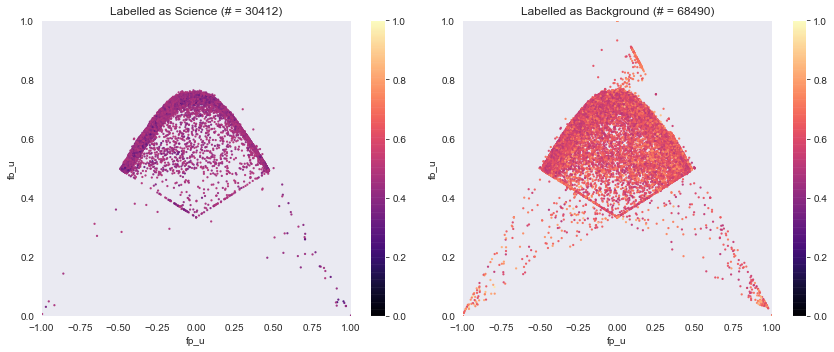

<Figure size 432x288 with 0 Axes>

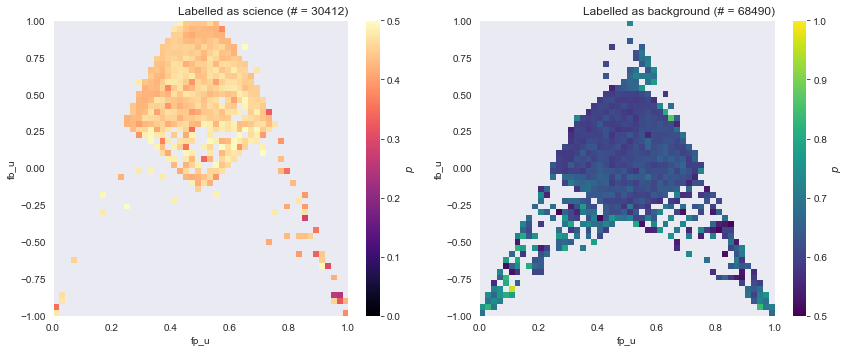

<Figure size 432x288 with 0 Axes>

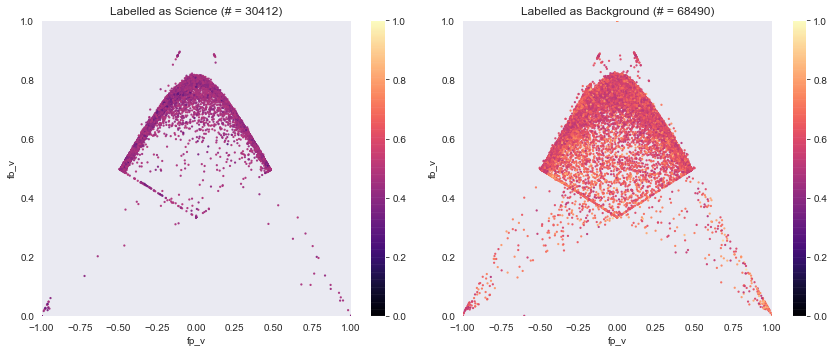

<Figure size 432x288 with 0 Axes>

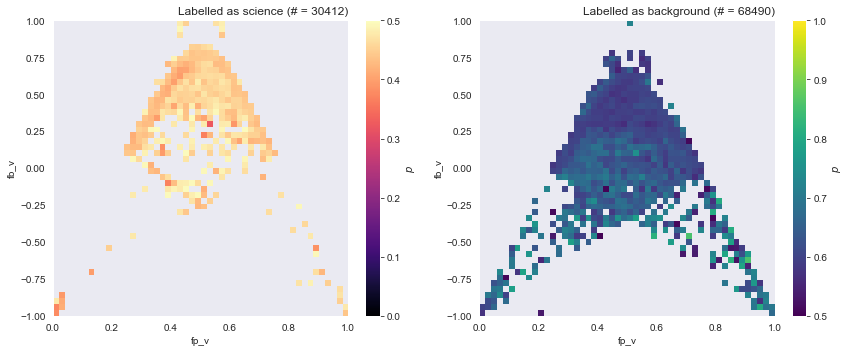

<Figure size 432x288 with 0 Axes>

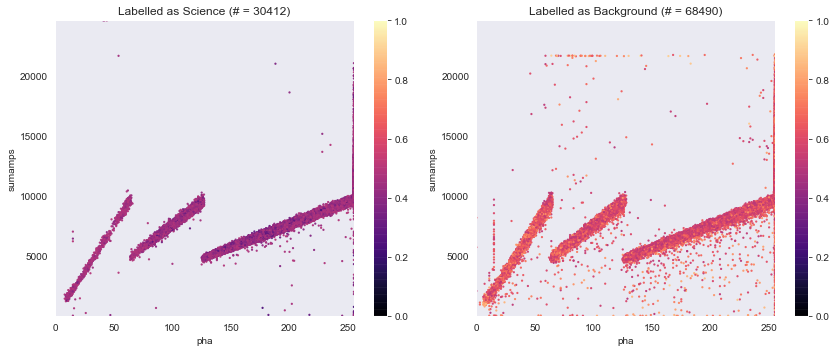

<Figure size 432x288 with 0 Axes>

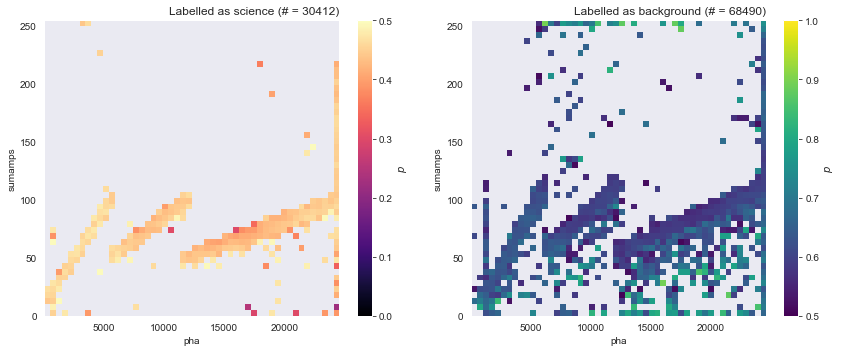

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


98216 98216
[0.187 0.164 0.269 ... 0.522 0.63  0.589]
[    0     1     2 ... 98178 98179 98197]
[  983   984   985 ... 98213 98214 98215]


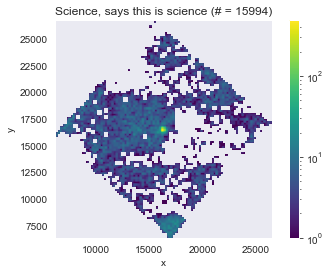

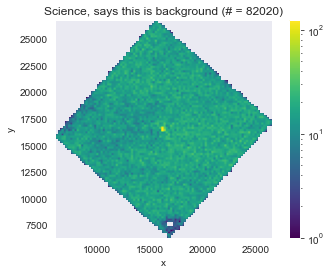

<Figure size 432x288 with 0 Axes>

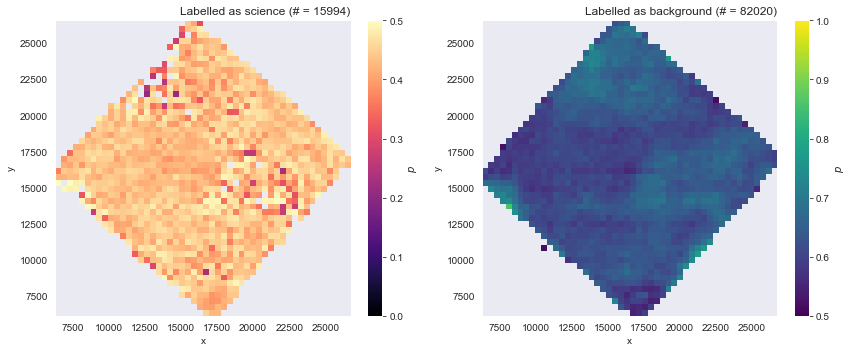

<Figure size 432x288 with 0 Axes>

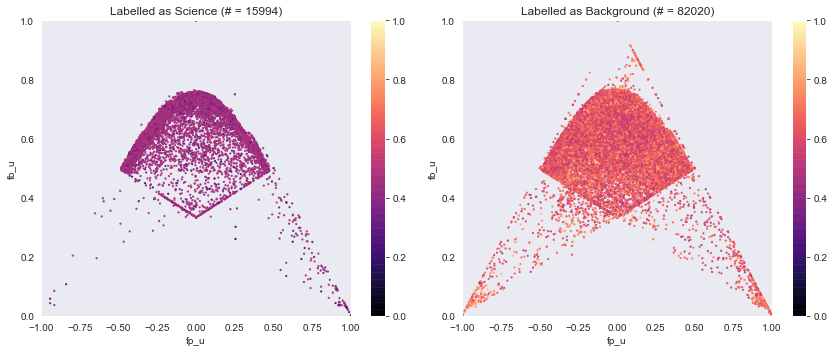

<Figure size 432x288 with 0 Axes>

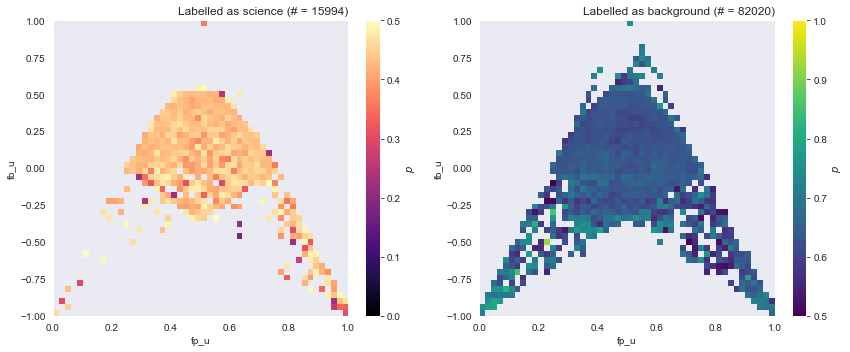

<Figure size 432x288 with 0 Axes>

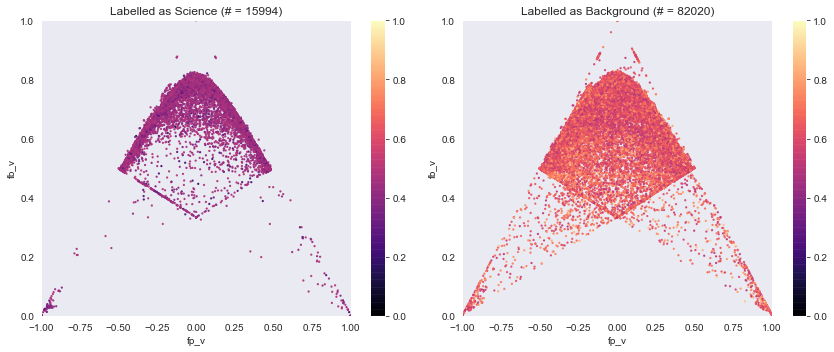

<Figure size 432x288 with 0 Axes>

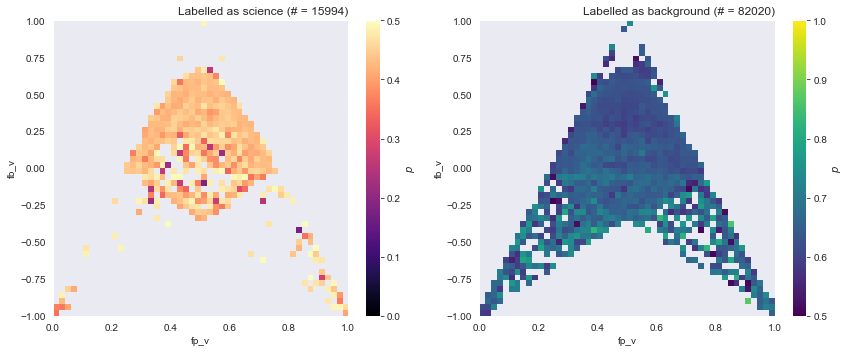

<Figure size 432x288 with 0 Axes>

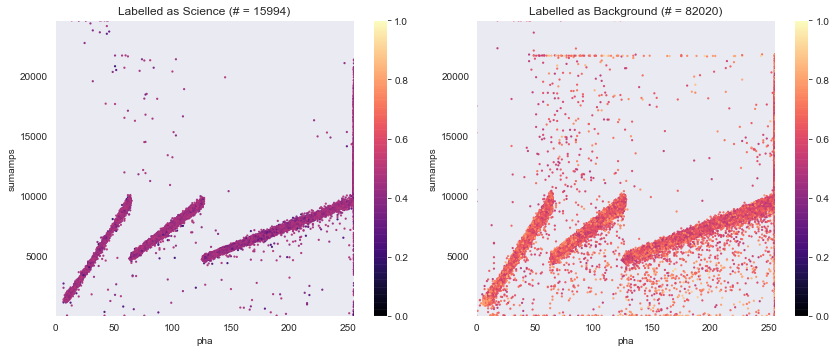

<Figure size 432x288 with 0 Axes>

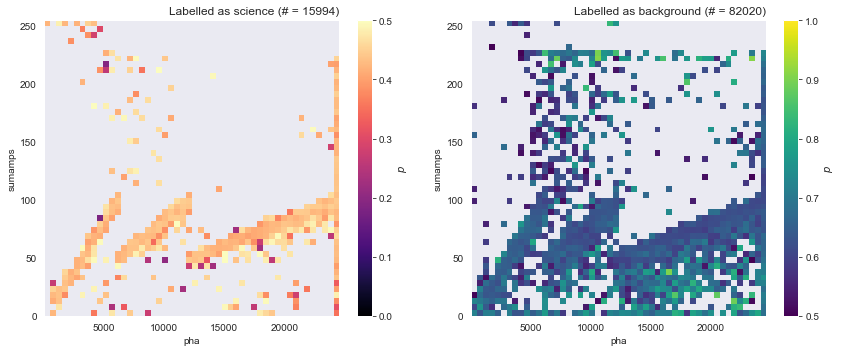

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


98079 98079
[0.174 0.245 0.242 ... 0.602 0.6   0.667]
[    0     1     2 ... 98061 98065 98073]
[  982   983   984 ... 98076 98077 98078]


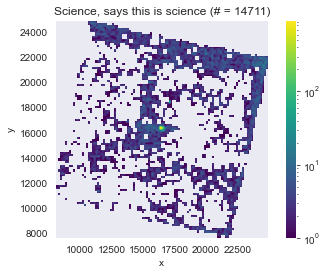

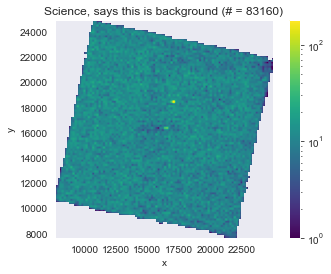

<Figure size 432x288 with 0 Axes>

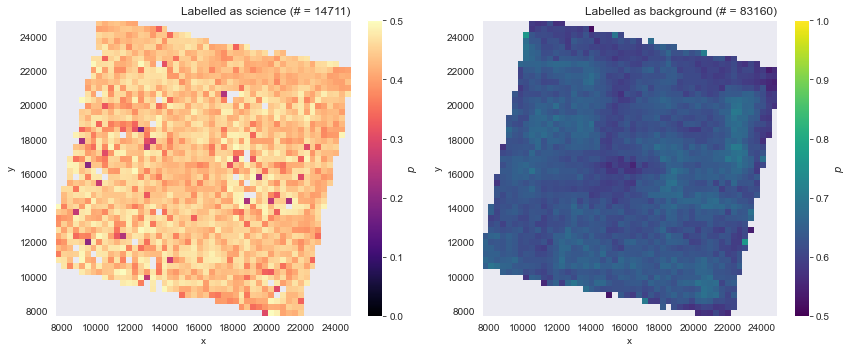

<Figure size 432x288 with 0 Axes>

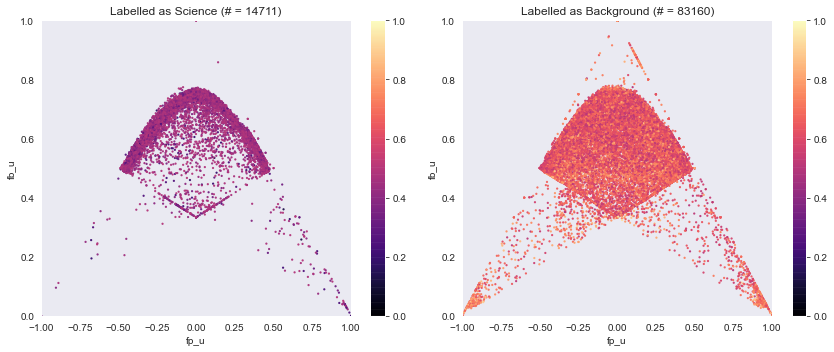

<Figure size 432x288 with 0 Axes>

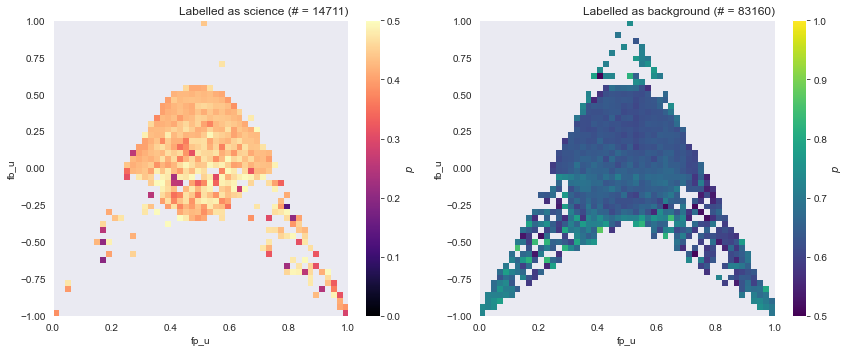

<Figure size 432x288 with 0 Axes>

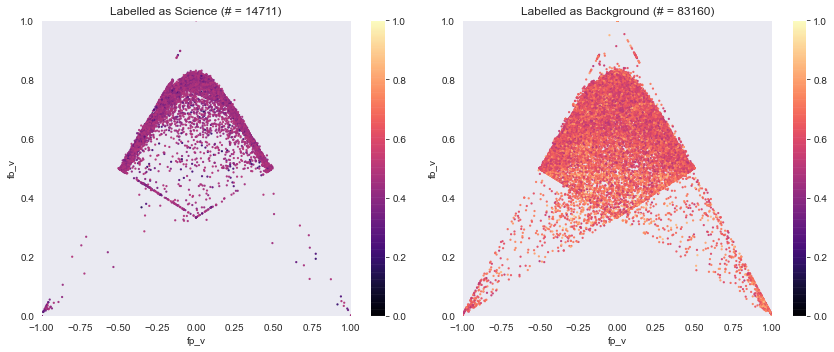

<Figure size 432x288 with 0 Axes>

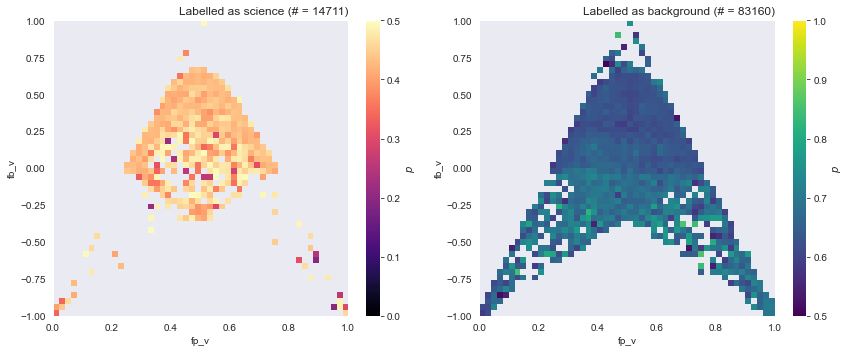

<Figure size 432x288 with 0 Axes>

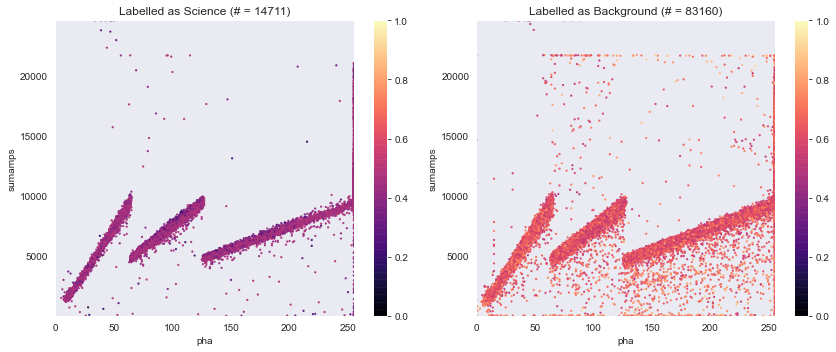

<Figure size 432x288 with 0 Axes>

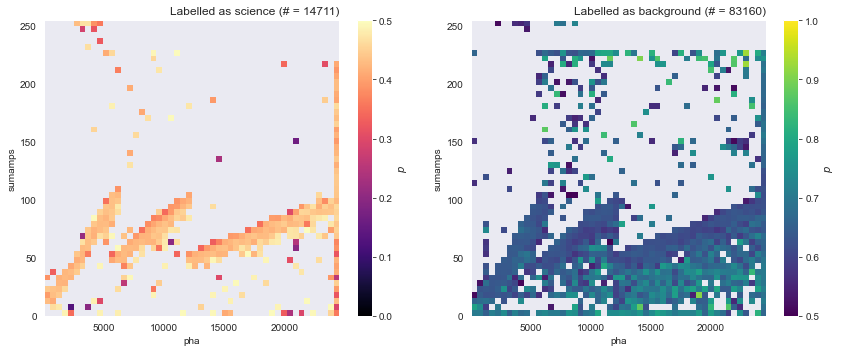

ValueError: Cannot take a larger sample than population when 'replace=False'

In [91]:
# Okay but now that I've prepared a classification is it possibly to apply to 1505,
# which doesn't have a background?
import scipy


    
    
    
obsid_list = [1505,144,9219,591]
for j in range(len(obsid_list)):

    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)

    n_points = int(1e5)
    
    subsample_sci = sci.sample(n=n_points, random_state=1)
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])
    prob = bc.predict_proba(subsample_sci[feature_list])[:,1]
    
    
    
    X = subsample_sci[feature_list]
    
    y = pred_sci
    
    # Can adjust this
    # If you want less backgrounds, make this a higher
    th = 0.5

    indices_bg = np.where(prob > th)[0]
    indices_zero = np.where(prob < th)[0] 
    
    
    print(len(prob), len(y))
    
   
    print(prob)
    print(indices_zero)
    print(indices_bg)
    

    plot_from_df(subsample_sci.iloc[indices_zero], 'Science, says this is science (# = '+str(len(indices_zero))+')', 'x', 'y')
    plot_from_df(subsample_sci.iloc[indices_bg], 'Science, says this is background (# = '+str(len(indices_bg))+')', 'x', 'y')
    
    #plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')', 'crsu', 'crsv')
    #plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')', 'crsu', 'crsv')
    scipy_plot(X, y, prob, 'x', 'y', indices_zero, indices_bg, th)
    
    plot_bagging_results(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    
    
    plot_bagging_results(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    
    plot_bagging_results(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    
    
    
    
    
    
    
   
    
    


/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


indices inside [   485   1312   2460 ... 991685 992277 992285] 1057
indices outside [     0      1      2 ... 992666 992667 992668] 991611


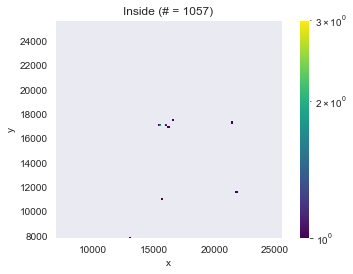

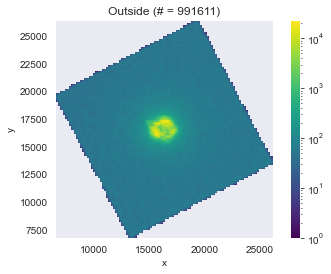

<Figure size 432x288 with 0 Axes>

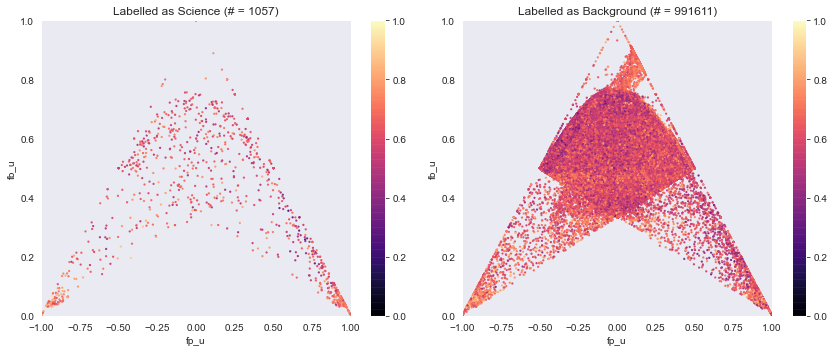

<Figure size 432x288 with 0 Axes>

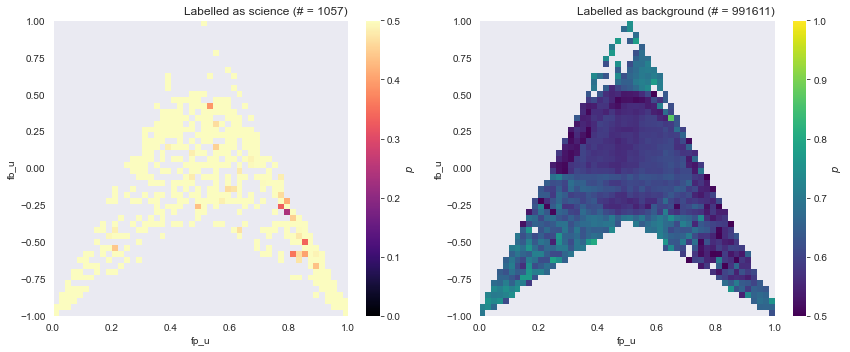

<Figure size 432x288 with 0 Axes>

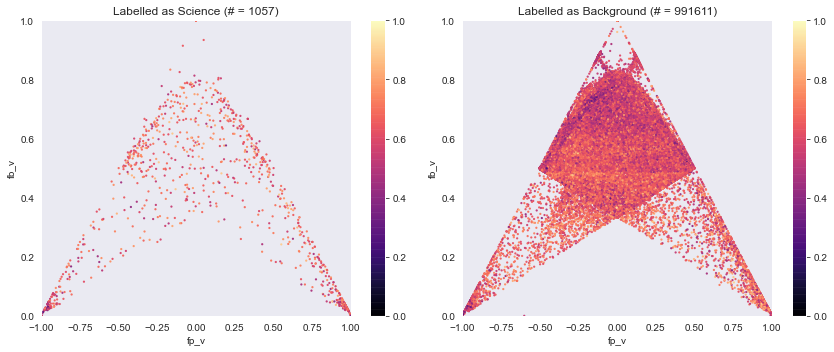

<Figure size 432x288 with 0 Axes>

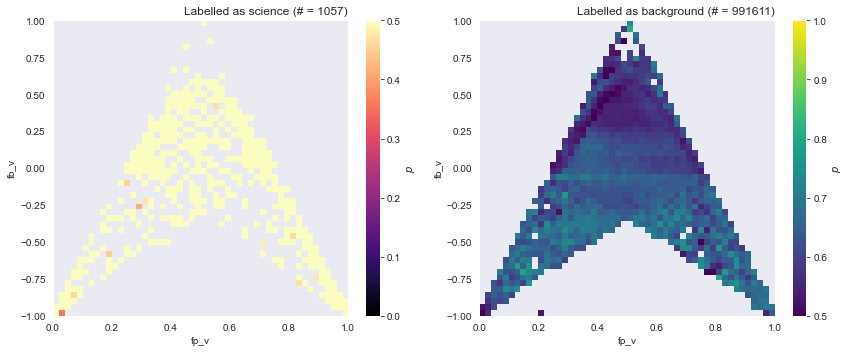

<Figure size 432x288 with 0 Axes>

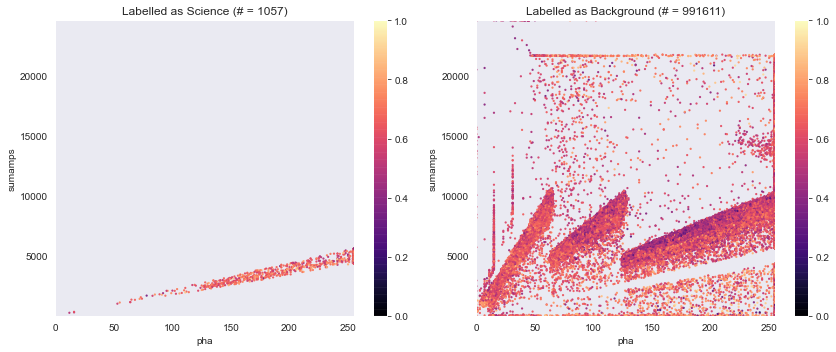

<Figure size 432x288 with 0 Axes>

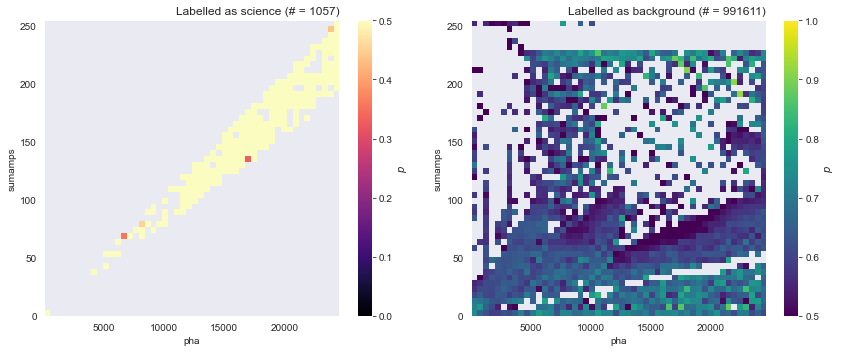

middle 16300.211707102868 16584.852993335648
indices inside [     0      1      2 ... 992666 992667 992668] 672559
indices outside [     6      7      9 ... 992662 992663 992664] 320110


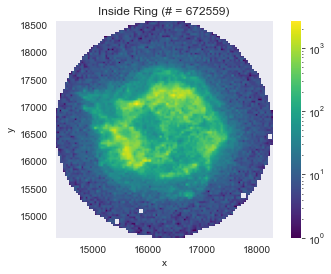

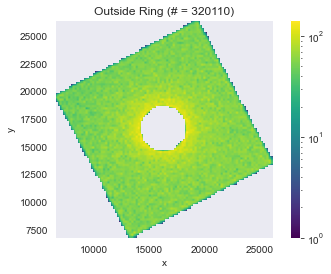

<Figure size 432x288 with 0 Axes>

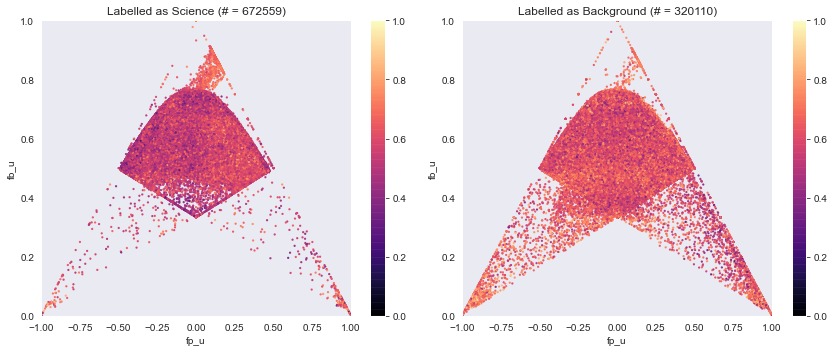

<Figure size 432x288 with 0 Axes>

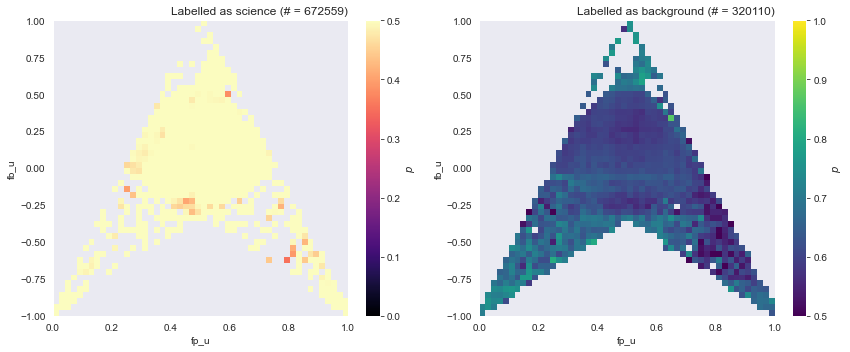

<Figure size 432x288 with 0 Axes>

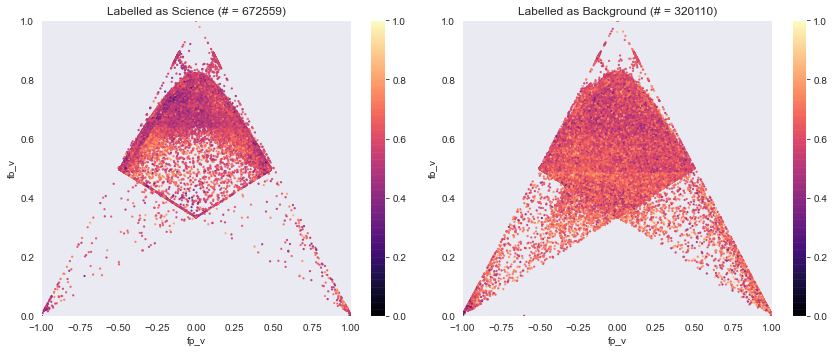

<Figure size 432x288 with 0 Axes>

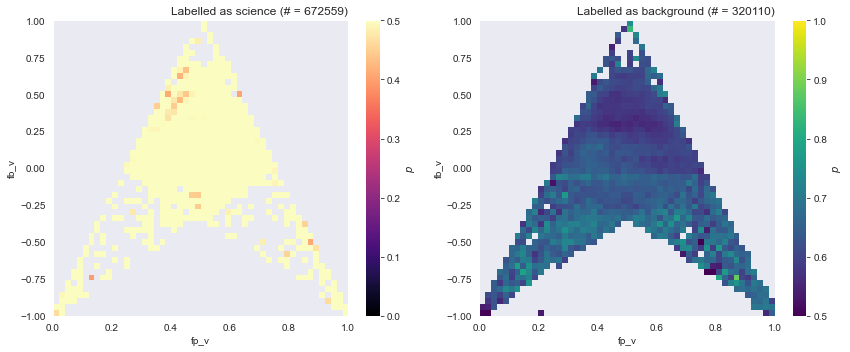

<Figure size 432x288 with 0 Axes>

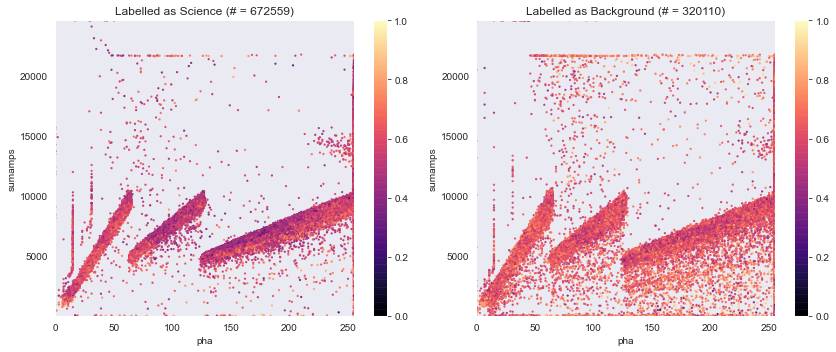

<Figure size 432x288 with 0 Axes>

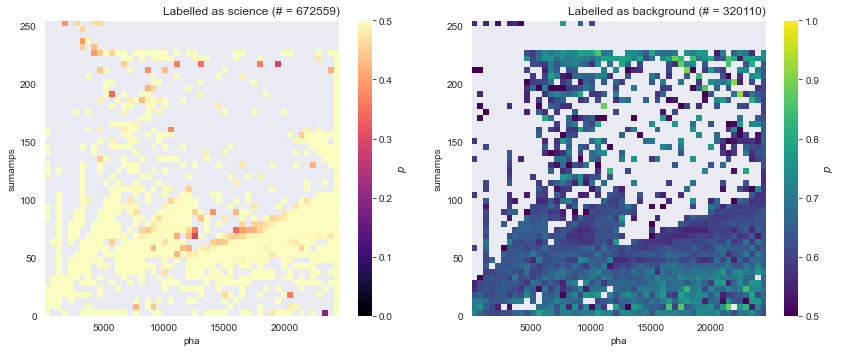

middle 0.0016367688188271793 0.6357516290290453
indices inside [    38    173    262 ... 991835 991866 992241] 1694
indices outside [     0      1      2 ... 992666 992667 992668] 990404


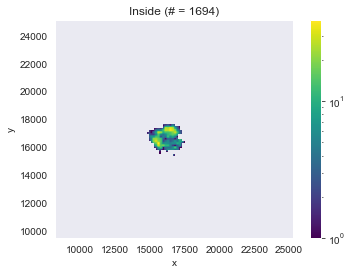

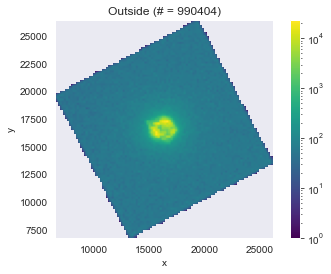

<Figure size 432x288 with 0 Axes>

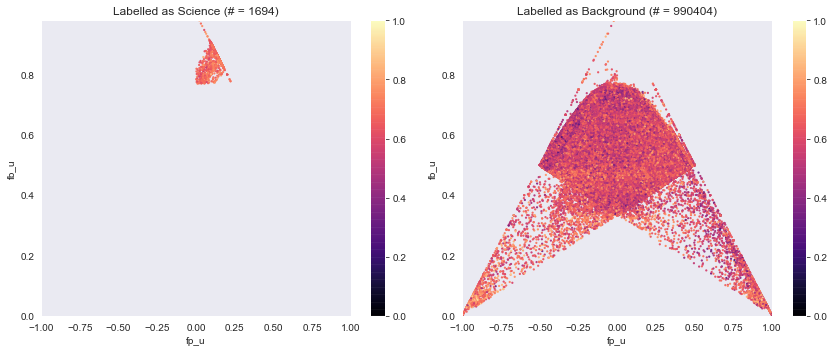

<Figure size 432x288 with 0 Axes>

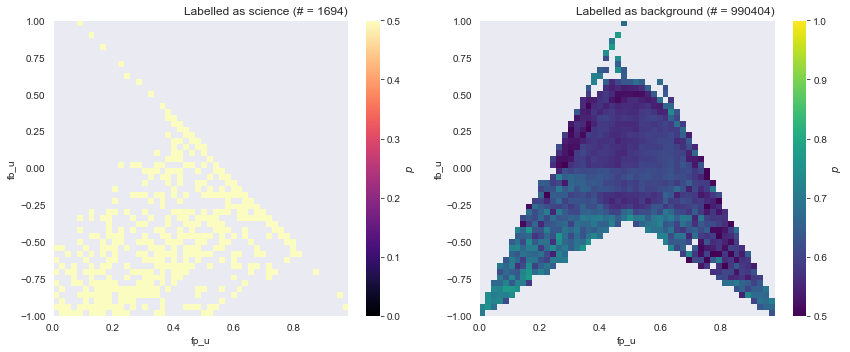

<Figure size 432x288 with 0 Axes>

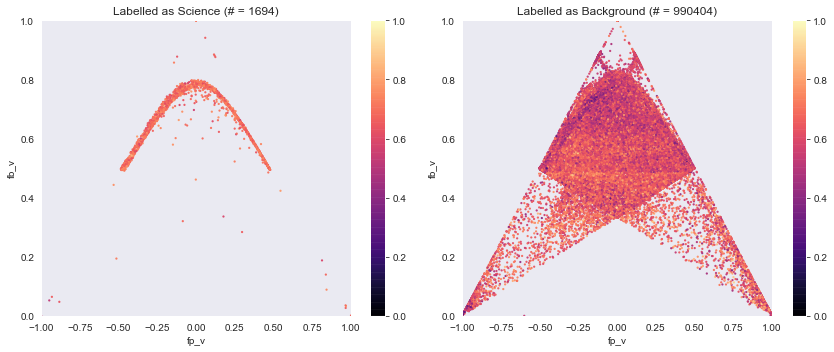

<Figure size 432x288 with 0 Axes>

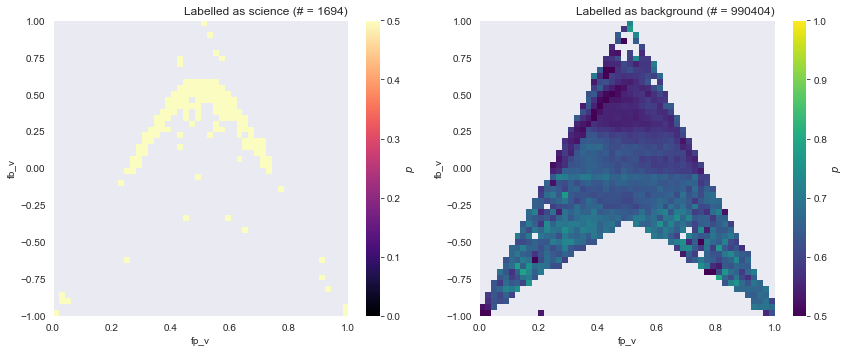

<Figure size 432x288 with 0 Axes>

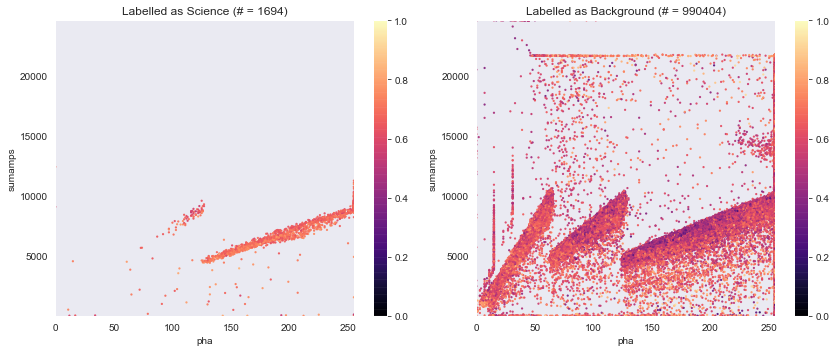

<Figure size 432x288 with 0 Axes>

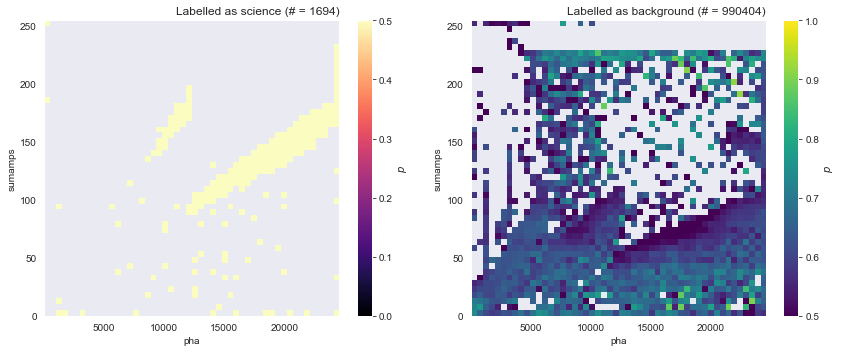

NameError: name 'STOP' is not defined

In [113]:
# What if you could instead label points as science and add them to the labelled sample?
# Write a script to select an area

def self_label_center_circle(X, y, rad):
    # First locate where x and y position are within a ring
    xs = X['x'].values
    ys = X['y'].values
    
    print('middle', np.mean(xs), np.mean(ys))
    
    indices_inside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 < rad**2 )[0]
    indices_outside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 > rad**2 )[0]
    print('indices inside', indices_inside, len(indices_inside))
    print('indices outside', indices_outside, len(indices_outside))
    
    
    plot_from_df(X.iloc[indices_inside], 'Inside Ring (# = '+str(len(indices_inside))+')', 'x', 'y')
    plot_from_df(X.iloc[indices_outside], 'Outside Ring (# = '+str(len(indices_outside))+')', 'x', 'y')
    
    
    
    return indices_inside, indices_outside

def self_label_hyperbola(X, y, prob, indices_bg, indices_zero):
    # First locate where x and y position are within a ring
    xs = X['fp_u'].values
    ys = X['fb_u'].values
    
    print('middle', np.mean(xs), np.mean(ys))
    
    indices_inside = np.where((ys > 0.77) & (xs > 0) )[0]
    indices_outside = np.where((ys < 0.77) | (xs < 0) )[0]
    print('indices inside', indices_inside, len(indices_inside))
    print('indices outside', indices_outside, len(indices_outside))
    
    
    plot_from_df(X.iloc[indices_inside], 'Inside (# = '+str(len(indices_inside))+')', 'x', 'y')
    plot_from_df(X.iloc[indices_outside], 'Outside (# = '+str(len(indices_outside))+')', 'x', 'y')
    
    
    
    return indices_inside, indices_outside

def self_label_sumamps(X, y, prob, indices_bg, indices_zero):
    # First locate where x and y position are within a ring
    xs = X['pha'].values
    ys = X['sumamps'].values
    
    
    indices_inside = np.where((ys < 22*xs ) & (ys > 17*xs ))[0]
    indices_outside = np.where((ys > 22*xs ) | (ys < 17*xs))[0]
    print('indices inside', indices_inside, len(indices_inside))
    print('indices outside', indices_outside, len(indices_outside))
    
    
    plot_from_df(X.iloc[indices_inside], 'Inside (# = '+str(len(indices_inside))+')', 'x', 'y')
    plot_from_df(X.iloc[indices_outside], 'Outside (# = '+str(len(indices_outside))+')', 'x', 'y')
    
    
    
    return indices_inside, indices_outside
    
obsid_list = [1505,144,9219,591]
for j in range(len(obsid_list)):

    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)

    n_points = int(1e6)
    
    subsample_sci = sci.sample(n=n_points, random_state=1)
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])
    prob = bc.predict_proba(subsample_sci[feature_list])[:,1]
    
    
    
    X = subsample_sci[feature_list]
    
    y = pred_sci
    
    # Can adjust this
    # If you want less backgrounds, make this a higher
    th = 0.5
    
    #set this if you want it to plot the full range:
    th = 0.5

    indices_bg = np.where(prob > th)[0]
    indices_zero = np.where(prob < th)[0] 
    
    # ~~~~~~~~~~~~ Now cut the pha-sumamps diagram ~~~~~~~~~~~~~~~~~~~~#
    
    indices_zero, indices_bg = self_label_sumamps(X, y, prob, indices_bg, indices_zero)
    
    plot_bagging_results(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    
    
    plot_bagging_results(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    
    plot_bagging_results(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    
    # ~~~~~~~~~~~~ Now cut out the center of the image ~~~~~~~~~~~~~~~~~~~~#
    
    indices_zero, indices_bg = self_label_center_circle(X, y, prob, indices_bg, indices_zero, th, 2000)
    plot_bagging_results(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    
    
    plot_bagging_results(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    
    plot_bagging_results(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    
    
    # ~~~~~~~~~~~~ Now cut into the hyperbola ~~~~~~~~~~~~~~~~~~~~#
    indices_zero, indices_bg = self_label_hyperbola(X, y, prob, indices_bg, indices_zero)
    
    plot_bagging_results(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_u', 'fb_u', indices_zero, indices_bg, th)
    
    
    plot_bagging_results(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'fp_v', 'fb_v', indices_zero, indices_bg, th)
    
    plot_bagging_results(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    scipy_plot(X, y, prob, 'pha', 'sumamps', indices_zero, indices_bg, th)
    
    
    
    STOP

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


middle 16303.036425979806 16582.71548124186
indices inside [      0      19      25 ... 6900497 6900498 6900500] 4677035
indices outside [      1       2       3 ... 6900499 6900501 6900502] 2223468


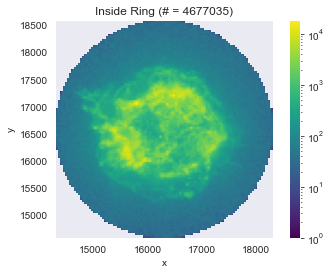

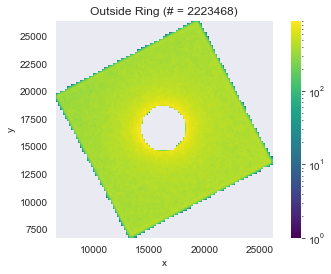

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


middle 16454.511909418317 16540.59509157571
indices inside [    161     191     197 ... 1236132 1236180 1236264] 23738
indices outside [      0       1       2 ... 1236801 1236802 1236803] 1213066


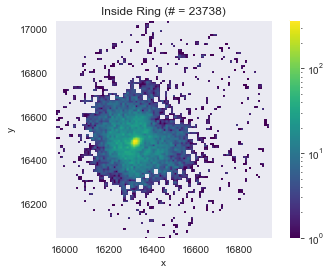

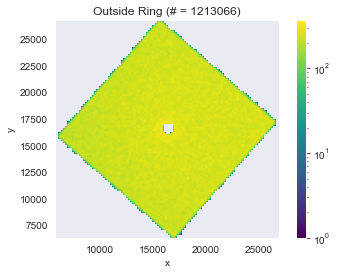

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


middle 16240.24130948709 16458.75565805157
indices inside [     98     192     213 ... 4363912 4363947 4363985] 120944
indices outside [      0       1       2 ... 4364077 4364078 4364079] 4243136


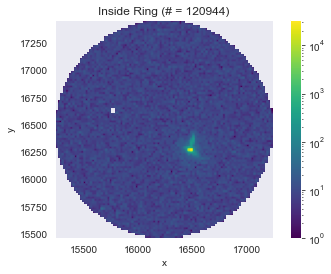

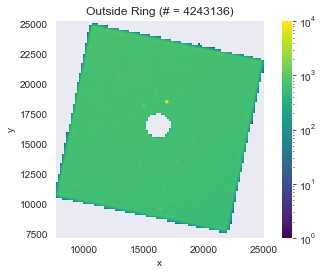

middle 16223.712099745782 16332.593488116725
indices inside [  124   449   455   536   694   869  1148  1445  1718  2045  2667  2899
  3312  3467  3522  3709  3829  3991  4308  4487  4491  4592  5147  5405
  6125  6237  6533  6808  6999  7241  7266  7471  7633  7917  8491  9057
  9508  9809  9868 10028 10197 10374 10994 11017 11043 11170 11445 11447
 11488 11511 11860 12016 12404 12510 12921 13035 13809 13846 13868 14235
 14333 14729 15119 15198 15396 16018 16505 16729 16824 17502 17780 17819
 17871 17886 18045 18463 18579 18951 19010 19403 19426 19489 19934 19982
 20021 20041 20079 20143 20200 20439 20774 20854 20867 21005 21269 21337
 21380 21561 21851 22526 22596 23546 23586 23846 24256 24607 24921 25445
 26051 26073 26214 26237 26408 26525 26888 27680 27743 28234 28237 28365
 28405 28628 28687 28824 29301 29470 29498 29519 29531 29660 29873 29892
 30161 30638 31117 31119 31340 31361 32744 33007 33013 33374 33435 33524
 33725 34054 34449 34451 34612 34628 35238 35917 35968 36051 361

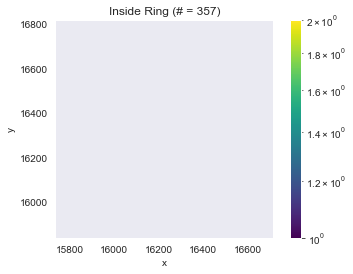

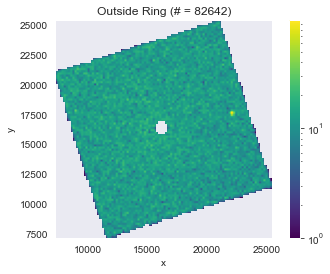

In [122]:
# ~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~~
# Use this cell to compare the stowed background
# to the non-stowed one

obsid_list = [1505,144,9219,591]
rad = [2000,500,2000,500]
for j in range(len(obsid_list)):
    j = j+2

    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)

    '''n_points = int(1e5)
    
    try:
        subsample_sci = sci.sample(n=n_points, random_state=1)
    except ValueError:
        subsample_sci = sci'''
    subsample_sci = sci
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])
    prob = bc.predict_proba(subsample_sci[feature_list])[:,1]
    
    
    
    X = subsample_sci[feature_list]
    
    y = pred_sci
    
    #rad = [2000,500,2000,500]
    indices_zero, indices_bg = self_label_center_circle(X, y, prob, indices_bg, indices_zero, th, rad[j])
    
    # Now save everything as its own csv file:
    science = pd.DataFrame(X.iloc[indices_zero], columns = sci.columns)
    
    science.to_csv('csv_files/science_dataframe_cutout_'+str(obsid_list[j])+'.csv')
    
    df_bg = pd.DataFrame(X.iloc[indices_bg], columns = sci.columns)

    df_bg.to_csv('csv_files/bg_dataframe_cutout_'+str(obsid_list[j])+'.csv')

len bg 2223468 len sci 4677035
sum of y 100000
len science 357
len bg 2223468
0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
199995    0.0
199996    0.0
199997    0.0
199998    0.0
199999    0.0
Name: output_bag, Length: 200000, dtype: float64


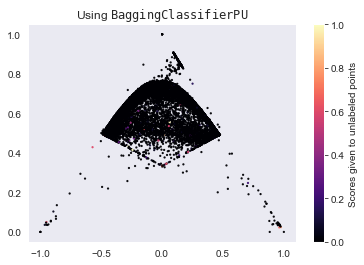

170
100000
[-0.37691746  0.30398614  0.21781625 ... -0.25584594  0.17957836
  0.10457107]


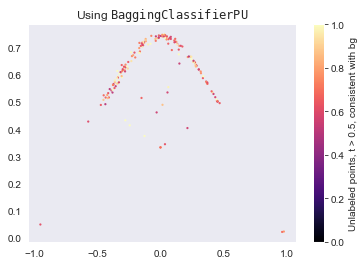

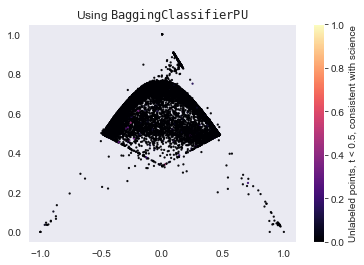

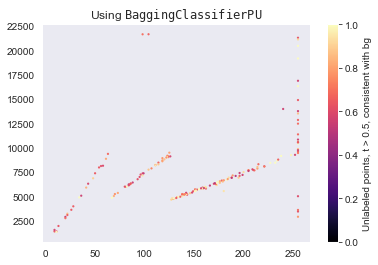

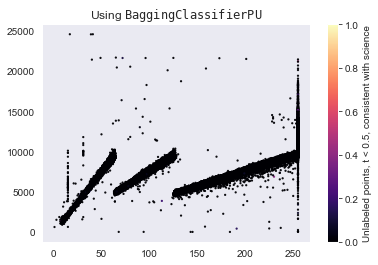

['crsu', 'crsv', 'x', 'y', 'fp_u', 'fb_u', 'fp_v', 'fb_v', 'pha', 'sumamps']
[0 0 0 ... 0 0 0]
[]


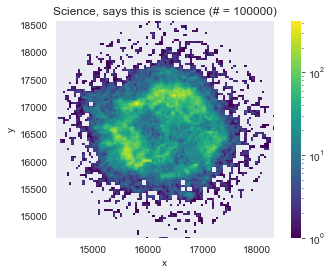

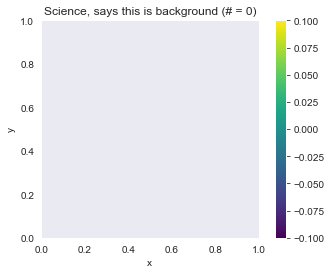

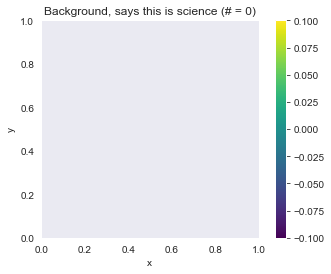

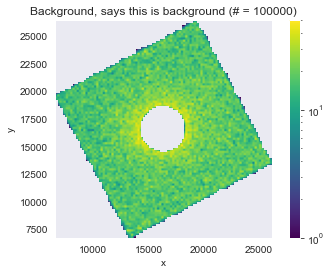

NameError: name 'STOP' is not defined

In [125]:
obsid_list = [1505,144,9219,591]

for j in range(len(obsid_list)):
    
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    sci = pd.read_csv(file_dir+'science_dataframe_cutout_'+str(obsid_list[j])+'.csv', index_col=0)
    bg = pd.read_csv(file_dir+'bg_dataframe_cutout_'+str(obsid_list[j])+'.csv', index_col=0)
    # First, get rid of the columns that have only NaNs:
    
   
    keep = bg.columns[~bg.isna().any()].tolist()
    bg = bg[keep]
    sci = sci[keep]
    
    print('len bg', len(bg),'len sci', len(sci))
    
    
    
     
    
    # Now create class labels, label all of the sci events as 'unlabelled' or '0'
    # and all of the background events as 'positive' or '1'
    bg['class'] = 1
    sci['class'] = 0
    
    
    
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    n_points = int(1e5)
    try:
        frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
    except ValueError:
        # This means n_points is bigger than the dataframe
        n_points = int(1e4)
        try:
            frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
        except:
            n_points = int(1e3)
            try:
                frames = [bg.sample(n=n_points, random_state=1), sci.sample(n=n_points, random_state=1)]
            except:
                continue
    result = pd.concat(frames)
    #drop nans:
    result = result.dropna()
    
    feature_list = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
    
    
    X = result[feature_list]
    y = result['class'].values
    
    from pulearn import BaggingPuClassifier
    from sklearn.tree import DecisionTreeClassifier
    
    
    

    
    bc = BaggingPuClassifier(
        DecisionTreeClassifier(), 
        n_estimators = 1000,  # 1000 trees as usual
        max_samples = int(sum(y < 1)),#sum(y), # Balance the positives and unlabeled in each bag
        n_jobs = -1           # Use all cores
    )
    bc.fit(X, y)
    
    # Store the scores assigned by this approach
    results_bag = pd.DataFrame({
        'label'      : y},        # The labels to be shown to models in experiment
        columns = ['label'])
    results_bag['output_bag'] = bc.oob_decision_function_[:,1]
    print(results_bag['output_bag'])
    
    
    # plot the results
    plt.scatter(
        X[y==0].fp_u, X[y==0].fb_u, 
        c = results_bag[y==0].output_bag, linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma'
    )
    plt.colorbar(label='Scores given to unlabeled points')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()

    result_science = results_bag[y==0].output_bag

    th = 0.5

    print(len(result_science[result_science > th]))
    print(len(result_science))
    indices_bg = np.where(result_science > th)
    indices_zero = np.where(result_science < th) # more similar to science

    xs = X[y==0].fp_u.values
    ys = X[y==0].fb_u.values
    cs = results_bag[y==0].output_bag.values

    print(xs)
    # Now reorganize the plot
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # now look at sumamps-pha plane
    xs = X[y==0].pha.values
    ys = X[y==0].sumamps.values
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # Now, figure out how to plot images of only the X-rays that are selected as real from the science data
    # and everything else :)
    n_points = int(1e5)

    print(feature_list)


    subsample_sci = sci.sample(n=n_points, random_state=1)
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])

    print(pred_sci)


    print(np.where(pred_sci==-1)[0])
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 
                 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')', 'x', 'y')
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 
                 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')', 'x', 'y')

    subsample_bg = bg.sample(n=n_points, random_state=1)
    subsample_bg = subsample_bg.dropna()
    pred_bg = bc.predict(subsample_bg[feature_list])

    plot_from_df(subsample_bg.iloc[np.where(pred_bg==0)[0]], 
                 'Background, says this is science (# = '+str(len(np.where(pred_bg==0)[0]))+')', 'x', 'y',)
    plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 
                 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')', 'x', 'y')
    STOP
    

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2901957
length of cutout after dropped nans 2223468
length going in 2901957
middle 16520.128668711448 16496.5183735888
indices inside [      2       3       6 ... 2901945 2901951 2901953] 702734
indices outside [      0       1       4 ... 2901954 2901955 2901956] 2199223
length going in 2223468
middle 16485.44143163449 16483.88352493833
indices inside [      0       2       5 ... 2223451 2223457 2223467] 554450
indices outside [      1       3       4 ... 2223464 2223465 2223466] 1669018
length after cutting out center 2199223


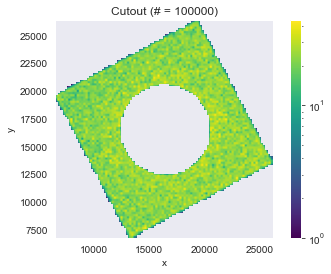

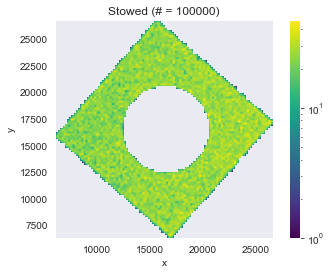

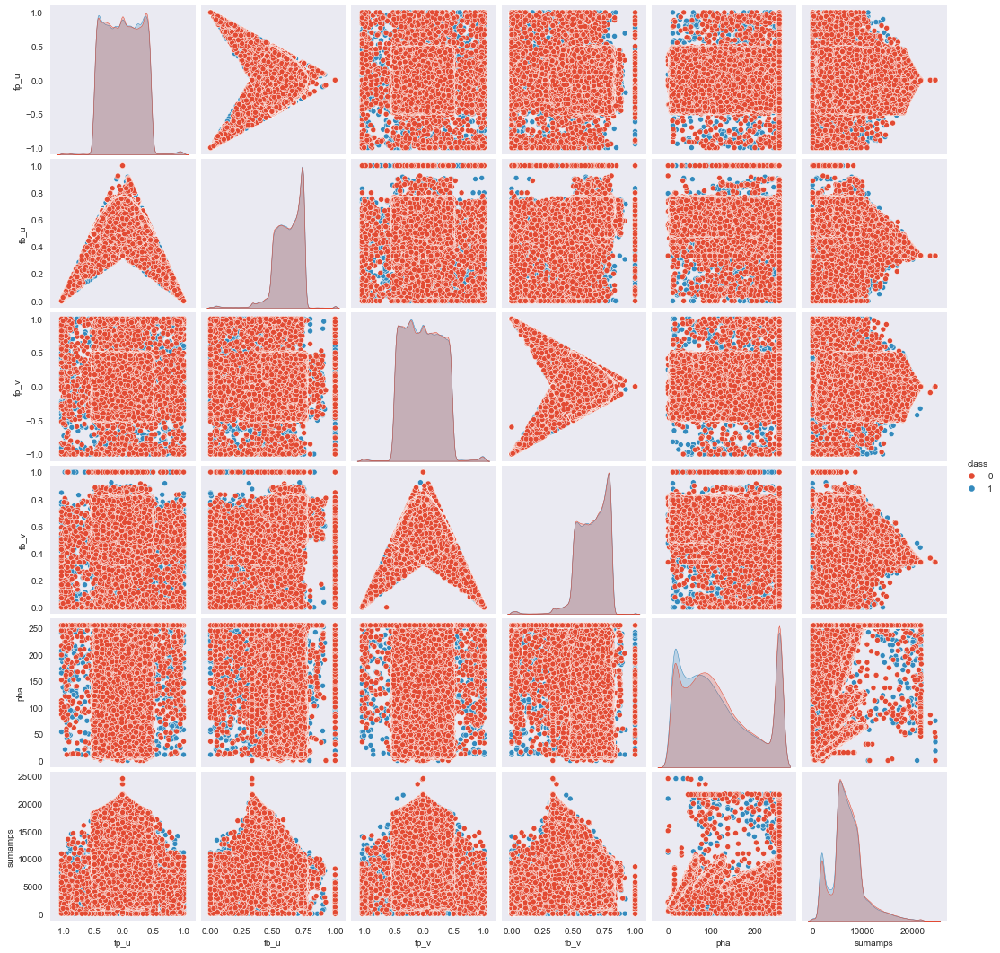

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2901957
length of cutout after dropped nans 1213066
length going in 2901957
middle 16520.128668711448 16496.5183735888
indices inside [    108     134     175 ... 2901759 2901782 2901798] 11227
indices outside [      0       1       2 ... 2901954 2901955 2901956] 2890730
length going in 1213066
middle 16456.395275349572 16541.331954798166
indices inside [ 140811  324470  329802  373223  502872  514176  765640  842566  901331
  945549  963134  978293 1048910 1212661] 14
indices outside [      0       1       2 ... 1213063 1213064 1213065] 1213052
length after cutting out center 2890730


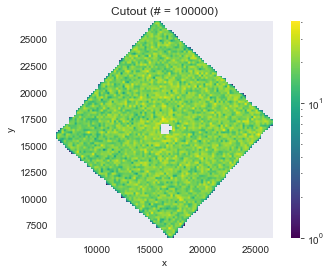

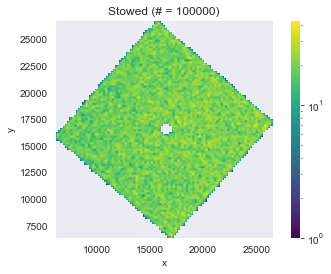

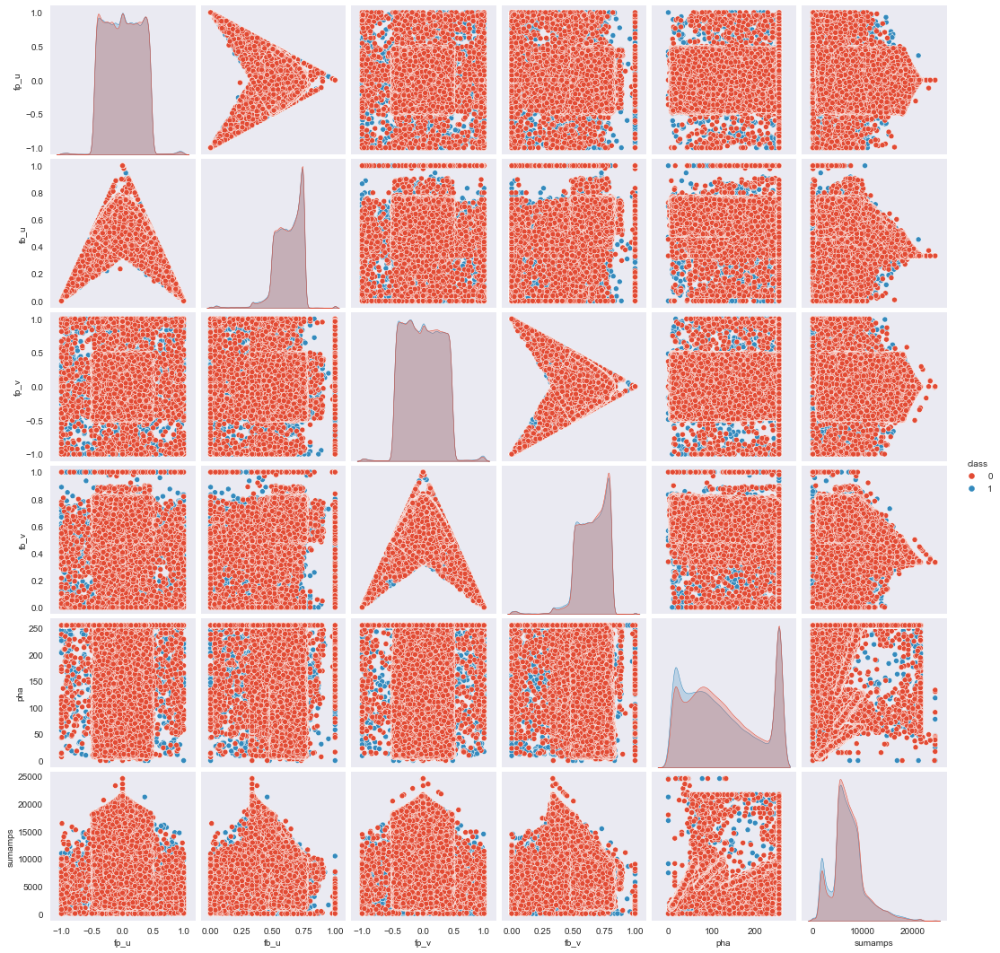

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 3897628
length of cutout after dropped nans 4243136
length going in 3897628
middle 16233.215379982827 16469.439565351935
indices inside [      9      53      59 ... 3897553 3897567 3897591] 233888
indices outside [      0       1       2 ... 3897625 3897626 3897627] 3663740
length going in 4243136
middle 16237.084426201502 16461.1966484327
indices inside [     55      57      61 ... 4243078 4243083 4243123] 195582
indices outside [      0       1       2 ... 4243133 4243134 4243135] 4047554
length after cutting out center 3663740


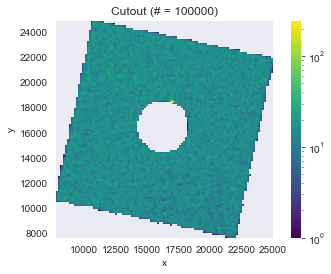

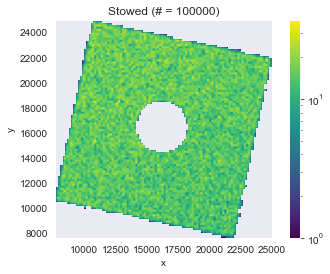

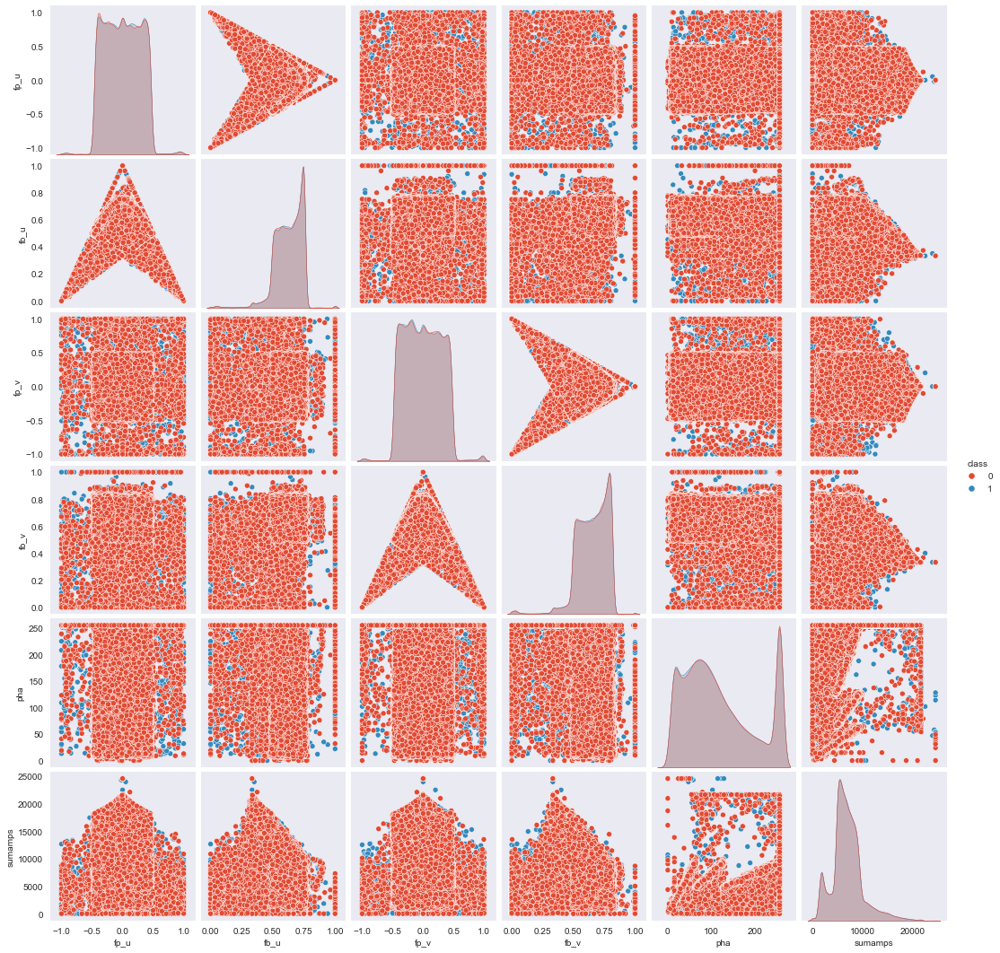

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2997249
length of cutout after dropped nans 82642
length going in 2997249
middle 16192.700317339697 16351.553702783953
indices inside [    505     977    1097 ... 2996131 2996780 2997123] 11462
indices outside [      0       1       2 ... 2997246 2997247 2997248] 2985787
length going in 82642
middle 16223.76553533675 16332.651989614242
indices inside [] 0
indices outside [    0     1     2 ... 82639 82640 82641] 82642
length after cutting out center 2985787


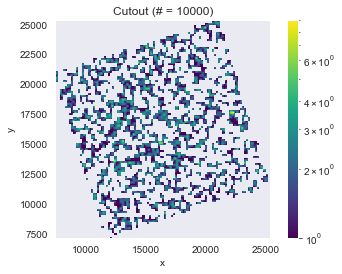

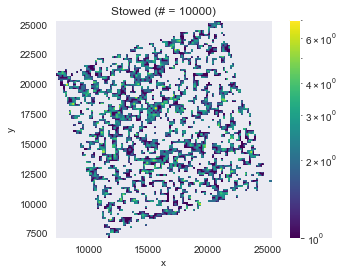

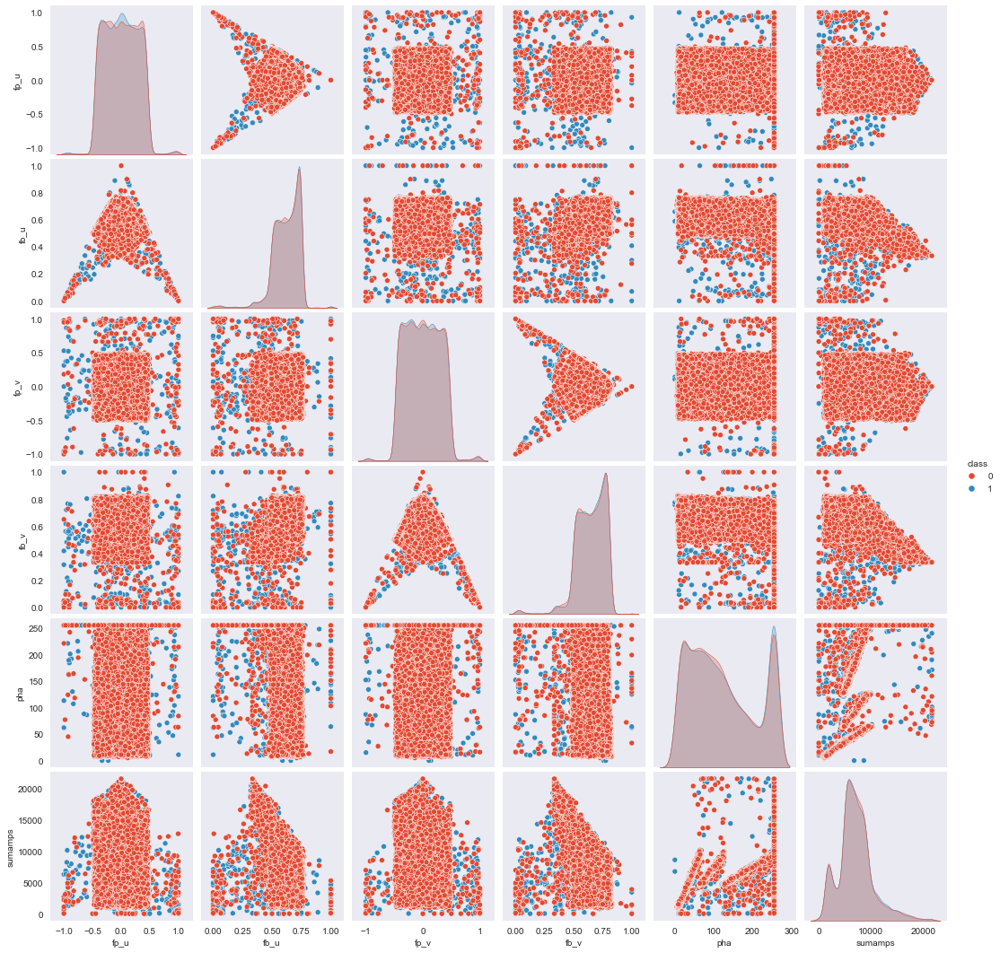

In [174]:
# Now comparing the cutout background to the stowed background in order to look for trends in the
# parameter distribution

# I'm specifically thinking that there might be trends with x and y because of focusing 
# when the telescope is 'open' during the cutout background observations

def self_label_center_circle(X, rad):
    # First locate where x and y position are within a ring
    xs = X['x'].values
    ys = X['y'].values
    
    print('length going in', len(xs))
    
    print('middle', np.mean(xs), np.mean(ys))
    
    indices_inside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 < rad**2 )[0]
    indices_outside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 > rad**2 )[0]
    print('indices inside', indices_inside, len(indices_inside))
    print('indices outside', indices_outside, len(indices_outside))
    
    
    
    return indices_inside, indices_outside


obsid_list = [1505,144,9219,591]
rad = [4000,1000,2000,500]
for j in range(len(obsid_list)):
    j = j+1
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    if j ==0:
        bg_stow = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j+1])+'.csv', index_col=0)
    else:
        bg_stow = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    bg_cutout = pd.read_csv(file_dir+'bg_dataframe_cutout_'+str(obsid_list[j])+'.csv', index_col=0)
    
    
    
    keep = bg_stow.columns[~bg_stow.isna().any()].tolist()
    bg_stow = bg_stow[keep]
    
    #keep = bg_cutout.columns[~bg_cutout.isna().any()].tolist()
    bg_cutout = bg_cutout[['crsv', 'crsu', 'amp_sf', 'av1', 'av2', 'av3', 'au1', 'au2',
       'au3', 'rawx', 'rawy', 'chipx', 'chipy', 'tdetx', 'tdety', 'detx',
       'dety', 'x', 'y', 'pha', 'pi', 'sumamps', 'chip_id', 'fp_u', 'fb_u',
       'fp_v', 'fb_v']]
    
    
    
    # Now create class labels, label all of the stowed background as 1
    bg_stow['class'] = 1
    bg_cutout['class'] = 0
    
    
    
    
    
    # Okay but you have to fix all of the bg_stow values which haven't been assigned:
    a_u = bg_stow["au1"]  # otherwise known as "a1"
    b_u = bg_stow["au2"]  # "a2"
    c_u = bg_stow["au3"]  # "a3"

    a_v = bg_stow["av1"]
    b_v = bg_stow["av2"]
    c_v = bg_stow["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    bg_stow['fp_u'] = fp_u
    bg_stow['fb_u'] = fb_u
    bg_stow['fp_v'] = fp_v
    bg_stow['fb_v'] = fb_v
    
    
    
    
    
    # This is what you need to preserve, drop everything else b/c there's a lot of NaNs:
    feature_list = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps','class']
    
    bg_stow = bg_stow[feature_list]
    bg_cutout = bg_cutout[feature_list]
    
    
    
    
    
    # drop nans before you fit:
    bg_stow = bg_stow.dropna()
    bg_cutout = bg_cutout.dropna()
    
    
    print('length of stowed after dropped nans', len(bg_stow))
    print('length of cutout after dropped nans', len(bg_cutout))
    
    
    # Now further chop out the center of the stowed background :)
    #
    indices_zero, indices_bg = self_label_center_circle(bg_stow,  rad[j])
    
    # Now save everything as its own csv file:
    bg_stow = pd.DataFrame(bg_stow.iloc[indices_bg], columns = bg_stow.columns)
    
    indices_zero, indices_bg = self_label_center_circle(bg_cutout,  rad[j])
    
    # Now save everything as its own csv file:
    bg_cutout = pd.DataFrame(bg_cutout.iloc[indices_bg], columns = bg_cutout.columns)
    
    print('length after cutting out center', len(bg_stow))
    
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    n_points = int(1e5)
    try:
        frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
    except ValueError:
        # This means n_points is bigger than the dataframe
        n_points = int(1e4)
        try:
            frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
        except:
            n_points = int(1e3)
            try:
                frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
            except:
                continue
    result = pd.concat(frames)
    
    
    
    
    
    
    feature_list_noclass = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
    X = result[feature_list_noclass]
    y = result['class'].values
    
    # First just compare the two visually:
    indices_zero = np.where(y==0)[0]
    indices_one = np.where(y==1)[0]
    
    plot_from_df(X.iloc[indices_zero], 
                 'Cutout (# = '+str(len(indices_zero))+')', 'x', 'y')
    plot_from_df(X.iloc[indices_one], 
                 'Stowed (# = '+str(len(indices_one))+')', 'x', 'y')
    
    # Okay plot a pairplot
    sns.pairplot(result[['fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps','class']], hue="class")
    plt.show()
    
    continue
    STOP

    
    #def scatter_plots(input_data, xaxis, yaxis, label):
    scatter_plots(X.iloc[indices_zero], 'fp_u','fb_u', 'Cutout')
    scatter_plots(X.iloc[indices_one], 'fp_u','fb_u', 'Stowed')
    
    scatter_plots(X.iloc[indices_zero], 'pha','sumamps', 'Cutout')
    scatter_plots(X.iloc[indices_one], 'pha','sumamps', 'Stowed')
    
    
    kde_plots(X.iloc[indices_zero], 'fp_u','fb_u')
    kde_plots(X.iloc[indices_one], 'fp_u','fb_u')
    
    kde_plots(X.iloc[indices_zero], 'pha','sumamps')
    kde_plots(X.iloc[indices_one], 'pha','sumamps')
    
    plot_from_df(X.iloc[indices_zero], 'Cutout', 'fp_u','fb_u')
    plot_from_df(X.iloc[indices_one], 'Stowed', 'fp_u','fb_u')
    #def plot_from_df(df, name, var1, var2):
    
    # Find a tool to look visually at full parameter distributions :)
    
    STOP
    
    
    

    
    bc = BaggingPuClassifier(
        DecisionTreeClassifier(), 
        n_estimators = 1000,  # 1000 trees as usual
        max_samples = int(sum(y < 1)),#sum(y), # Balance the positives and unlabeled in each bag
        n_jobs = -1           # Use all cores
    )
    bc.fit(X, y)
    
    # Store the scores assigned by this approach
    results_bag = pd.DataFrame({
        'label'      : y},        # The labels to be shown to models in experiment
        columns = ['label'])
    results_bag['output_bag'] = bc.oob_decision_function_[:,1]
    print(results_bag['output_bag'])
    
    
    # plot the results
    plt.scatter(
        X[y==0].fp_u, X[y==0].fb_u, 
        c = results_bag[y==0].output_bag, linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma'
    )
    plt.colorbar(label='Scores given to unlabeled points')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    

    result_science = results_bag[y==0].output_bag

    th = 0.5

    print(len(result_science[result_science > th]))
    print(len(result_science))
    indices_bg = np.where(result_science > th)
    indices_zero = np.where(result_science < th) # more similar to science

    xs = X[y==0].fp_u.values
    ys = X[y==0].fb_u.values
    cs = results_bag[y==0].output_bag.values

    print(xs)
    # Now reorganize the plot
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # now look at sumamps-pha plane
    xs = X[y==0].pha.values
    ys = X[y==0].sumamps.values
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_bg], ys[indices_bg], 
        c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t > 0.5, consistent with bg')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    plt.clf()
    '''im1 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
        cmap = 'magma', vmax=1, vmin=0
    )'''

    im2 = plt.scatter(
        xs[indices_zero], ys[indices_zero], 
        c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.95, 
        cmap = 'magma', vmax=1, vmin=0
    )
    plt.colorbar(im2, label='Unlabeled points, t < 0.5, consistent with science')
    plt.title(r'Using ${\tt BaggingClassifierPU}$')
    plt.show()
    
    
    # Now, figure out how to plot images of only the X-rays that are selected as real from the science data
    # and everything else :)
    n_points = int(1e5)

    print(feature_list)


    subsample_sci = sci.sample(n=n_points, random_state=1)
    subsample_sci = subsample_sci.dropna()
    pred_sci = bc.predict(subsample_sci[feature_list])

    print(pred_sci)


    print(np.where(pred_sci==-1)[0])
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 
                 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')', 'x', 'y')
    plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 
                 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')', 'x', 'y')

    subsample_bg = bg.sample(n=n_points, random_state=1)
    subsample_bg = subsample_bg.dropna()
    pred_bg = bc.predict(subsample_bg[feature_list])

    plot_from_df(subsample_bg.iloc[np.where(pred_bg==0)[0]], 
                 'Background, says this is science (# = '+str(len(np.where(pred_bg==0)[0]))+')', 'x', 'y',)
    plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 
                 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')', 'x', 'y')
    STOP

## Set up an RFR 

Goal: directly compare the cutout background to the stowed background

In [177]:


from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier

def testAndTrainIndices(test_fold, Nfolds, folds):

    print('finding test and train indices...')

    train_folds = np.delete(np.arange(Nfolds), test_fold)

    test_ind   = [i for i in range(len(folds)) if folds[i]==test_fold]
    train_ind  = [i for i in range(len(folds)) if folds[i] in train_folds]

    return test_ind, train_ind

def run_RFR(df_merg, features_list,  verbose):
    # These are adjustable RFR parameters
    Nfolds = 10
    Ndat = 5000

    features = df_merg[features_list].values
    #,'nspax','re'
    Nfeatures = len(features[0])
    
    #dat['features']#.reshape(-1,1)
    labels = df_merg[['class']].values
    folds = np.arange(len(labels))%Nfolds
    
    
    #Test on fold 0, train on the remaining folds:
    test_ind, train_ind = testAndTrainIndices(test_fold = 0, Nfolds = Nfolds, folds=folds)
    
    #divide features and labels into test and train sets:
    test_features = features[test_ind]
    test_labels   = labels[test_ind]
   
    train_features  = features[train_ind]
    train_labels    = labels[train_ind]

    print('training fold 0')
    #make a random forest model:
    model = RandomForestRegressor(max_depth=10, random_state=42)
    model.fit(train_features, train_labels)

    print('predicting...')
    # Predict on new data
    preds = model.predict(test_features)
    #print out the first few mass predictions to see if they make sense:
    if verbose=='yes':
        for h in range(10):
            print(test_labels[h], preds[h])


    # rank feature importance:
    importances = model.feature_importances_
    std = np.std([tree.feature_importances_ for tree in model.estimators_], axis=0)
    indices = np.argsort(importances)[::-1]

    if verbose=='yes':
        # Plot the feature importances of the forest
        plt.clf()
        plt.figure(figsize=(15,5))
        #plt.title("RFR Feature importances for "+str(run))
        plt.bar(range(Nfeatures), importances[indices], yerr=std[indices], align="center", color='pink')
        plt.xticks(range(Nfeatures), indices)
        plt.xlim([-1, Nfeatures])
        plt.show()
        
        #plt.savefig('feature_importance_'+str(run)+'_rando.pdf')
        
        
        
        print('Importance in Order ~~~~')
    
    # find the index of the random one:
    random_idx = features_list.index('random')
    random_value = importances[random_idx]
    random_std = std[random_idx]
    if verbose=='yes':
        print('random idx', random_idx)
        print('random_value', random_value)
    unin_here = []
    important_here = []
    for j in range(len(indices)):
        #if importances[indices[j]] - std[indices[j]] > 0:
        print(indices[j], features_list[indices[j]])
        if importances[indices[j]] > random_value:# or importances[indices[j]] - std[indices[j]] > random_value - random_std:
            important_here.append(features_list[indices[j]])
        else:
            unin_here.append(features_list[indices[j]])
        
  
    return important_here, unin_here, model



/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2901957
length of cutout after dropped nans 2223468
length going in 2901957
middle 16520.128668711448 16496.5183735888
indices inside [      2       3       6 ... 2901945 2901951 2901953] 702734
indices outside [      0       1       4 ... 2901954 2901955 2901956] 2199223
length going in 2223468
middle 16485.44143163449 16483.88352493833
indices inside [      0       2       5 ... 2223451 2223457 2223467] 554450
indices outside [      1       3       4 ... 2223464 2223465 2223466] 1669018
length after cutting out center 2199223
running the random forest


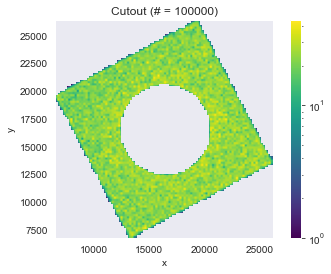

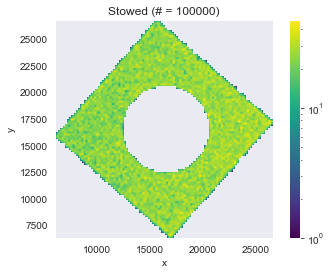

finding test and train indices...
training fold 0


/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/ipykernel_launcher.py:41: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


predicting...
[1] 0.8121578903845673
[1] 0.593080253977601
[1] 0.6701490250429571
[1] 0.5249836056608796
[1] 0.5647782595133011
[1] 0.5393004381323983
[1] 0.6541316174705097
[1] 0.6055254703749944
[1] 0.6809500866164201
[1] 0.9010355162290214


<Figure size 432x288 with 0 Axes>

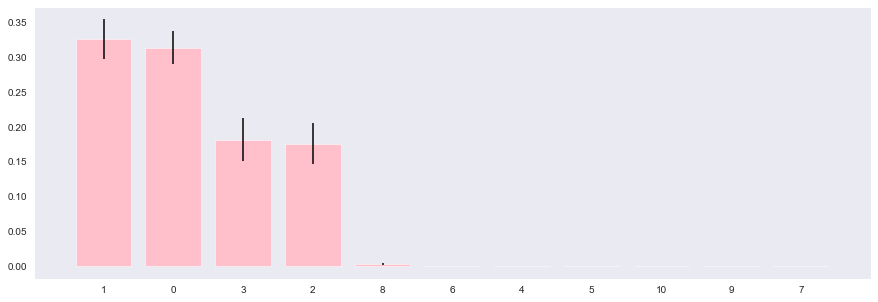

Importance in Order ~~~~
random idx 10
random_value 4.560262224097332e-05
1 crsv
0 crsu
3 y
2 x
8 pha
6 fp_v
4 fp_u
5 fb_u
10 random
9 sumamps
7 fb_v
~~~~~~~ RFR confusion~~~~~~~~~
[[97644  2356]
 [ 2625 97375]]
score 0.5967709263601655


<Figure size 432x288 with 0 Axes>

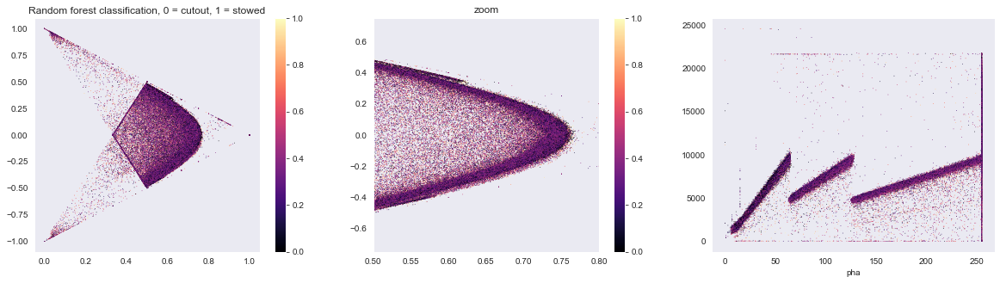

<Figure size 432x288 with 0 Axes>

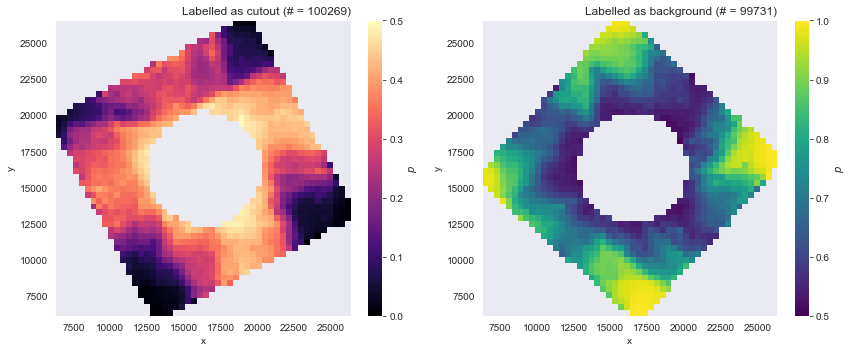

<Figure size 432x288 with 0 Axes>

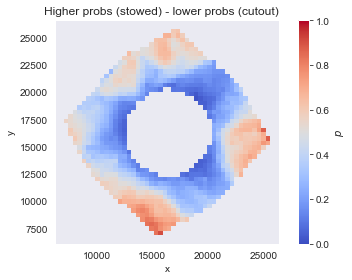

<Figure size 432x288 with 0 Axes>

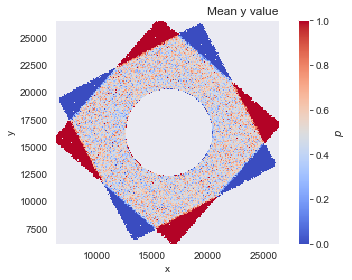

<Figure size 432x288 with 0 Axes>

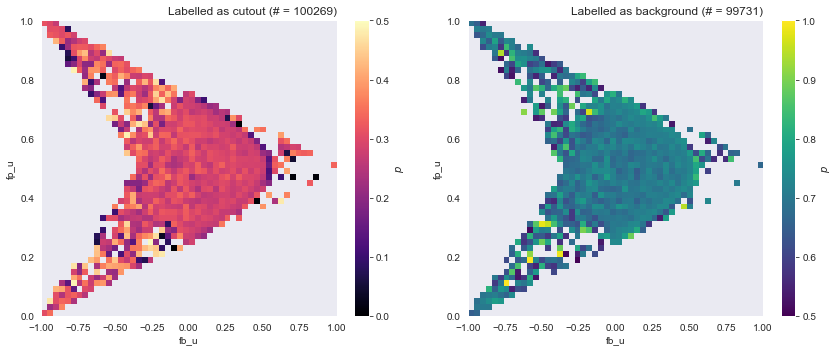

<Figure size 432x288 with 0 Axes>

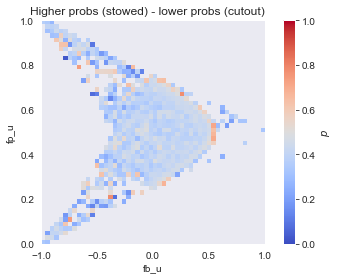

<Figure size 432x288 with 0 Axes>

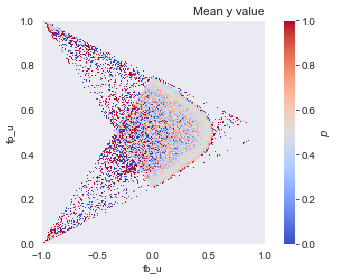

<Figure size 432x288 with 0 Axes>

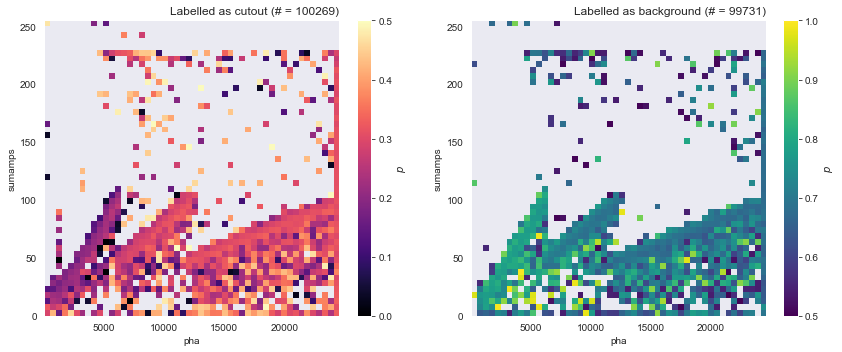

<Figure size 432x288 with 0 Axes>

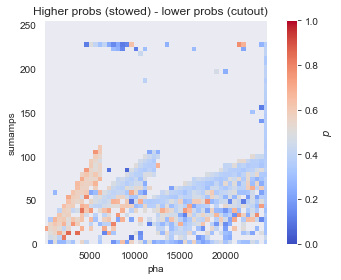

<Figure size 432x288 with 0 Axes>

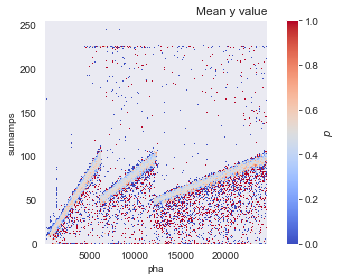

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2901957
length of cutout after dropped nans 1213066
length going in 2901957
middle 16520.128668711448 16496.5183735888
indices inside [     82     108     120 ... 2901798 2901856 2901897] 44469
indices outside [      0       1       2 ... 2901954 2901955 2901956] 2857488
length going in 1213066
middle 16456.395275349572 16541.331954798166
indices inside [     74     150     199 ... 1212661 1212846 1213022] 16874
indices outside [      0       1       2 ... 1213063 1213064 1213065] 1196192
length after cutting out center 2857488
running the random forest


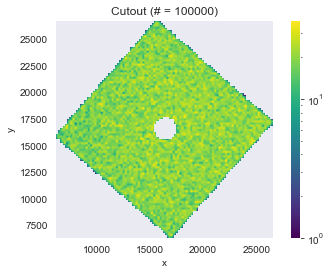

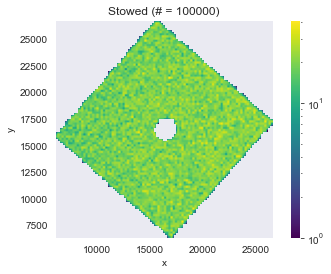

finding test and train indices...
training fold 0


/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/ipykernel_launcher.py:41: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


predicting...
[1] 0.48329881960484483
[1] 0.4899010547057145
[1] 0.5361884107369153
[1] 0.4842854827012756
[1] 0.48877350602090425
[1] 0.48603228692304895
[1] 0.5148100960497195
[1] 0.4806907879730552
[1] 0.4884948378995962
[1] 0.49411043801929183


<Figure size 432x288 with 0 Axes>

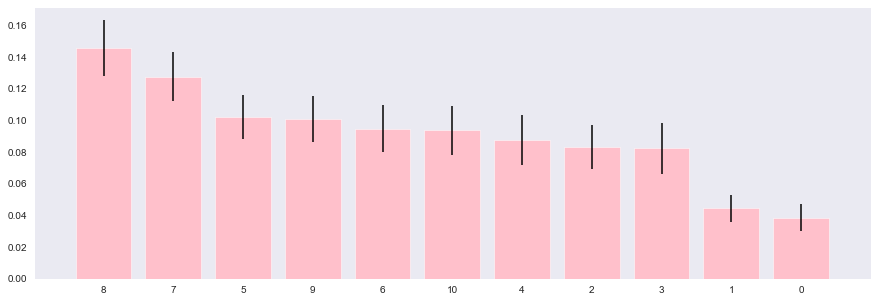

Importance in Order ~~~~
random idx 10
random_value 0.0935671187589197
8 pha
7 fb_v
5 fb_u
9 sumamps
6 fp_v
10 random
4 fp_u
2 x
3 y
1 crsv
0 crsu
~~~~~~~ RFR confusion~~~~~~~~~
[[70384 29616]
 [55626 44374]]
score 0.032875144035573456


<Figure size 432x288 with 0 Axes>

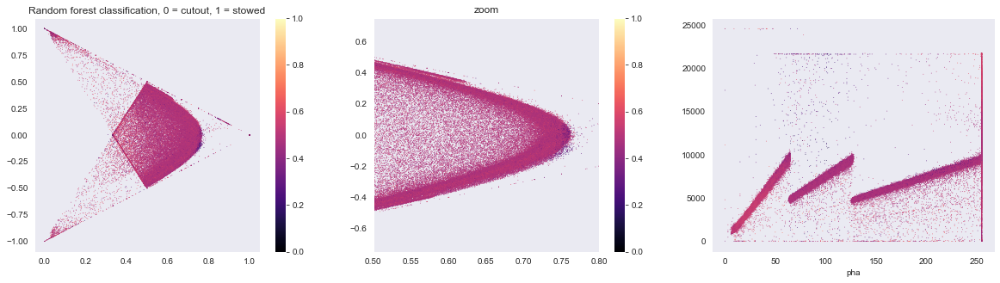

<Figure size 432x288 with 0 Axes>

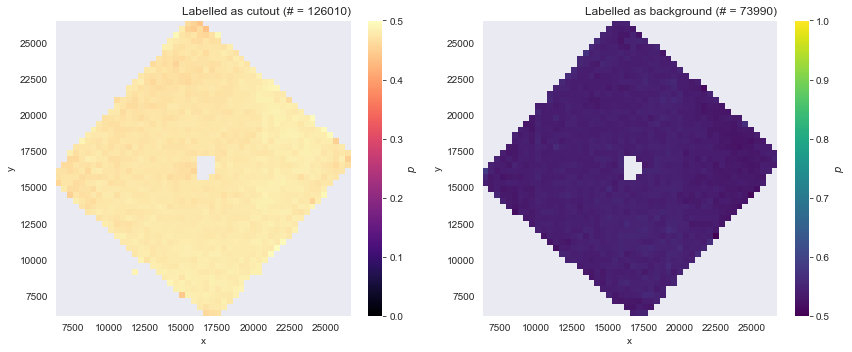

<Figure size 432x288 with 0 Axes>

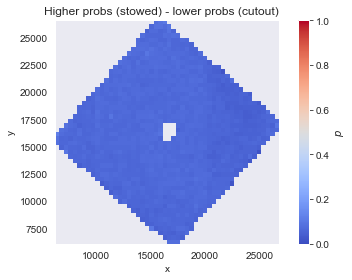

<Figure size 432x288 with 0 Axes>

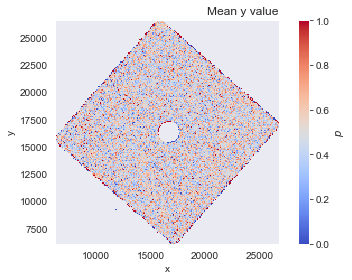

<Figure size 432x288 with 0 Axes>

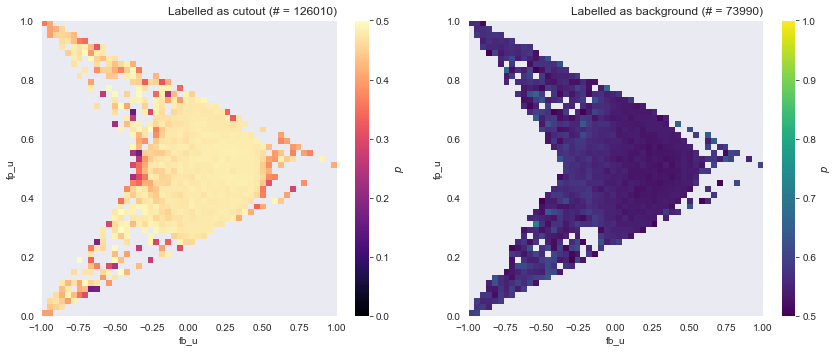

<Figure size 432x288 with 0 Axes>

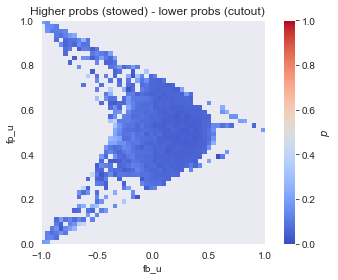

<Figure size 432x288 with 0 Axes>

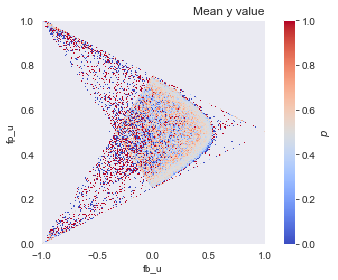

<Figure size 432x288 with 0 Axes>

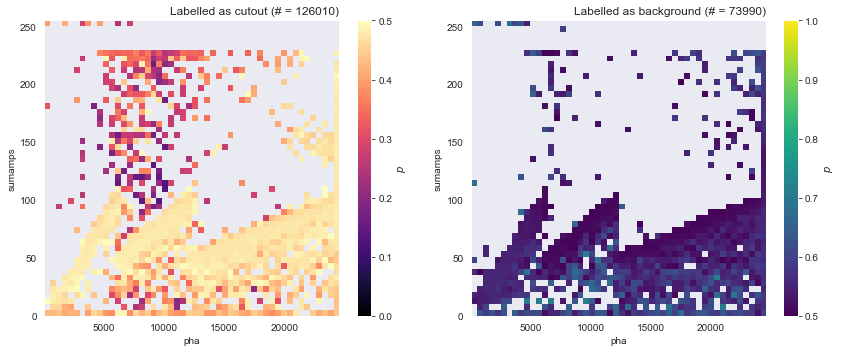

<Figure size 432x288 with 0 Axes>

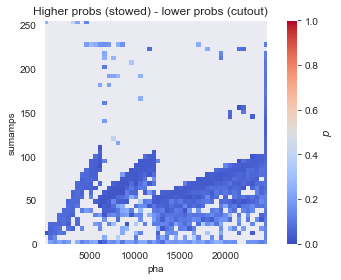

<Figure size 432x288 with 0 Axes>

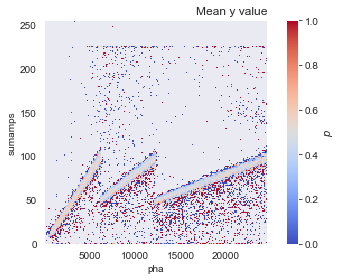

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 3897628
length of cutout after dropped nans 4243136
length going in 3897628
middle 16233.215379982827 16469.439565351935
indices inside [      9      33      45 ... 3897567 3897591 3897610] 365586
indices outside [      0       1       2 ... 3897625 3897626 3897627] 3532042
length going in 4243136
middle 16237.084426201502 16461.1966484327
indices inside [     13      55      57 ... 4243083 4243098 4243123] 352217
indices outside [      0       1       2 ... 4243133 4243134 4243135] 3890919
length after cutting out center 3532042
running the random forest


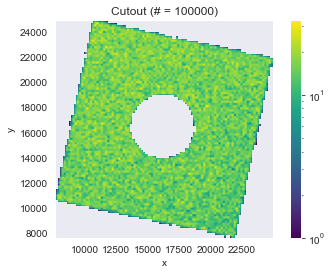

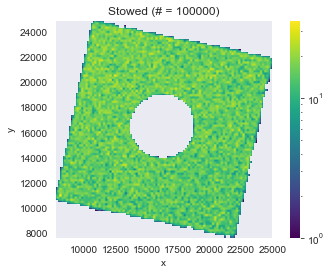

finding test and train indices...
training fold 0


/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/ipykernel_launcher.py:41: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


predicting...
[1] 0.49205915245692344
[1] 0.4999511005538949
[1] 0.5017369240574198
[1] 0.4896356363155527
[1] 0.4979525331790082
[1] 0.4814568120356675
[1] 0.5015842049184134
[1] 0.500019349889433
[1] 0.4897111315801855
[1] 0.5007549426936246


<Figure size 432x288 with 0 Axes>

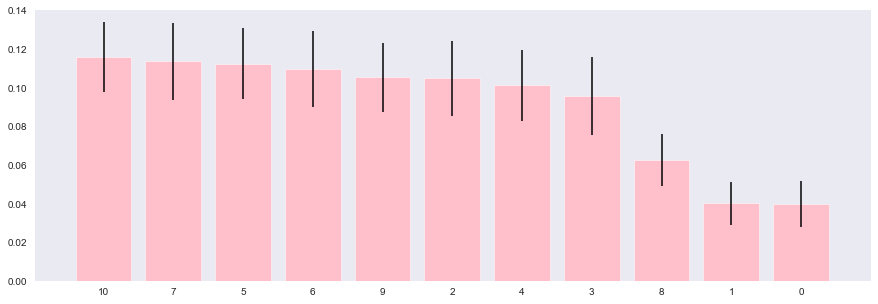

Importance in Order ~~~~
random idx 10
random_value 0.11566618764896401
10 random
7 fb_v
5 fb_u
6 fp_v
9 sumamps
2 x
4 fp_u
3 y
8 pha
1 crsv
0 crsu
~~~~~~~ RFR confusion~~~~~~~~~
[[70123 29877]
 [44950 55050]]
score 0.019692522050654193


<Figure size 432x288 with 0 Axes>

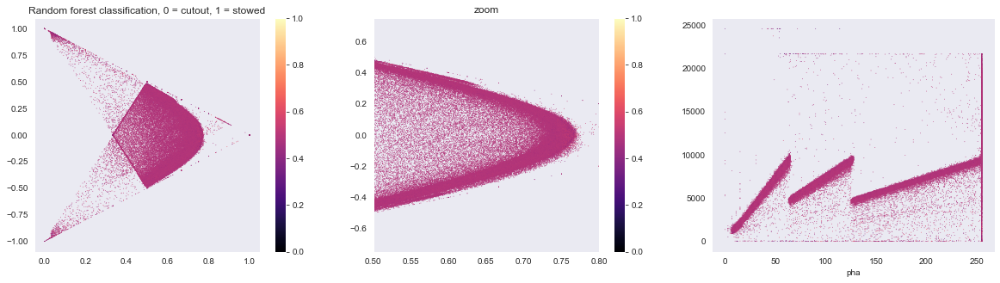

<Figure size 432x288 with 0 Axes>

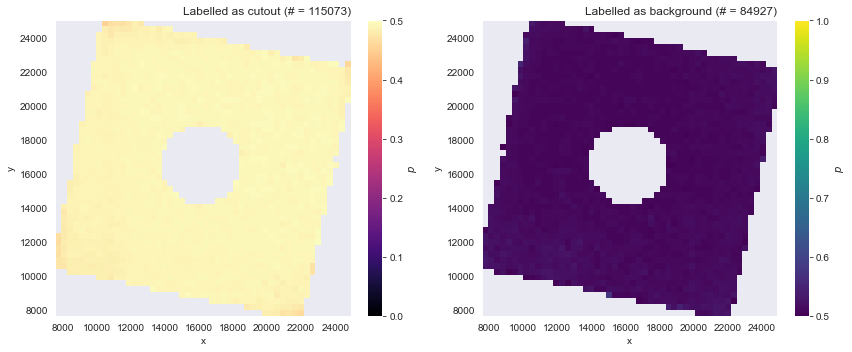

<Figure size 432x288 with 0 Axes>

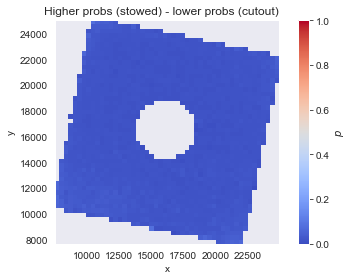

<Figure size 432x288 with 0 Axes>

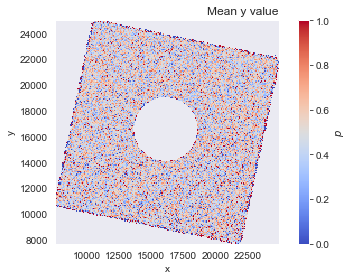

<Figure size 432x288 with 0 Axes>

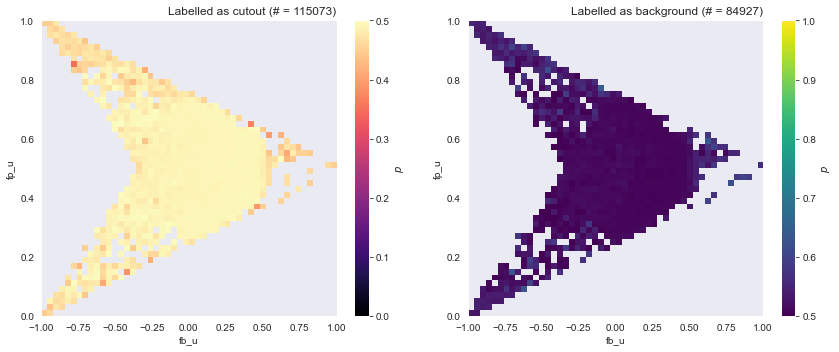

<Figure size 432x288 with 0 Axes>

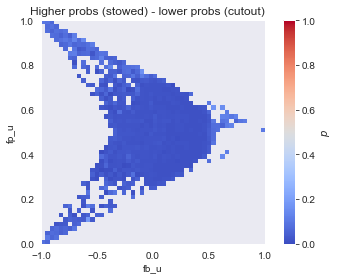

<Figure size 432x288 with 0 Axes>

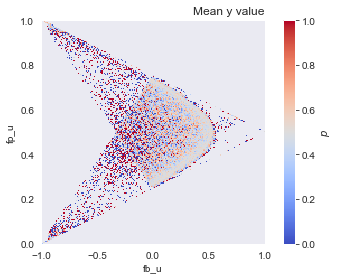

<Figure size 432x288 with 0 Axes>

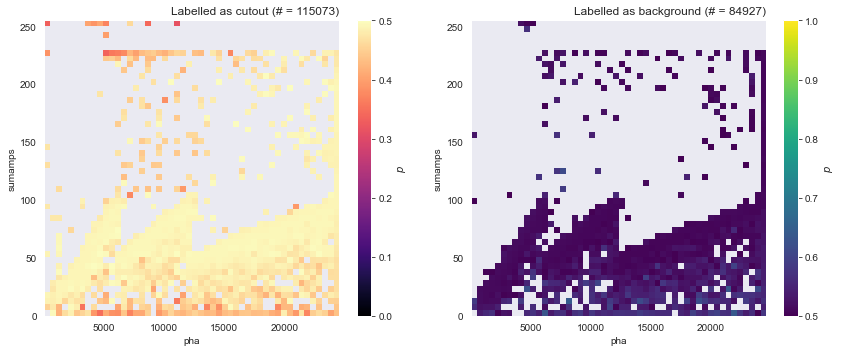

<Figure size 432x288 with 0 Axes>

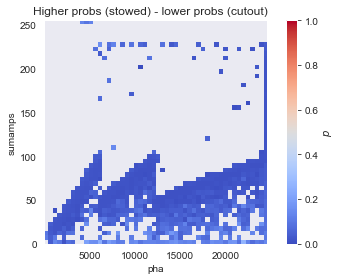

<Figure size 432x288 with 0 Axes>

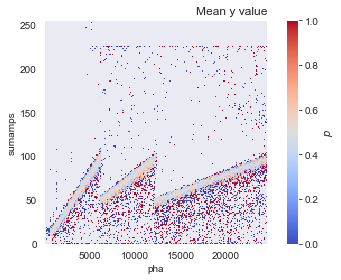

/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/numpy/lib/arraysetops.py:569: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  mask |= (ar1 == a)


length of stowed after dropped nans 2997249
length of cutout after dropped nans 82642
length going in 2997249
middle 16192.700317339697 16351.553702783953
indices inside [    505     977    1097 ... 2996131 2996780 2997123] 11462
indices outside [      0       1       2 ... 2997246 2997247 2997248] 2985787
length going in 82642
middle 16223.76553533675 16332.651989614242
indices inside [] 0
indices outside [    0     1     2 ... 82639 82640 82641] 82642
length after cutting out center 2985787
running the random forest


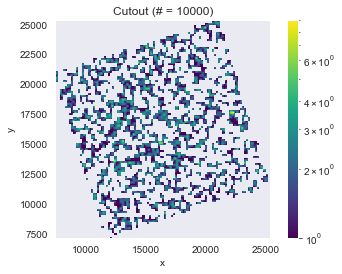

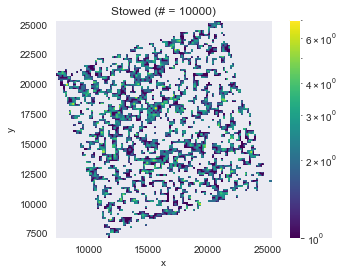

finding test and train indices...
training fold 0


/Users/beckynevin/anaconda3/envs/ciao-4.12/lib/python3.7/site-packages/ipykernel_launcher.py:41: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().


predicting...
[1] 0.4886284037821854
[1] 0.48588315235534096
[1] 0.5008212747391552
[1] 0.5006456926911858
[1] 0.4703912510258157
[1] 0.47084049624101537
[1] 0.48969926303300615
[1] 0.5028261466393552
[1] 0.49371240182472215
[1] 0.528404298092267


<Figure size 432x288 with 0 Axes>

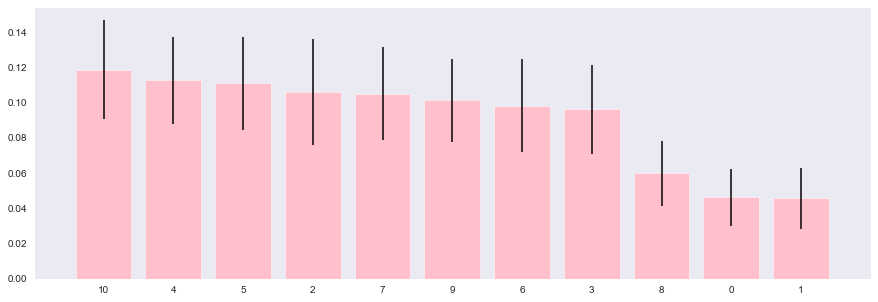

Importance in Order ~~~~
random idx 10
random_value 0.11855948753836915
10 random
4 fp_u
5 fb_u
2 x
7 fb_v
9 sumamps
6 fp_v
3 y
8 pha
0 crsu
1 crsv
~~~~~~~ RFR confusion~~~~~~~~~
[[8423 1577]
 [2461 7539]]
score 0.1065805860362985


<Figure size 432x288 with 0 Axes>

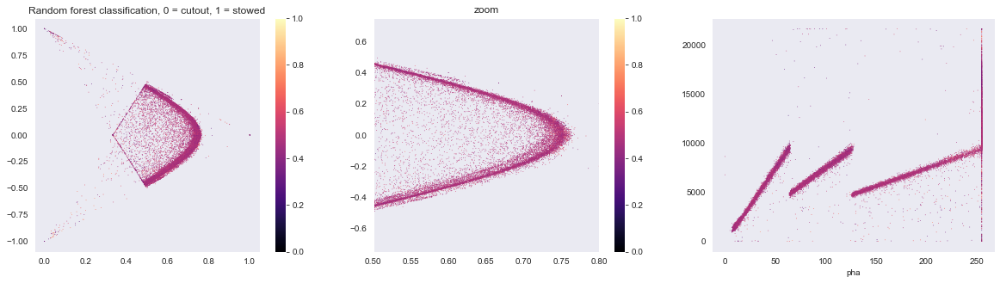

<Figure size 432x288 with 0 Axes>

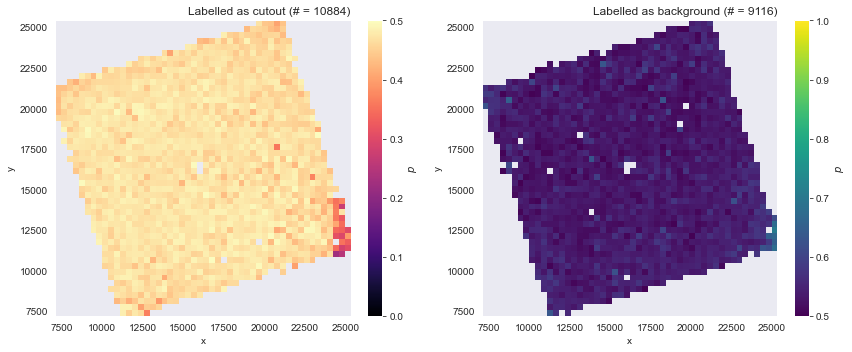

<Figure size 432x288 with 0 Axes>

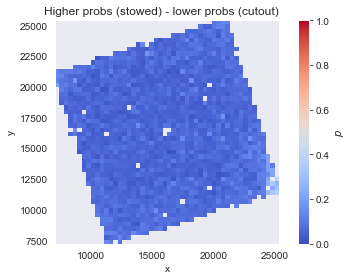

<Figure size 432x288 with 0 Axes>

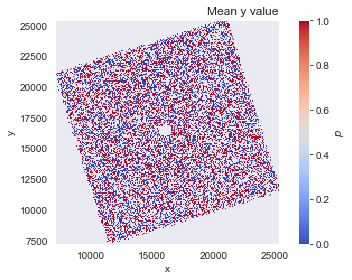

<Figure size 432x288 with 0 Axes>

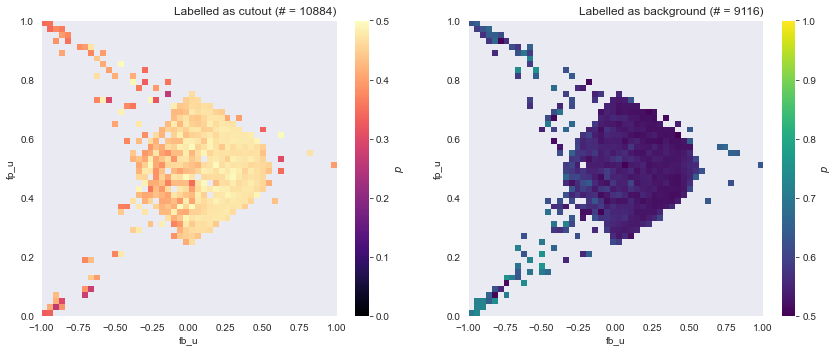

<Figure size 432x288 with 0 Axes>

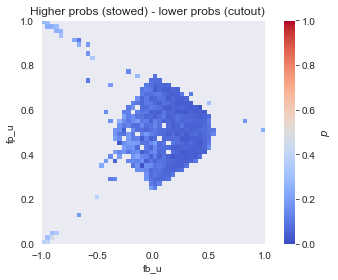

<Figure size 432x288 with 0 Axes>

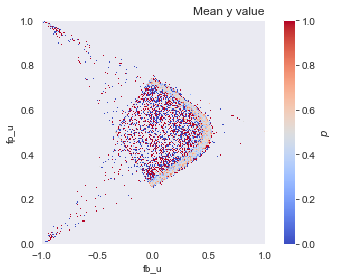

<Figure size 432x288 with 0 Axes>

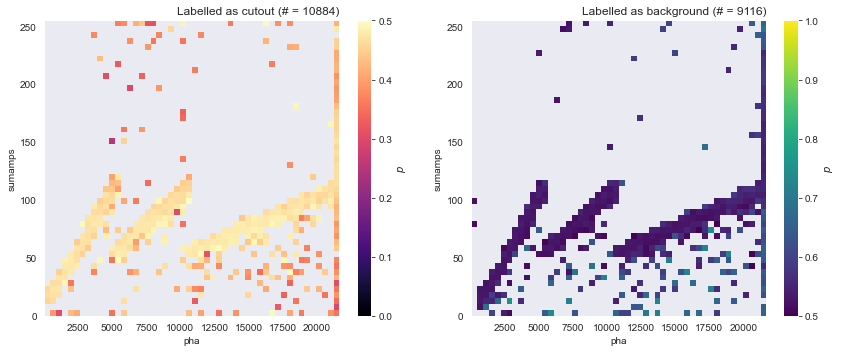

<Figure size 432x288 with 0 Axes>

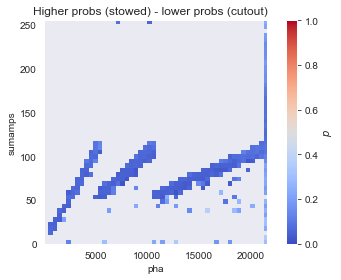

<Figure size 432x288 with 0 Axes>

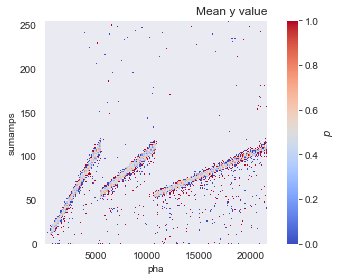

In [209]:
# Gearing up to run an RFR

# Now, run a random forest to see which features are most informative
# 
from statsmodels.multivariate.manova import MANOVA
import statsmodels.api as sm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix


# I'm specifically thinking that there might be trends with x and y because of focusing 
# when the telescope is 'open' during the cutout background observations

def self_label_center_circle(X, rad):
    # First locate where x and y position are within a ring
    xs = X['x'].values
    ys = X['y'].values
    
    print('length going in', len(xs))
    
    print('middle', np.mean(xs), np.mean(ys))
    
    indices_inside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 < rad**2 )[0]
    indices_outside = np.where((xs-np.mean(xs))**2+(ys-np.mean(ys))**2 > rad**2 )[0]
    print('indices inside', indices_inside, len(indices_inside))
    print('indices outside', indices_outside, len(indices_outside))
    
    
    
    return indices_inside, indices_outside

def plot_difference_scipy(X, results_bag, xaxis, yaxis, idx_zero, idx_one, thresh):
    # Makes density of the probabilities as a function of various spaces
    
    xmin = np.min([np.min(X.iloc[idx_zero][xaxis]),np.min(X.iloc[idx_one][xaxis])])
    xmax = np.max([np.max(X.iloc[idx_zero][xaxis]),np.max(X.iloc[idx_one][xaxis])])
    
    ymin = np.min([np.min(X.iloc[idx_zero][yaxis]),np.min(X.iloc[idx_one][yaxis])])
    ymax = np.max([np.max(X.iloc[idx_zero][yaxis]),np.max(X.iloc[idx_zero][yaxis])])
    
    xs_sci = X.iloc[idx_zero][xaxis]
    ys_sci = X.iloc[idx_zero][yaxis]
    
    xs_bg = X.iloc[idx_one][xaxis]
    ys_bg = X.iloc[idx_one][yaxis]
    
    
    plt.clf()
    sns.set_style('dark')
    fig=plt.figure(figsize=(12,5))
    #plt.subplots_adjust(top = 0.99, bottom=0.01, hspace=0.5, wspace=0.1)


    ax1=fig.add_subplot(121)
    ax1.set_title('Labelled as cutout (# = '+str(len(idx_zero))+')', loc='right')
    
     
    heatmap, xedges, yedges, binnumber = scipy.stats.binned_statistic_2d(ys_sci, 
                                                                         xs_sci, results_bag[idx_zero],
                                                                         statistic='mean', bins=50)
      
    heatmapnon, xedgesnon, yedgesnon, binnumber = scipy.stats.binned_statistic_2d(ys_bg, 
                                                                                  xs_bg, 
                                                                                  results_bag[idx_one],
                                                                                  statistic='mean', bins=50)
     
    
    if thresh == 0:
        im1 = ax1.imshow(np.flipud(heatmap), cmap='magma', vmin=0, vmax=1,
                     extent=[ ymin, ymax,xmin, xmax], interpolation='None')
    else:
        im1 = ax1.imshow(np.flipud(heatmap), cmap='magma', vmin=0, vmax=thresh,
                     extent=[ ymin, ymax,xmin, xmax], interpolation='None')
      
    ax1.set_ylim(xmin, xmax)
    ax1.set_xlim(ymin, ymax)
    ax1.set_aspect((ymax-ymin)/(xmax-xmin))

   
     
    plt.colorbar(im1, fraction=0.046, label=r'$p$')
    ax1.set_xlabel(xaxis)
    ax1.set_ylabel(yaxis)
    #ax1.set_aspect((ymax-ymin)/(xmax-xmin))

    ax2=fig.add_subplot(122)
    ax2.set_title('Labelled as background (# = '+str(len(idx_one))+')', loc='right')
    if thresh==0:
        im2 = ax2.imshow(np.flipud(heatmapnon), cmap='magma', vmin=0, vmax=1,extent=[ymin, ymax, xmin, xmax])
    else:
        im2 = ax2.imshow(np.flipud(heatmapnon), cmap='viridis', vmin=thresh, vmax=1,extent=[ymin, ymax, xmin, xmax])
    ax2.set_ylim(xmin, xmax)
    ax2.set_xlim(ymin, ymax)
    plt.colorbar(im2, fraction=0.046, label=r'$p$')
    ax2.set_xlabel(xaxis)
    ax2.set_ylabel(yaxis)
    ax2.set_aspect((ymax-ymin)/(xmax-xmin))

    plt.tight_layout()
    plt.show()
    
    # Make a plot that is the higher probabilities minus the smaller probabilities
    plt.clf()
    fig = plt.figure()
    ax2=fig.add_subplot(111)
    ax2.set_title('Higher probs (stowed) - lower probs (cutout)', loc='right')
    im2 = ax2.imshow(np.flipud(heatmapnon) - np.flipud(heatmap), cmap='coolwarm', vmin=0, vmax=1,extent=[ymin, ymax, xmin, xmax])
    ax2.set_ylim(xmin, xmax)
    ax2.set_xlim(ymin, ymax)
    plt.colorbar(im2, fraction=0.046, label=r'$p$')
    ax2.set_xlabel(xaxis)
    ax2.set_ylabel(yaxis)
    ax2.set_aspect((ymax-ymin)/(xmax-xmin))

    plt.tight_layout()
    plt.show()
def scipy_plot_initial_data(X, y, xaxis, yaxis, idx_zero, idx_one, nbins):
    
    
    
    xmin = np.min([np.min(X.iloc[idx_zero][xaxis]),np.min(X.iloc[idx_one][xaxis])])
    xmax = np.max([np.max(X.iloc[idx_zero][xaxis]),np.max(X.iloc[idx_one][xaxis])])
    
    ymin = np.min([np.min(X.iloc[idx_zero][yaxis]),np.min(X.iloc[idx_one][yaxis])])
    ymax = np.max([np.max(X.iloc[idx_zero][yaxis]),np.max(X.iloc[idx_zero][yaxis])])
    
    xs_sci = X.iloc[idx_zero][xaxis]
    ys_sci = X.iloc[idx_zero][yaxis]
    
    xs_bg = X.iloc[idx_one][xaxis]
    ys_bg = X.iloc[idx_one][yaxis]
    
    
    fake_neg_ones = [-1 for x in ys_sci]
    fake_pos_ones = [1 for x in ys_bg]
    
     
    heatmap, xedges, yedges, binnumber = scipy.stats.binned_statistic_2d(X[yaxis], 
                                                                         X[xaxis], y,
                                                                         statistic='mean', bins=nbins)
      
    heatmapnon, xedgesnon, yedgesnon, binnumber = scipy.stats.binned_statistic_2d(ys_bg, 
                                                                                  xs_bg, 
                                                                                  fake_pos_ones,
                                                                                  statistic='mean', bins=nbins)
    
    # Make a plot that is the higher probabilities minus the smaller probabilities
    
    
    
    plt.clf()
    fig = plt.figure()
    ax2=fig.add_subplot(111)
    ax2.set_title('Mean y value', loc='right')
    im2 = ax2.imshow(np.flipud(heatmap), cmap='coolwarm', vmin=0, vmax=1,extent=[ymin, ymax, xmin, xmax], interpolation='None')
    ax2.set_ylim(xmin, xmax)
    ax2.set_xlim(ymin, ymax)
    plt.colorbar(im2, fraction=0.046, label=r'$p$')
    ax2.set_xlabel(xaxis)
    ax2.set_ylabel(yaxis)
    ax2.set_aspect((ymax-ymin)/(xmax-xmin))

    plt.tight_layout()
    plt.show()
    
    

obsid_list = [1505,144,9219,591]
rad = [4000,1000,2500,500]
for j in range(len(obsid_list)):
    
    file_dir = "/Users/beckynevin/CfA_Code/HRC/hyperscreen/notebooks/csv_files/"
    if j ==0:
        bg_stow = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j+1])+'.csv', index_col=0)
    else:
        bg_stow = pd.read_csv(file_dir+'bg_dataframe_'+str(obsid_list[j])+'.csv', index_col=0)
    bg_cutout = pd.read_csv(file_dir+'bg_dataframe_cutout_'+str(obsid_list[j])+'.csv', index_col=0)
    
    
    
    keep = bg_stow.columns[~bg_stow.isna().any()].tolist()
    bg_stow = bg_stow[keep]
    
    #keep = bg_cutout.columns[~bg_cutout.isna().any()].tolist()
    bg_cutout = bg_cutout[['crsv', 'crsu', 'amp_sf', 'av1', 'av2', 'av3', 'au1', 'au2',
       'au3', 'rawx', 'rawy', 'chipx', 'chipy', 'tdetx', 'tdety', 'detx',
       'dety', 'x', 'y', 'pha', 'pi', 'sumamps', 'chip_id', 'fp_u', 'fb_u',
       'fp_v', 'fb_v']]
    
    
    
    # Now create class labels, label all of the stowed background as 1
    bg_stow['class'] = 1
    bg_cutout['class'] = 0
    
    
    
    
    
    # Okay but you have to fix all of the bg_stow values which haven't been assigned:
    a_u = bg_stow["au1"]  # otherwise known as "a1"
    b_u = bg_stow["au2"]  # "a2"
    c_u = bg_stow["au3"]  # "a3"

    a_v = bg_stow["av1"]
    b_v = bg_stow["av2"]
    c_v = bg_stow["av3"]

    with np.errstate(invalid='ignore'):
        # Do the U axis
        fp_u = ((c_u - a_u) / (a_u + b_u + c_u))
        fb_u = b_u / (a_u + b_u + c_u)

        # Do the V axis
        fp_v = ((c_v - a_v) / (a_v + b_v + c_v))
        fb_v = b_v / (a_v + b_v + c_v)

    bg_stow['fp_u'] = fp_u
    bg_stow['fb_u'] = fb_u
    bg_stow['fp_v'] = fp_v
    bg_stow['fb_v'] = fb_v
    
    
    
    
    
    # This is what you need to preserve, drop everything else b/c there's a lot of NaNs:
    feature_list = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps','class']
    
    bg_stow = bg_stow[feature_list]
    bg_cutout = bg_cutout[feature_list]
    
    
    
    
    
    # drop nans before you fit:
    bg_stow = bg_stow.dropna()
    bg_cutout = bg_cutout.dropna()
    
    
    print('length of stowed after dropped nans', len(bg_stow))
    print('length of cutout after dropped nans', len(bg_cutout))
    
    
    
    
    
    # Now further chop out the center of the stowed background :)
    #
    indices_zero, indices_bg = self_label_center_circle(bg_stow,  rad[j])
    
    # Now save everything as its own csv file:
    bg_stow = pd.DataFrame(bg_stow.iloc[indices_bg], columns = bg_stow.columns)
    
    indices_zero, indices_bg = self_label_center_circle(bg_cutout,  rad[j])
    
    # Now save everything as its own csv file:
    bg_cutout = pd.DataFrame(bg_cutout.iloc[indices_bg], columns = bg_cutout.columns)
    
    print('length after cutting out center', len(bg_stow))
    
    
    # print('length of positives', len(bg), 'length of unlabelled', len(sci))
    # now randomly sample from each
    n_points = int(1e5)
    try:
        frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
    except ValueError:
        # This means n_points is bigger than the dataframe
        n_points = int(1e4)
        try:
            frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
        except:
            n_points = int(1e3)
            try:
                frames = [bg_stow.sample(n=n_points, random_state=1), bg_cutout.sample(n=n_points, random_state=1)]
            except:
                continue
    result = pd.concat(frames)
    
    
    
    
    
    
    
    feature_list_noclass = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps']
    
    y = result['class'].values
    random_numbers = np.random.random(size=len(result))

    result['random'] = random_numbers



    print('running the random forest')

    feature_list_RFR = ['crsu','crsv','x','y','fp_u', 'fb_u', 'fp_v', 'fb_v','pha', 'sumamps', 'random']
    X = result[feature_list_RFR]
    

    # First just compare the two visually:
    indices_zero = np.where(y==0)[0]
    indices_one = np.where(y==1)[0]
    
    plot_from_df(X.iloc[indices_zero], 
                 'Cutout (# = '+str(len(indices_zero))+')', 'x', 'y')
    plot_from_df(X.iloc[indices_one], 
                 'Stowed (# = '+str(len(indices_one))+')', 'x', 'y')



    
    


    terms_RFR, reject_terms_RFR, model_RFR = run_RFR(result, feature_list_RFR, 'yes')

    # Try to go ahead and run it as a classifier
    preds = model_RFR.predict(X)

    binary_preds = []
    for j in range(len(preds)):
        if preds[j] > 0.5:
            binary_preds.append(1)
        else:
            binary_preds.append(0)
    print('~~~~~~~ RFR confusion~~~~~~~~~')
    print(confusion_matrix(y,binary_preds))
    print('score', model_RFR.score(X, y))
    
    
    
    cmap='magma'

    plt.clf()
    fig = plt.figure(figsize=(20,5))
    ax0 = fig.add_subplot(131)
    im0 = ax0.scatter(X['fb_u'], X['fp_u'], c=preds, s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im0)
    ax0.set_title('Random forest classification, 0 = cutout, 1 = stowed')

    ax1 = fig.add_subplot(132)
    im1 = ax1.scatter(X['fb_u'], X['fp_u'], c=preds, s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im1)
    ax1.set_xlim([0.5,0.8])
    ax1.set_ylim([-0.75,0.75])
    ax1.set_title('zoom')

    ax2 = fig.add_subplot(133)
    im2 = ax2.scatter(X['pha'], X['sumamps'], c=preds, s=0.1, cmap=cmap, vmin=0, vmax=1)
    ax2.set_xlabel('pha')
    plt.show()
    
    # Okay plot only the points that are below the threshold
    indices_cutout = np.where(np.array(binary_preds)==0)[0]
    indices_stowed = np.where(np.array(binary_preds)==1)[0]
    
    
    
    # Difference histogram here
    plot_difference_scipy(X, preds,'x', 'y', indices_cutout, indices_stowed, 0.5)
    scipy_plot_initial_data(X, y, 'x', 'y', indices_cutout, indices_stowed, 200)
    
    plot_difference_scipy(X, preds,'fb_u', 'fp_u', indices_cutout, indices_stowed, 0.5)
    scipy_plot_initial_data(X, y, 'fb_u', 'fp_u', indices_cutout, indices_stowed, 200)
    
    plot_difference_scipy(X, preds,'pha', 'sumamps', indices_cutout, indices_stowed, 0.5)
    scipy_plot_initial_data(X, y, 'pha', 'sumamps', indices_cutout, indices_stowed, 200)
    
    continue
    
    
    plt.clf()
    fig = plt.figure(figsize=(20,5))
    ax0 = fig.add_subplot(131)
    im0 = ax0.scatter(X.iloc[indices_cutout]['fb_u'], X.iloc[indices_cutout]['fp_u'], 
                      c=preds[indices_cutout], s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im0)
    ax0.set_title('Classified as Cutout')

    ax1 = fig.add_subplot(132)
    im1 = ax1.scatter(X.iloc[indices_cutout]['fb_u'], X.iloc[indices_cutout]['fp_u'], 
                      c=preds[indices_cutout], s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im1)
    ax1.set_xlim([0.5,0.8])
    ax1.set_ylim([-0.75,0.75])
    ax1.set_title('zoom')

    ax2 = fig.add_subplot(133)
    im2 = ax2.scatter(X.iloc[indices_cutout]['pha'], X.iloc[indices_cutout]['sumamps'], 
                      c=preds[indices_cutout], s=0.1, cmap=cmap, vmin=0, vmax=1)
    ax2.set_xlabel('pha')
    plt.show()
    
    plt.clf()
    fig = plt.figure(figsize=(20,5))
    ax0 = fig.add_subplot(131)
    im0 = ax0.scatter(X.iloc[indices_stowed]['fb_u'], X.iloc[indices_stowed]['fp_u'], 
                      c=preds[indices_stowed], s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im0)
    ax0.set_title('Classified as Stowed')

    ax1 = fig.add_subplot(132)
    im1 = ax1.scatter(X.iloc[indices_stowed]['fb_u'], X.iloc[indices_stowed]['fp_u'], 
                      c=preds[indices_stowed], s=0.1, cmap=cmap, vmin=0, vmax=1)
    plt.colorbar(im1)
    ax1.set_xlim([0.5,0.8])
    ax1.set_ylim([-0.75,0.75])
    ax1.set_title('zoom')

    ax2 = fig.add_subplot(133)
    im2 = ax2.scatter(X.iloc[indices_stowed]['pha'], X.iloc[indices_stowed]['sumamps'], 
                      c=preds[indices_stowed], s=0.1, cmap=cmap, vmin=0, vmax=1)
    ax2.set_xlabel('pha')
    plt.show()
    
    
   
    
    



In [ ]:
# Maybe look at spatial distribution as a function of various other things like energy

['crsu', 'crsv', 'x', 'y', 'fp_u', 'fb_u', 'fp_v', 'fb_v', 'pha', 'sumamps']
[0 0 0 ... 1 1 1]
[]


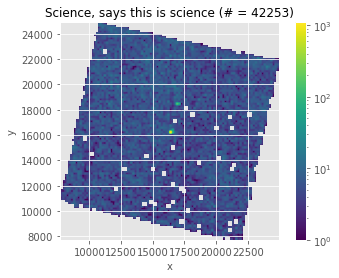

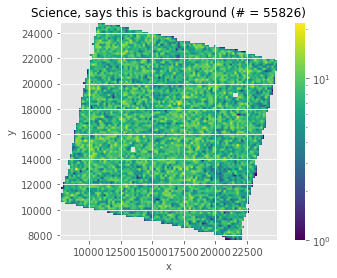

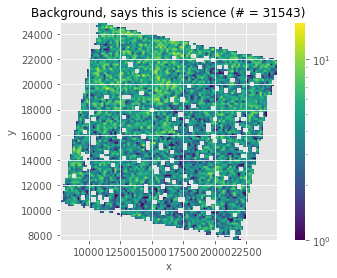

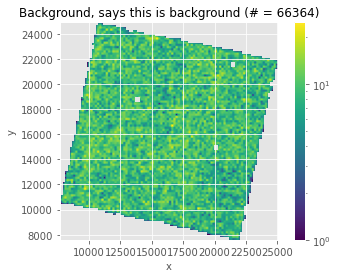

In [15]:
# Now print the results for the bagging classifier

'''from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay


tn, fp, fn, tp = confusion_matrix(test['class'].values,y_pred).ravel()

print(tn, fp, fn, tp)

cm = confusion_matrix(test['class'].values,y_pred)#, labels=svm.classes_)


plt.clf()
fig = plt.figure(figsize=(6,5))
sns.set(font_scale=1.4) # for label size
sns.heatmap([[tn, fp],[fn, tp]], annot=True, annot_kws={"size": 16}, cmap='viridis') # font size
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()'''




# Now, figure out how to plot images of only the X-rays that are selected as real from the science data
# and everything else :)
n_points = int(1e5)

print(feature_list)


subsample_sci = sci.sample(n=n_points, random_state=1)
subsample_sci = subsample_sci.dropna()
pred_sci = bc.predict(subsample_sci[feature_list])

print(pred_sci)


print(np.where(pred_sci==-1)[0])
plot_from_df(subsample_sci.iloc[np.where(pred_sci==0)[0]], 'Science, says this is science (# = '+str(len(np.where(pred_sci==0)[0]))+')')
plot_from_df(subsample_sci.iloc[np.where(pred_sci==1)[0]], 'Science, says this is background (# = '+str(len(np.where(pred_sci==1)[0]))+')')

subsample_bg = bg.sample(n=n_points, random_state=1)
subsample_bg = subsample_bg.dropna()
pred_bg = bc.predict(subsample_bg[feature_list])

plot_from_df(subsample_bg.iloc[np.where(pred_bg==0)[0]], 'Background, says this is science (# = '+str(len(np.where(pred_bg==0)[0]))+')')
plot_from_df(subsample_bg.iloc[np.where(pred_bg==1)[0]], 'Background, says this is background (# = '+str(len(np.where(pred_bg==1)[0]))+')')




In [24]:
# Add a column, to label bg as such
n_points = int(1e5)
if n_points > len(df_casa):
    n_points = len(df_casa)
df_bg['class'] = 1
df_casa['class'] = 0

In [25]:

frames = [df_bg.sample(n=n_points, random_state=1), df_casa.sample(n=n_points, random_state=1)]

result = pd.concat(frames)

In [26]:
# Define X and y:
feature_list = ['x','y','crsu', 'crsv', 'pha', 'pi', 'sumamps', 'fp_u', 'fb_u',
       'fp_v', 'fb_v']
X = pd.DataFrame(result[feature_list].values, columns=feature_list)
y = pd.Series(result['class'].values)

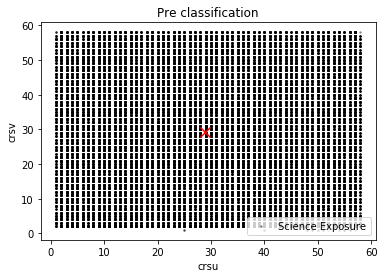

NameError: name 'STOP' is not defined

In [27]:
# Visualize the data before classifying
# Visualize this approach's results

#selection = ((np.where(X[y==0].x > 20000)) and (np.where(X[y==0].y > 35000)))


plt.clf()
plt.scatter(
    X[y==0].crsu, X[y==0].crsv,linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('crsu')
plt.ylabel('crsv')
plt.title(r'Pre classification')
plt.scatter(np.mean(X[y==0].crsu),np.mean(X[y==0].crsv), color='red', s=100, marker='x')
plt.show()
STOP


plt.clf()
plt.scatter(
    X[y==0].x, X[y==0].y,linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title(r'Pre classification')
plt.scatter(np.mean(X[y==0].x),np.mean(X[y==0].y), color='red', s=100, marker='x')
plt.show()


# Try to cut out everything in a 10" circle [or square] around the center
plt.clf()
plt.scatter(
    X[y==0].x[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000], 
    X[y==0].y[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000],
    linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title(r'Outside Nebula')
plt.show()

# Try to cut out everything in a 10" circle [or square] around the center
plt.clf()
plt.scatter(
    X[y==0].x[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000], 
    X[y==0].y[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000],
    linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title(r'Inside Nebula')
plt.show()




plt.clf()
plt.scatter(
    X[y==1].x, X[y==1].y,linewidth = 0, s = 5, alpha = 0.5, color='orange',label='Stowed Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('x')
plt.ylabel('y')
plt.title(r'Pre classification')
plt.show()



plt.clf()

plt.scatter(
    X[y==0].fp_u, X[y==0].fb_u,linewidth = 0, s = 5, color='black', alpha = 0.5, label='Science Exposure'
)

#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('fp_u')
plt.ylabel('fb_u')
plt.title(r'Pre classification')
plt.show()


plt.clf()

plt.scatter(
    X[y==0].fp_u, X[y==0].fb_u,linewidth = 0, s = 5, color='black', alpha = 0.5, label='Science Exposure'
)

#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('fp_u')
plt.ylabel('fb_u')
plt.title(r'Pre classification')
plt.show()

plt.clf()
plt.scatter(
    X[y==0].fp_u[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000],
    X[y==0].fb_u[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000],
    linewidth = 0, s = 5, color='black', alpha = 0.5, label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('fp_u')
plt.ylabel('fb_u')
plt.title(r'Pre classification Inside')
plt.show()

plt.clf()
plt.scatter(
    X[y==0].fp_u[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000],
    X[y==0].fb_u[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000],
    linewidth = 0, s = 5, color='black', alpha = 0.5, label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('fp_u')
plt.ylabel('fb_u')
plt.title(r'Pre classification Outside')
plt.show()

plt.clf()
plt.scatter(
    X[y==1].fp_u,
    X[y==1].fb_u,
    linewidth = 0, s = 5, color='orange', alpha = 0.5, label='Stowed Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('fp_u')
plt.ylabel('fb_u')
plt.title(r'Stowed')
plt.show()


plt.clf()
plt.scatter(
    X[y==0].pha, X[y==0].sumamps,linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('pha')
plt.ylabel('sumamps')
plt.title(r'Pre classification')
plt.show()

plt.clf()
plt.scatter(
    X[y==0].pha[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000], 
    X[y==0].sumamps[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000],
    linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('pha')
plt.ylabel('sumamps')
plt.title(r'Pre classification Inside')
plt.show()

plt.clf()
plt.scatter(
    X[y==0].pha[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000], 
    X[y==0].sumamps[np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000],
    linewidth = 0, s = 5, alpha = 0.5, color='black', label='Science Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('pha')
plt.ylabel('sumamps')
plt.title(r'Pre classification Outside')
plt.show()

plt.clf()
plt.scatter(
    X[y==1].pha, X[y==1].sumamps,linewidth = 0, s = 5, alpha = 0.5, color='orange',label='Stowed Exposure'
)
#plt.colorbar(label='Scores given to unlabeled points')
plt.legend()
plt.xlabel('pha')
plt.ylabel('sumamps')
plt.title(r'Pre classification')
plt.show()

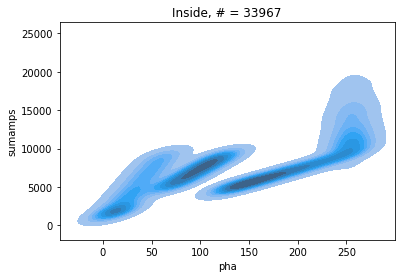

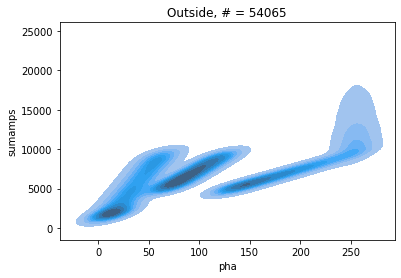

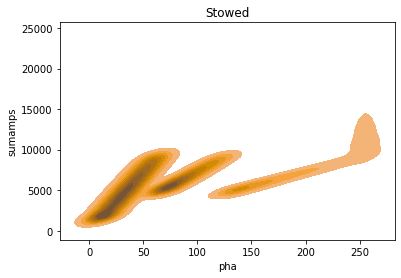

In [28]:
# Visualize this better, possibly using kde plots
import seaborn as sns

plt.clf()
sns.kdeplot(data = X[y==0][np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000], 
            x="pha", y="sumamps", fill=True)
plt.title('Inside, # = '+str(len(X[y==0][np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) < 5000])))
plt.show()

plt.clf()
sns.kdeplot(data = X[y==0][np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000], 
            x="pha", y="sumamps", fill=True)
plt.title('Outside, # = '+str(len(X[y==0][np.sqrt((X[y==0].x - np.mean(X[y==0].x))**2 + (X[y==0].y - np.mean(X[y==0].y))**2) > 5000])))
plt.show()

plt.clf()
sns.kdeplot(data = X[y==1], 
            x="pha", y="sumamps", fill=True, color='Orange')
plt.title('Stowed')
plt.show()

print(y)
hidden_size = 2700
y.loc[np.random.choice(y[y == 1].index, replace = False, size = hidden_size)] = 0

In [11]:
from pulearn import BaggingPuClassifier
from sklearn.tree import DecisionTreeClassifier
bc = BaggingPuClassifier(
    DecisionTreeClassifier(), 
    n_estimators = 1000,  # 1000 trees as usual
    max_samples = sum(y), # Balance the positives and unlabeled in each bag
    n_jobs = -1           # Use all cores
)
bc.fit(X, y)

BaggingPuClassifier(base_estimator=DecisionTreeClassifier(class_weight=None,
                                                          criterion='gini',
                                                          max_depth=None,
                                                          max_features=None,
                                                          max_leaf_nodes=None,
                                                          min_impurity_decrease=0.0,
                                                          min_impurity_split=None,
                                                          min_samples_leaf=1,
                                                          min_samples_split=2,
                                                          min_weight_fraction_leaf=0.0,
                                                          presort=False,
                                                          random_state=None,
                                                      

In [7]:
# Store the scores assigned by this approach
results = pd.DataFrame({
    'label'      : y},        # The labels to be shown to models in experiment
    columns = ['label'])

In [8]:
results['output_bag'] = bc.oob_decision_function_[:,1]
print(results['output_bag'])

0         NaN
1         NaN
2         NaN
3         NaN
4         NaN
5         NaN
6         NaN
7         NaN
8         NaN
9         NaN
10        NaN
11        NaN
12        NaN
13        NaN
14        NaN
15        NaN
16        NaN
17        NaN
18        NaN
19        NaN
20        NaN
21        NaN
22        NaN
23        NaN
24        NaN
25        NaN
26        NaN
27        NaN
28        NaN
29        NaN
         ... 
199970    0.0
199971    0.0
199972    0.0
199973    0.0
199974    0.0
199975    0.0
199976    0.0
199977    0.0
199978    0.0
199979    0.0
199980    0.0
199981    0.0
199982    0.0
199983    0.0
199984    0.0
199985    0.0
199986    0.0
199987    0.0
199988    0.0
199989    0.0
199990    0.0
199991    0.0
199992    0.0
199993    0.0
199994    0.0
199995    0.0
199996    0.0
199997    0.0
199998    0.0
199999    0.0
Name: output_bag, Length: 200000, dtype: float64


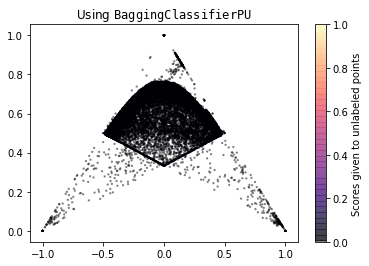

2
100000
[ 0.16803279 -0.31203008 -0.05789271 ... -0.05343029  0.19872156
 -0.23345818]


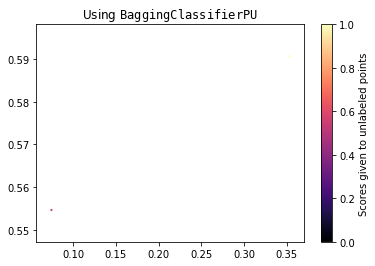

In [76]:
import numpy as np
plt.scatter(
    X[y==0].fp_u, X[y==0].fb_u, 
    c = results[y==0].output_bag, linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma'
)
plt.colorbar(label='Scores given to unlabeled points')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

result_science = results[y==0].output_bag

th = 0.5

print(len(result_science[result_science > th]))
print(len(result_science))
indices_bg = np.where(result_science > th)
indices_zero = np.where(result_science < th)

xs = X[y==0].fp_u.values
ys = X[y==0].fb_u.values
cs = results[y==0].output_bag.values

print(xs)
# Now reorganize the plot
plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_bg], ys[indices_bg], 
    c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Scores given to unlabeled points')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

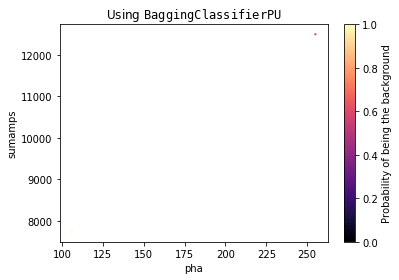

In [77]:
xs = X[y==0].pha.values
ys = X[y==0].sumamps.values 

plt.clf()
'''im1 = plt.scatter(
    xs[indices_zero], ys[indices_zero], 
    c = cs[indices_zero], linewidth = 0, s = 5, alpha = 0.5, 
    cmap = 'magma', vmax=1, vmin=0
)'''

im2 = plt.scatter(
    xs[indices_bg], ys[indices_bg], 
    c = cs[indices_bg], linewidth = 0, s = 5, alpha = 0.95, 
    cmap = 'magma', vmax=1, vmin=0
)
plt.colorbar(im2, label='Probability of being the background')
plt.xlabel('pha')
plt.ylabel('sumamps')
plt.title(r'Using ${\tt BaggingClassifierPU}$')
plt.show()

In [13]:
# try to plot Cas A with and without these background events, see what happens, 
# maybe also compare to the hyperbola classification



nbins=1e2

x = X[y==0].x.values[X[y==0].x.values>20000] 
#['x'][0:n_points].values[np.array(binary_preds)==1]#model_lda.predict(xs)
y = X[y==0].y.values[X[y==0].x.values>20000] 
#df['y'][0:n_points].values[np.array(binary_preds)==1]


img_data_me, yedges, xedges = np.histogram2d(y, x, nbins)
extent = [xedges[0], xedges[-1], yedges[0], yedges[-1]]

plt.clf()
fig = plt.figure()
ax2 = fig.add_subplot(111)
im2 = ax2.imshow(img_data_me, extent=extent, norm=matplotlib.colors.LogNorm(),
               interpolation=None, rasterized=True, cmap='magma', origin='lower')
plt.colorbar(im2)
ax2.set_title('All Cas A')

plt.show()

ValueError: Item wrong length 7179 instead of 200000.

In [68]:
# It looks the same? 
print(results[y==0].output_bag)

10000    0
10001    0
10002    0
10003    0
10004    0
10005    0
10006    0
10007    0
10008    0
10009    0
10010    0
10011    0
10012    0
10013    0
10014    0
10015    0
10016    0
10017    0
10018    0
10019    0
10020    0
10021    0
10022    0
10023    0
10024    0
10025    0
10026    0
10027    0
10028    0
10029    0
        ..
19970    0
19971    0
19972    0
19973    0
19974    0
19975    0
19976    0
19977    0
19978    0
19979    0
19980    0
19981    0
19982    0
19983    0
19984    0
19985    0
19986    0
19987    0
19988    0
19989    0
19990    0
19991    0
19992    0
19993    0
19994    0
19995    0
19996    0
19997    0
19998    0
19999    0
Name: output_bag, Length: 10000, dtype: int64
